<a href="https://colab.research.google.com/github/jrariasf/MD/blob/master/Copia_de_Untitled1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

✅ Inicio: Descargando datos históricos de QUIK (USD)...


[*********************100%***********************]  1 of 1 completed


📊 Datos descargados: 6549 filas.
✅ Calculando SMA50 y SMA200...
✅ SMA calculadas (si hay suficientes datos).
✅ Detectando pullbacks...
✅ Pullbacks detectados: SMA50=1592, SMA200=418
📈 Filas para gráfico: 127


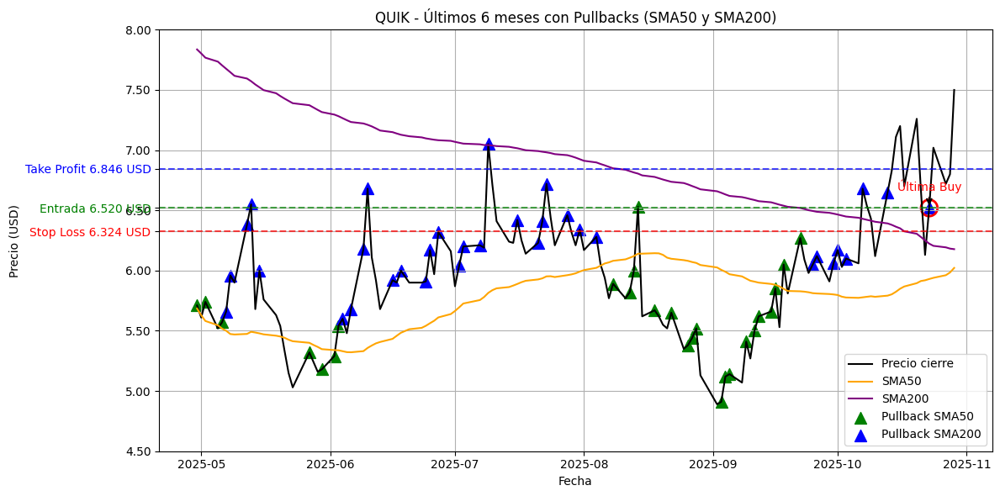

✅ Gráfico generado.
✅ Pullbacks detectados en los últimos 6 meses: 59
Price      Close   SMA50   SMA200      Signal
Ticker      QUIK                             
Date                                         
2025-09-18  6.05  5.8486  6.53855   Buy_SMA50
2025-09-22  6.27  5.8278  6.52010   Buy_SMA50
2025-09-25  6.05  5.8124  6.49490  Buy_SMA200
2025-09-26  6.12  5.8098  6.48800  Buy_SMA200
2025-09-30  6.06  5.8018  6.47280  Buy_SMA200
2025-10-01  6.17  5.7970  6.46540  Buy_SMA200
2025-10-03  6.10  5.7764  6.44865  Buy_SMA200
2025-10-07  6.68  5.7778  6.42990  Buy_SMA200
2025-10-13  6.65  5.7918  6.39150  Buy_SMA200
2025-10-23  6.52  5.9298  6.22365  Buy_SMA200

💰 Niveles de trading (última Buy):
Entrada sugerida: 6.520 USD
Stop Loss: 6.324 USD
Take Profit: 6.846 USD
📈 Filas para gráfico: 42


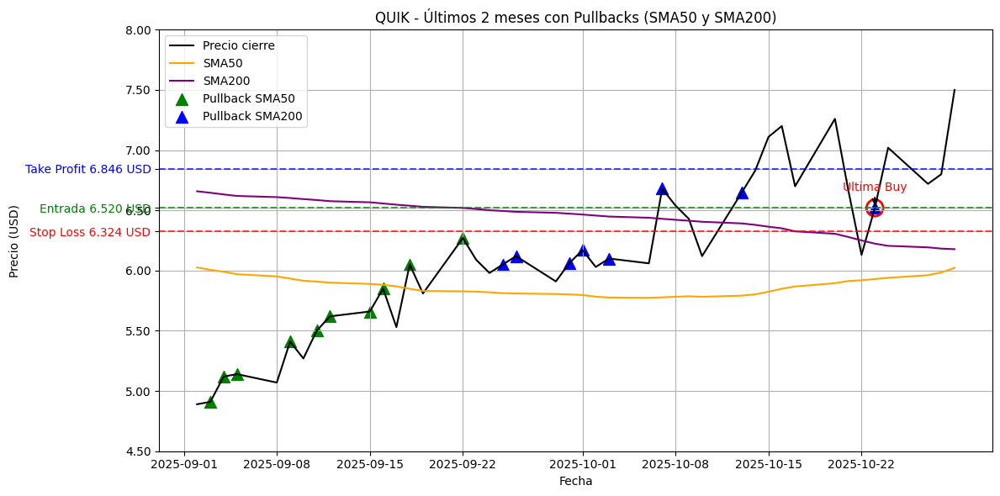

✅ Gráfico generado.


In [ ]:
#Script sin warnings con los textos de Take Profit en la izquierda
#y con gráficas de 6 y 2 últimos meses:

import yfinance as yf
import pandas as pd
import matplotlib.pyplot as plt
from pandas.tseries.offsets import MonthEnd

# =========================
# CONFIGURACIÓN
# =========================
SYMBOL = "QUIK"  # Cambia a "DAL", "AAPL", etc.

# Detectar moneda automáticamente
# moneda = "EUR" if SYMBOL.endswith(".MC") else "USD"
ticker_info = yf.Ticker(SYMBOL).info
moneda = ticker_info.get('currency', 'USD')

print(f"✅ Inicio: Descargando datos históricos de {SYMBOL} ({moneda})...")
df = yf.download(SYMBOL, period="max", interval="1d", auto_adjust=True)

if 'Close' not in df.columns or df.empty:
    raise ValueError("❌ No se pudieron descargar datos de cierre.")
print(f"📊 Datos descargados: {len(df)} filas.")

# =========================
# CALCULAR SMA50 Y SMA200
# =========================
print("✅ Calculando SMA50 y SMA200...")
df['SMA50'] = df['Close'].rolling(window=50).mean() if len(df) >= 50 else pd.Series([None]*len(df), index=df.index)
df['SMA200'] = df['Close'].rolling(window=200).mean() if len(df) >= 200 else pd.Series([None]*len(df), index=df.index)
print("✅ SMA calculadas (si hay suficientes datos).")

# =========================
# DETECCIÓN DE PULLBACKS CON DISTINCIÓN SMA50 / SMA200
# =========================
print("✅ Detectando pullbacks...")
pullbacks_sma50 = []
pullbacks_sma200 = []
signals = []

if len(df) >= 50:
    for i in range(1, len(df)):
        close_prev = float(df['Close'].iloc[i-1].item())
        close_curr = float(df['Close'].iloc[i].item())
        sma50 = float(df['SMA50'].iloc[i-1].item()) if pd.notna(df['SMA50'].iloc[i-1]) else None
        sma200 = float(df['SMA200'].iloc[i-1].item()) if pd.notna(df['SMA200'].iloc[i-1]) else None

        signal = ''
        if (sma50 is not None) and (sma200 is not None):
            if close_curr > close_prev:
                if close_prev <= sma50:
                    pullbacks_sma50.append(df.index[i])
                    signal = 'Buy_SMA50'
                elif close_prev <= sma200:
                    pullbacks_sma200.append(df.index[i])
                    signal = 'Buy_SMA200'
        signals.append(signal)
else:
    print(f"⚠️ Solo hay {len(df)} datos. No se pueden detectar pullbacks.")

df = df.iloc[1:].copy()
df['Signal'] = signals
print(f"✅ Pullbacks detectados: SMA50={len(pullbacks_sma50)}, SMA200={len(pullbacks_sma200)}")

# =========================
# FILTRAR ÚLTIMOS 6 MESES PARA GRÁFICO
# =========================
ultimo_dato = df.index.max()
inicio_periodo = ultimo_dato - MonthEnd(6)
df_plot = df.loc[df.index >= inicio_periodo]
pullbacks_plot_sma50 = [p for p in pullbacks_sma50 if p >= inicio_periodo]
pullbacks_plot_sma200 = [p for p in pullbacks_sma200 if p >= inicio_periodo]
print(f"📈 Filas para gráfico: {len(df_plot)}")

# =========================
# GRAFICAR
# =========================
plt.figure(figsize=(12,6))
plt.plot(df_plot.index, df_plot['Close'], label='Precio cierre', color='black')

if df_plot['SMA50'].notna().any():
    plt.plot(df_plot.index, df_plot['SMA50'], label='SMA50', color='orange')
if df_plot['SMA200'].notna().any():
    plt.plot(df_plot.index, df_plot['SMA200'], label='SMA200', color='purple')

# Dibujar pullbacks
if pullbacks_plot_sma50:
    plt.scatter(pullbacks_plot_sma50, df_plot.loc[pullbacks_plot_sma50, 'Close'],
                marker='^', s=100, color='green', label='Pullback SMA50')
if pullbacks_plot_sma200:
    plt.scatter(pullbacks_plot_sma200, df_plot.loc[pullbacks_plot_sma200, 'Close'],
                marker='^', s=100, color='blue', label='Pullback SMA200')

# Última Buy
last_buy_candidates = pullbacks_plot_sma50 + pullbacks_plot_sma200
last_buy = max(last_buy_candidates) if last_buy_candidates else None
if last_buy:
    last_price = float(df_plot.loc[last_buy, 'Close'].iloc[0])
    plt.scatter(last_buy, last_price, s=200, facecolors='none', edgecolors='red', linewidths=2)
    plt.annotate('Última Buy', xy=(last_buy, last_price),
                 xytext=(0,15), textcoords='offset points', ha='center',
                 color='red', fontsize=10, arrowprops=dict(facecolor='red', arrowstyle='->', lw=1.5))

    # Niveles de trading
    entry = last_price
    stop = float(entry * 0.97)
    target = float(entry * 1.05)
    trade_levels = {'Entrada': entry, 'Stop Loss': stop, 'Take Profit': target}
    colors = {'Entrada':'green','Stop Loss':'red','Take Profit':'blue'}

    for label, level in trade_levels.items():
        plt.axhline(level, color=colors[label], linestyle='--', alpha=0.7)

    # Eje Y con etiquetas y colores
    y_ticks = list(plt.yticks()[0])
    y_labels = [f"{yt:.2f}" for yt in y_ticks]
    y_colors = ['black'] * len(y_ticks)
    for label, level in trade_levels.items():
        if not any(abs(level - yt) < 1e-6 for yt in y_ticks):
            y_ticks.append(level)
            y_labels.append(f"{label} {level:.3f} {moneda}")
            y_colors.append(colors[label])
    sorted_pairs = sorted(zip(y_ticks, y_labels, y_colors), key=lambda x: x[0])
    y_ticks_sorted, y_labels_sorted, y_colors_sorted = zip(*sorted_pairs)
    plt.yticks(y_ticks_sorted, y_labels_sorted)
    for tick_label, color in zip(plt.gca().get_yticklabels(), y_colors_sorted):
        tick_label.set_color(color)

plt.title(f"{SYMBOL} - Últimos 6 meses con Pullbacks (SMA50 y SMA200)")
plt.xlabel('Fecha')
plt.ylabel(f"Precio ({moneda})")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()
print("✅ Gráfico generado.")

# =========================
# MOSTRAR ÚLTIMAS SEÑALES Buy Y NIVELES NUMÉRICOS
# =========================
signals_df = df_plot[df_plot['Signal'].str.startswith('Buy')]
print(f"✅ Pullbacks detectados en los últimos 6 meses: {len(signals_df)}")
if not signals_df.empty:
    print(signals_df[['Close', 'SMA50', 'SMA200', 'Signal']].tail(10))

    print("\n💰 Niveles de trading (última Buy):")
    print(f"Entrada sugerida: {entry:.3f} {moneda}")
    print(f"Stop Loss: {stop:.3f} {moneda}")
    print(f"Take Profit: {target:.3f} {moneda}")
else:
    print("⚠️ No hay señales Buy en los últimos 6 meses.")



# =========================
# FILTRAR ÚLTIMOS 2 MESES PARA GRÁFICO
# =========================
ultimo_dato = df.index.max()
inicio_periodo = ultimo_dato - MonthEnd(2)
df_plot = df.loc[df.index >= inicio_periodo]
pullbacks_plot_sma50 = [p for p in pullbacks_sma50 if p >= inicio_periodo]
pullbacks_plot_sma200 = [p for p in pullbacks_sma200 if p >= inicio_periodo]
print(f"📈 Filas para gráfico: {len(df_plot)}")

# =========================
# GRAFICAR
# =========================
plt.figure(figsize=(12,6))
plt.plot(df_plot.index, df_plot['Close'], label='Precio cierre', color='black')

if df_plot['SMA50'].notna().any():
    plt.plot(df_plot.index, df_plot['SMA50'], label='SMA50', color='orange')
if df_plot['SMA200'].notna().any():
    plt.plot(df_plot.index, df_plot['SMA200'], label='SMA200', color='purple')

# Dibujar pullbacks
if pullbacks_plot_sma50:
    plt.scatter(pullbacks_plot_sma50, df_plot.loc[pullbacks_plot_sma50, 'Close'],
                marker='^', s=100, color='green', label='Pullback SMA50')
if pullbacks_plot_sma200:
    plt.scatter(pullbacks_plot_sma200, df_plot.loc[pullbacks_plot_sma200, 'Close'],
                marker='^', s=100, color='blue', label='Pullback SMA200')

# Última Buy
last_buy_candidates = pullbacks_plot_sma50 + pullbacks_plot_sma200
last_buy = max(last_buy_candidates) if last_buy_candidates else None
if last_buy:
    last_price = float(df_plot.loc[last_buy, 'Close'].iloc[0])
    plt.scatter(last_buy, last_price, s=200, facecolors='none', edgecolors='red', linewidths=2)
    plt.annotate('Última Buy', xy=(last_buy, last_price),
                 xytext=(0,15), textcoords='offset points', ha='center',
                 color='red', fontsize=10, arrowprops=dict(facecolor='red', arrowstyle='->', lw=1.5))

    # Niveles de trading
    entry = last_price
    stop = float(entry * 0.97)
    target = float(entry * 1.05)
    trade_levels = {'Entrada': entry, 'Stop Loss': stop, 'Take Profit': target}
    colors = {'Entrada':'green','Stop Loss':'red','Take Profit':'blue'}

    for label, level in trade_levels.items():
        plt.axhline(level, color=colors[label], linestyle='--', alpha=0.7)

    # Eje Y con etiquetas y colores
    y_ticks = list(plt.yticks()[0])
    y_labels = [f"{yt:.2f}" for yt in y_ticks]
    y_colors = ['black'] * len(y_ticks)
    for label, level in trade_levels.items():
        if not any(abs(level - yt) < 1e-6 for yt in y_ticks):
            y_ticks.append(level)
            y_labels.append(f"{label} {level:.3f} {moneda}")
            y_colors.append(colors[label])
    sorted_pairs = sorted(zip(y_ticks, y_labels, y_colors), key=lambda x: x[0])
    y_ticks_sorted, y_labels_sorted, y_colors_sorted = zip(*sorted_pairs)
    plt.yticks(y_ticks_sorted, y_labels_sorted)
    for tick_label, color in zip(plt.gca().get_yticklabels(), y_colors_sorted):
        tick_label.set_color(color)

plt.title(f"{SYMBOL} - Últimos 2 meses con Pullbacks (SMA50 y SMA200)")
plt.xlabel('Fecha')
plt.ylabel(f"Precio ({moneda})")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()
print("✅ Gráfico generado.")


In [ ]:
import yfinance as yf
import pandas as pd
import numpy as np

SYMBOL = "QUIK"
RSI_PERIOD = 14
SMA_SHORT = 50
SMA_LONG = 200
VOL_MA = 20
MACD_FAST = 12
MACD_SLOW = 26
MACD_SIGNAL = 9

def download_data(symbol, period='max'):
    print(f"✅ Descargando datos históricos para {symbol} ...")
    df = yf.download(symbol, period=period, interval='1d', auto_adjust=True)
    print(f"📊 Datos descargados: {len(df)} filas. Columnas: {df.columns.tolist()}")

    # 🔧 Aplanar columnas si es MultiIndex
    if isinstance(df.columns, pd.MultiIndex):
        df.columns = [col[0] for col in df.columns]
        print("🧹 Columnas aplanadas:", df.columns.tolist())

    if df.empty or 'Close' not in df.columns:
        raise ValueError("❌ No se pudieron descargar datos.")

    df = df[~df.index.duplicated(keep='first')]
    df = df.sort_index()
    print(f"✅ Datos limpios. Primeras filas:\n{df.head(3)}")
    return df.copy()

def calculate_indicators(df):
    print("➡️ Calculando indicadores técnicos...")
    df = df.copy()
    df['Close'] = df['Close'].astype(float)
    df['Volume'] = df['Volume'].astype(float)

    df['SMA50'] = df['Close'].rolling(SMA_SHORT).mean()
    df['SMA200'] = df['Close'].rolling(SMA_LONG).mean()
    df['VolMA'] = df['Volume'].rolling(VOL_MA).mean()

    delta = df['Close'].diff()
    gain = delta.clip(lower=0)
    loss = -delta.clip(upper=0)
    roll_up = gain.ewm(span=RSI_PERIOD, adjust=False).mean()
    roll_down = loss.ewm(span=RSI_PERIOD, adjust=False).mean()
    rs = roll_up / roll_down
    df['RSI'] = 100 - (100 / (1 + rs))

    ema_fast = df['Close'].ewm(span=MACD_FAST, adjust=False).mean()
    ema_slow = df['Close'].ewm(span=MACD_SLOW, adjust=False).mean()
    df['MACD'] = ema_fast - ema_slow
    df['MACD_signal'] = df['MACD'].ewm(span=MACD_SIGNAL, adjust=False).mean()
    df['MACD_hist'] = df['MACD'] - df['MACD_signal']

    print("✅ Indicadores calculados correctamente.")
    return df

def safe_scalar(x):
    if isinstance(x, pd.Series):
        return float(x.iloc[0])
    elif pd.isna(x):
        return np.nan
    else:
        return float(x)

def detect_signals(df):
    print("➡️ Detectando señales...")
    df = df.copy()
    df['Signal'] = ''
    buys, sells = [], []

    for i in range(1, len(df)):
        try:
            c_now = safe_scalar(df['Close'].iloc[i])
            c_prev = safe_scalar(df['Close'].iloc[i-1])
            sma50_now = safe_scalar(df['SMA50'].iloc[i])
            sma50_prev = safe_scalar(df['SMA50'].iloc[i-1])
            sma200_now = safe_scalar(df['SMA200'].iloc[i])
            sma200_prev = safe_scalar(df['SMA200'].iloc[i-1])
            rsi_now = safe_scalar(df['RSI'].iloc[i])
            macd_now = safe_scalar(df['MACD'].iloc[i])
            macd_prev = safe_scalar(df['MACD'].iloc[i-1])
            macd_signal_now = safe_scalar(df['MACD_signal'].iloc[i])
            macd_signal_prev = safe_scalar(df['MACD_signal'].iloc[i-1])

            reasons_buy, reasons_sell = [], []

            # Pullbacks sobre medias
            if not np.isnan(sma50_now) and not np.isnan(sma50_prev):
                if c_prev <= sma50_prev and c_now > c_prev:
                    reasons_buy.append('Pullback_SMA50')
                elif c_prev >= sma50_prev and c_now < c_prev:
                    reasons_sell.append('Pullback_SMA50')

            if not np.isnan(sma200_now) and not np.isnan(sma200_prev):
                if c_prev <= sma200_prev and c_now > c_prev:
                    reasons_buy.append('Pullback_SMA200')
                elif c_prev >= sma200_prev and c_now < c_prev:
                    reasons_sell.append('Pullback_SMA200')

            # RSI
            if not np.isnan(rsi_now):
                if rsi_now < 30:
                    reasons_buy.append('RSI_OVERSOLD')
                elif rsi_now > 70:
                    reasons_sell.append('RSI_OVERBOUGHT')

            # Cruce de medias
            sma_cross_up = (sma50_prev <= sma200_prev) and (sma50_now > sma200_now)
            sma_cross_down = (sma50_prev >= sma200_prev) and (sma50_now < sma200_now)
            if sma_cross_up:
                reasons_buy.append('GoldenCross')
            elif sma_cross_down:
                reasons_sell.append('DeathCross')

            # Cruce MACD
            if all(np.isfinite([macd_now, macd_prev, macd_signal_now, macd_signal_prev])):
                if macd_prev <= macd_signal_prev and macd_now > macd_signal_now:
                    reasons_buy.append('MACD_CrossUp')
                elif macd_prev >= macd_signal_prev and macd_now < macd_signal_now:
                    reasons_sell.append('MACD_CrossDown')

            idx = df.index[i]
            if reasons_buy and not reasons_sell:
                df.at[idx, 'Signal'] = 'Buy:' + '|'.join(reasons_buy)
                buys.append(idx)
            elif reasons_sell and not reasons_buy:
                df.at[idx, 'Signal'] = 'Sell:' + '|'.join(reasons_sell)
                sells.append(idx)
            elif reasons_buy and reasons_sell:
                df.at[idx, 'Signal'] = 'Mix:' + '|'.join(reasons_buy + reasons_sell)

            if i < 5:
                print(f"DEBUG fila {i}: Close={c_now}, RSI={rsi_now}, Señal={df.at[idx,'Signal']}")

        except Exception as e:
            print(f"⚠️ Error en fila {i}: {e}")
            raise

    print(f"✅ Detección terminada. Buy={len(buys)}, Sell={len(sells)}")
    print("Últimas señales:\n", df[df['Signal'] != ''].tail(5))
    return df, buys, sells

def main():
    print("🏁 INICIO DEL SCRIPT\n===============================")
    df = download_data(SYMBOL)
    df = calculate_indicators(df)
    df, buys, sells = detect_signals(df)
    print(f"🎯 RESULTADO FINAL: BUY={len(buys)}, SELL={len(sells)}")
    print(df.tail(3))
    return df

if __name__ == "__main__":
    df_result = main()


🏁 INICIO DEL SCRIPT
✅ Descargando datos históricos para QUIK ...


[*********************100%***********************]  1 of 1 completed


📊 Datos descargados: 6549 filas. Columnas: [('Close', 'QUIK'), ('High', 'QUIK'), ('Low', 'QUIK'), ('Open', 'QUIK'), ('Volume', 'QUIK')]
🧹 Columnas aplanadas: ['Close', 'High', 'Low', 'Open', 'Volume']
✅ Datos limpios. Primeras filas:
              Close     High      Low    Open  Volume
Date                                                 
1999-10-18  198.625  220.500  189.875  204.75   75221
1999-10-19  190.750  205.625  180.250  194.25   48271
1999-10-20  189.875  197.750  180.250  187.25   18829
➡️ Calculando indicadores técnicos...
✅ Indicadores calculados correctamente.
➡️ Detectando señales...
DEBUG fila 1: Close=190.75, RSI=0.0, Señal=Mix:RSI_OVERSOLD|MACD_CrossDown
DEBUG fila 2: Close=189.875, RSI=0.0, Señal=Buy:RSI_OVERSOLD
DEBUG fila 3: Close=206.5, RSI=26.924893717524796, Señal=Buy:RSI_OVERSOLD|MACD_CrossUp
DEBUG fila 4: Close=206.5, RSI=26.924893717524796, Señal=Buy:RSI_OVERSOLD
✅ Detección terminada. Buy=2371, Sell=2033
Últimas señales:
             Close  High     Low  Op

🏁 INICIO DEL SCRIPT
✅ Descargando datos históricos para QUIK ...


[*********************100%***********************]  1 of 1 completed


📊 Datos descargados: 6549 filas. Columnas: [('Close', 'QUIK'), ('High', 'QUIK'), ('Low', 'QUIK'), ('Open', 'QUIK'), ('Volume', 'QUIK')]
🧹 Columnas aplanadas: ['Close', 'High', 'Low', 'Open', 'Volume']
✅ Datos listos. Primeras filas:
              Close     High      Low    Open  Volume
Date                                                 
1999-10-18  198.625  220.500  189.875  204.75   75221
1999-10-19  190.750  205.625  180.250  194.25   48271
1999-10-20  189.875  197.750  180.250  187.25   18829
➡️ Calculando indicadores...
✅ Indicadores calculados.
➡️ Detectando señales...
DEBUG fila 1: Close=190.75, RSI=0.0, Señal=
DEBUG fila 2: Close=189.875, RSI=0.0, Señal=Buy:RSI_OVERSOLD
DEBUG fila 3: Close=206.5, RSI=26.924893717524796, Señal=Buy:RSI_OVERSOLD|MACD_CrossUp
DEBUG fila 4: Close=206.5, RSI=26.924893717524796, Señal=Buy:RSI_OVERSOLD
✅ Detección completada. Buy=2213, Sell=1912
🎯 RESULTADO FINAL: BUY=2213, SELL=1912
📊 Últimas señales:
             Close  High     Low  Open  Volume   

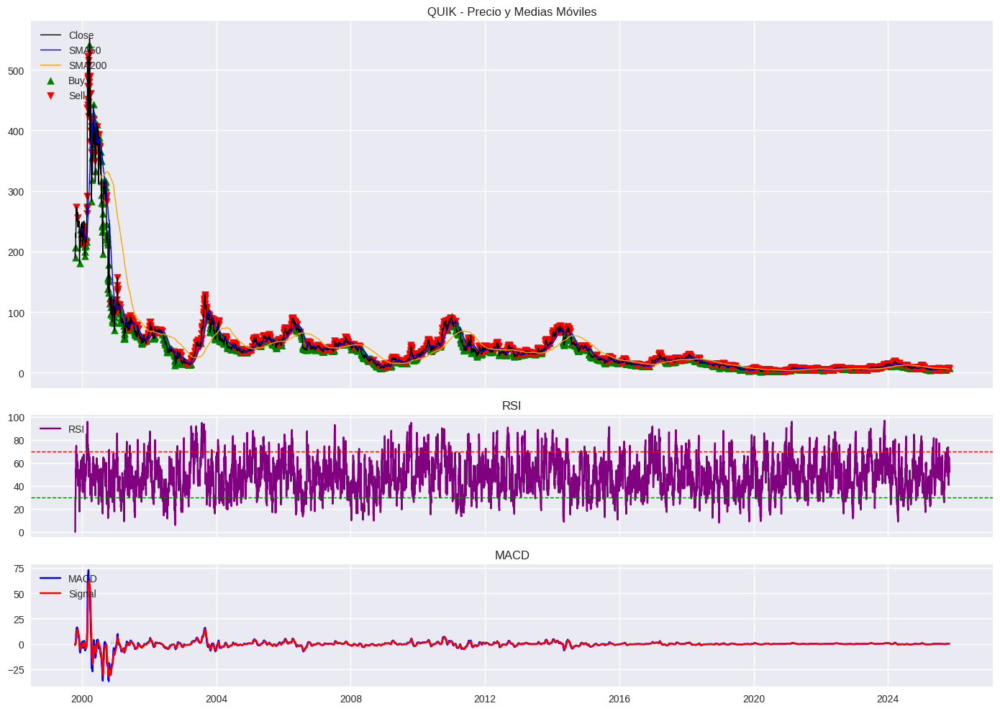

In [ ]:
import yfinance as yf
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

SYMBOL = "QUIK"

# ------------------------- DESCARGA -------------------------
def download_data(symbol):
    print(f"✅ Descargando datos históricos para {symbol} ...")
    df = yf.download(symbol, period="max", interval="1d", auto_adjust=True)
    print(f"📊 Datos descargados: {len(df)} filas. Columnas: {df.columns.tolist()}")

    # 🔧 Aplanar columnas si es MultiIndex
    if isinstance(df.columns, pd.MultiIndex):
        df.columns = [col[0] for col in df.columns]
        print("🧹 Columnas aplanadas:", df.columns.tolist())

    if df.empty or "Close" not in df.columns:
        raise ValueError("❌ No se pudieron descargar datos.")

    df = df.sort_index()
    print(f"✅ Datos listos. Primeras filas:\n{df.head(3)}")
    return df.copy()

# ------------------------- INDICADORES -------------------------
def calculate_indicators(df):
    print("➡️ Calculando indicadores...")
    df = df.copy()
    df["SMA50"] = df["Close"].rolling(50).mean()
    df["SMA200"] = df["Close"].rolling(200).mean()
    delta = df["Close"].diff()
    gain = delta.clip(lower=0)
    loss = -delta.clip(upper=0)
    roll_up = gain.ewm(span=14, adjust=False).mean()
    roll_down = loss.ewm(span=14, adjust=False).mean()
    rs = roll_up / roll_down
    df["RSI"] = 100 - (100 / (1 + rs))
    ema_fast = df["Close"].ewm(span=12, adjust=False).mean()
    ema_slow = df["Close"].ewm(span=26, adjust=False).mean()
    df["MACD"] = ema_fast - ema_slow
    df["MACD_signal"] = df["MACD"].ewm(span=9, adjust=False).mean()
    print("✅ Indicadores calculados.")
    return df

# ------------------------- SEÑALES -------------------------
def safe_scalar(x):
    return float(x) if not pd.isna(x) else np.nan

def detect_signals(df):
    print("➡️ Detectando señales...")
    df = df.copy()
    df["Signal"] = ""
    buys, sells = [], []
    for i in range(1, len(df)):
        try:
            c_now = safe_scalar(df["Close"].iloc[i])
            c_prev = safe_scalar(df["Close"].iloc[i-1])
            sma50_now = safe_scalar(df["SMA50"].iloc[i])
            sma50_prev = safe_scalar(df["SMA50"].iloc[i-1])
            sma200_now = safe_scalar(df["SMA200"].iloc[i])
            sma200_prev = safe_scalar(df["SMA200"].iloc[i-1])
            rsi_now = safe_scalar(df["RSI"].iloc[i])
            macd_now = safe_scalar(df["MACD"].iloc[i])
            macd_prev = safe_scalar(df["MACD"].iloc[i-1])
            macd_signal_now = safe_scalar(df["MACD_signal"].iloc[i])
            macd_signal_prev = safe_scalar(df["MACD_signal"].iloc[i-1])

            reasons_buy, reasons_sell = [], []

            if not np.isnan(sma50_now):
                if c_prev <= sma50_prev and c_now > c_prev:
                    reasons_buy.append("Pullback_SMA50")
                elif c_prev >= sma50_prev and c_now < c_prev:
                    reasons_sell.append("Pullback_SMA50")

            if not np.isnan(rsi_now):
                if rsi_now < 30:
                    reasons_buy.append("RSI_OVERSOLD")
                elif rsi_now > 70:
                    reasons_sell.append("RSI_OVERBOUGHT")

            sma_cross_up = (sma50_prev <= sma200_prev) and (sma50_now > sma200_now)
            sma_cross_down = (sma50_prev >= sma200_prev) and (sma50_now < sma200_now)
            if sma_cross_up:
                reasons_buy.append("GoldenCross")
            elif sma_cross_down:
                reasons_sell.append("DeathCross")

            if all(np.isfinite([macd_now, macd_prev, macd_signal_now, macd_signal_prev])):
                if macd_prev <= macd_signal_prev and macd_now > macd_signal_now:
                    reasons_buy.append("MACD_CrossUp")
                elif macd_prev >= macd_signal_prev and macd_now < macd_signal_now:
                    reasons_sell.append("MACD_CrossDown")

            idx = df.index[i]
            if reasons_buy and not reasons_sell:
                df.at[idx, "Signal"] = "Buy:" + "|".join(reasons_buy)
                buys.append(idx)
            elif reasons_sell and not reasons_buy:
                df.at[idx, "Signal"] = "Sell:" + "|".join(reasons_sell)
                sells.append(idx)

            if i < 5:
                print(f"DEBUG fila {i}: Close={c_now}, RSI={rsi_now}, Señal={df.at[idx,'Signal']}")

        except Exception as e:
            print(f"⚠️ Error en fila {i}: {e}")
            raise

    print(f"✅ Detección completada. Buy={len(buys)}, Sell={len(sells)}")
    return df, buys, sells

# ------------------------- GRÁFICOS -------------------------
def plot_charts(df, buys, sells):
    print("📈 Generando gráficas...")
    plt.style.use("seaborn-v0_8")

    fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(14, 10), sharex=True,
                                        gridspec_kw={'height_ratios': [3, 1, 1]})
    # Precio y medias
    ax1.plot(df.index, df["Close"], label="Close", color="black", linewidth=1)
    ax1.plot(df.index, df["SMA50"], label="SMA50", color="blue", linewidth=1)
    ax1.plot(df.index, df["SMA200"], label="SMA200", color="orange", linewidth=1)
    ax1.scatter(buys, df.loc[buys, "Close"], marker="^", color="green", s=50, label="Buy")
    ax1.scatter(sells, df.loc[sells, "Close"], marker="v", color="red", s=50, label="Sell")
    ax1.legend(loc="upper left")
    ax1.set_title(f"{SYMBOL} - Precio y Medias Móviles")

    # RSI
    ax2.plot(df.index, df["RSI"], color="purple", label="RSI")
    ax2.axhline(70, color="red", linestyle="--", linewidth=1)
    ax2.axhline(30, color="green", linestyle="--", linewidth=1)
    ax2.legend(loc="upper left")
    ax2.set_title("RSI")

    # MACD
    ax3.plot(df.index, df["MACD"], label="MACD", color="blue")
    ax3.plot(df.index, df["MACD_signal"], label="Signal", color="red")
    ax3.bar(df.index, df["MACD"] - df["MACD_signal"], color="gray", alpha=0.3)
    ax3.legend(loc="upper left")
    ax3.set_title("MACD")

    plt.tight_layout()
    plt.show()

# ------------------------- MAIN -------------------------
def main():
    print("🏁 INICIO DEL SCRIPT")
    df = download_data(SYMBOL)
    df = calculate_indicators(df)
    df, buys, sells = detect_signals(df)
    print(f"🎯 RESULTADO FINAL: BUY={len(buys)}, SELL={len(sells)}")
    print("📊 Últimas señales:\n", df[df["Signal"] != ""].tail(5))
    plot_charts(df, buys, sells)
    return df

if __name__ == "__main__":
    df_result = main()


🏁 INICIO DEL SCRIPT
✅ Descargando datos históricos para QUIK ...


[*********************100%***********************]  1 of 1 completed


📊 Datos descargados: 6549 filas. Columnas: ['Close', 'High', 'Low', 'Open', 'Volume']
✅ Detección completada. Buy=2379, Sell=2039
📈 Generando gráficas para últimos 6 meses y último mes...


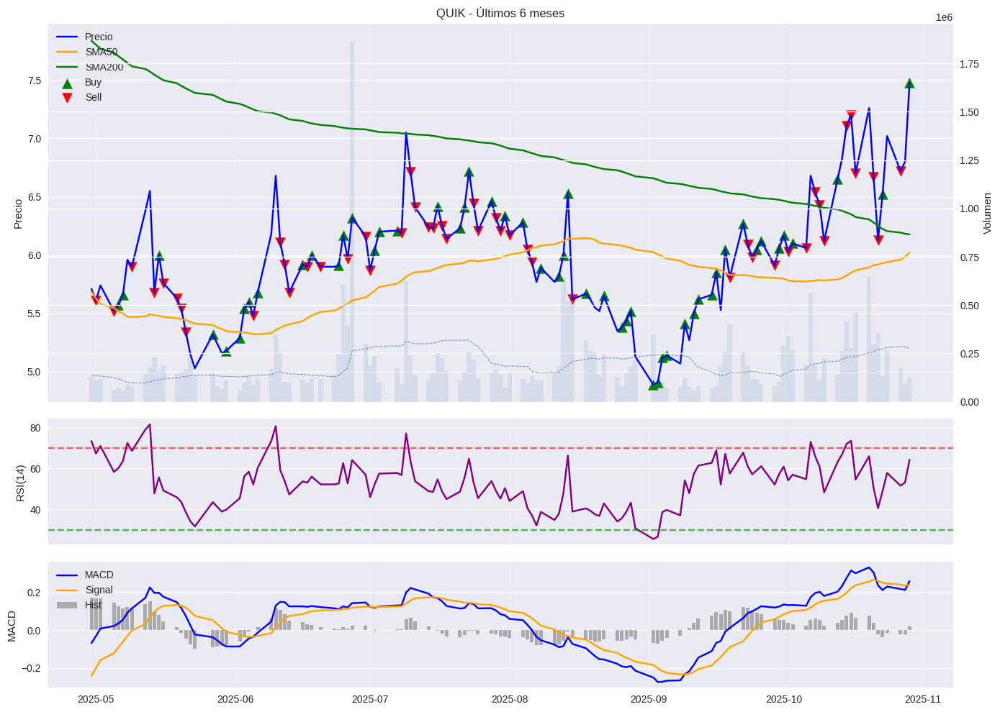

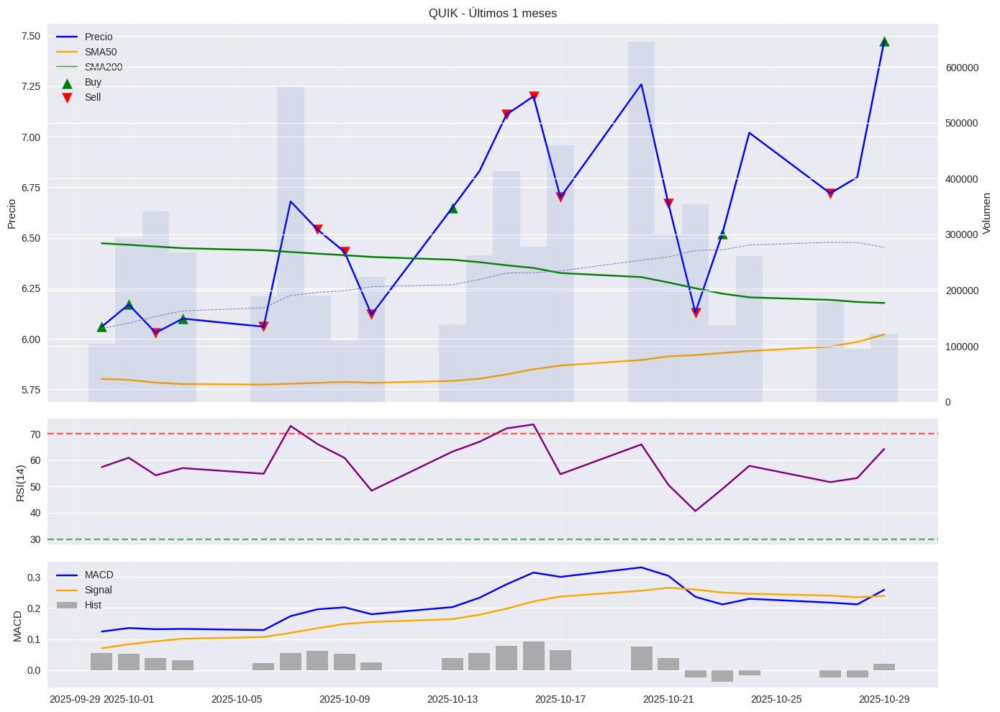

===== Resumen =====
Última Buy: 2025-10-29 a 7.475
 - Stop: 7.251, Take Profit: 8.222
Última Sell: 2025-10-27 a 6.720


In [ ]:
# ================================
# Script completo de trading con señales y gráficos
# ================================
import yfinance as yf
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from pandas.tseries.offsets import MonthEnd

# ================================
# CONFIGURACIÓN
# ================================
SYMBOL = "QUIK"               # Símbolo
STOP_PCT = 0.97                 # Stop = Entrada * STOP_PCT
TP_PCT = 1.10                   # Take Profit = Entrada * TP_PCT
RSI_PERIOD = 14
SMA_SHORT = 50
SMA_LONG = 200
VOL_MA = 20

# ================================
# DESCARGA DE DATOS
# ================================
def download_data(symbol):
    print(f"✅ Descargando datos históricos para {symbol} ...")
    df = yf.download(symbol, period="max", interval="1d", auto_adjust=True)
    if df.empty:
        raise ValueError("No se pudieron descargar datos.")
    # Aplanar MultiIndex si lo hubiera
    df.columns = [c if isinstance(c, str) else c[0] for c in df.columns]
    print(f"📊 Datos descargados: {len(df)} filas. Columnas: {list(df.columns)}")
    return df

# ================================
# CÁLCULO DE INDICADORES
# ================================
def calculate_indicators(df):
    df = df.copy()
    # SMAs
    df['SMA50'] = df['Close'].rolling(SMA_SHORT).mean()
    df['SMA200'] = df['Close'].rolling(SMA_LONG).mean()
    # Volumen MA
    df['VolMA'] = df['Volume'].rolling(VOL_MA).mean()
    # RSI
    delta = df['Close'].diff()
    up = delta.clip(lower=0)
    down = -1*delta.clip(upper=0)
    roll_up = up.ewm(span=RSI_PERIOD, adjust=False).mean()
    roll_down = down.ewm(span=RSI_PERIOD, adjust=False).mean()
    rs = roll_up / roll_down
    df['RSI'] = 100 - (100 / (1 + rs))
    # MACD
    ema_fast = df['Close'].ewm(span=12, adjust=False).mean()
    ema_slow = df['Close'].ewm(span=26, adjust=False).mean()
    df['MACD'] = ema_fast - ema_slow
    df['MACD_signal'] = df['MACD'].ewm(span=9, adjust=False).mean()
    df['MACD_hist'] = df['MACD'] - df['MACD_signal']
    return df

# ================================
# DETECCIÓN DE SEÑALES
# ================================
def detect_signals(df):
    df = df.copy()
    df['Signal'] = ''
    buys, sells = [], []

    for i in range(1, len(df)):
        row = df.iloc[i]
        prev = df.iloc[i-1]
        reasons_buy, reasons_sell = [], []

        # Pullback SMA50 y SMA200
        try:
            if prev['Close'] <= prev['SMA50'] and row['Close'] > prev['Close']:
                reasons_buy.append('Pullback_SMA50')
            if prev['Close'] <= prev['SMA200'] and row['Close'] > prev['Close']:
                reasons_buy.append('Pullback_SMA200')
            if prev['Close'] >= prev['SMA50'] and row['Close'] < prev['Close']:
                reasons_sell.append('Pullback_SMA50')
            if prev['Close'] >= prev['SMA200'] and row['Close'] < prev['Close']:
                reasons_sell.append('Pullback_SMA200')
        except:
            pass

        # RSI
        if row['RSI'] < 30:
            reasons_buy.append('RSI_OVERSOLD')
        elif row['RSI'] > 70:
            reasons_sell.append('RSI_OVERBOUGHT')

        # MACD
        if prev['MACD'] <= prev['MACD_signal'] and row['MACD'] > row['MACD_signal']:
            reasons_buy.append('MACD_CrossUp')
        elif prev['MACD'] >= prev['MACD_signal'] and row['MACD'] < row['MACD_signal']:
            reasons_sell.append('MACD_CrossDown')

        # Señal final
        if reasons_buy and not reasons_sell:
            df.at[df.index[i], 'Signal'] = 'Buy:' + '|'.join(reasons_buy)
            buys.append(df.index[i])
        elif reasons_sell and not reasons_buy:
            df.at[df.index[i], 'Signal'] = 'Sell:' + '|'.join(reasons_sell)
            sells.append(df.index[i])
        elif reasons_buy and reasons_sell:
            df.at[df.index[i], 'Signal'] = 'Mix:' + '|'.join(reasons_buy + reasons_sell)

    print(f"✅ Detección completada. Buy={len(buys)}, Sell={len(sells)}")
    return df, buys, sells

# ================================
# PLOT DE GRÁFICOS
# ================================
def plot_graphs(df, buys, sells, months, symbol):
    from matplotlib.dates import DateFormatter
    ultimo_dato = df.index.max()
    inicio = ultimo_dato - MonthEnd(months)
    df_plot = df[df.index >= inicio]
    buys_plot = [b for b in buys if b >= inicio]
    sells_plot = [s for s in sells if s >= inicio]

    fig, axs = plt.subplots(3,1, figsize=(14,10), sharex=True, gridspec_kw={'height_ratios':[3,1,1]})
    ax_price, ax_rsi, ax_macd = axs

    # Precio + SMAs
    ax_price.plot(df_plot.index, df_plot['Close'], label='Precio', color='blue')
    ax_price.plot(df_plot.index, df_plot['SMA50'], label='SMA50', color='orange')
    ax_price.plot(df_plot.index, df_plot['SMA200'], label='SMA200', color='green')

    # Señales
    if buys_plot:
        ax_price.scatter(buys_plot, df_plot.loc[buys_plot,'Close'], marker='^', s=100, color='green', label='Buy')
    if sells_plot:
        ax_price.scatter(sells_plot, df_plot.loc[sells_plot,'Close'], marker='v', s=100, color='red', label='Sell')

    # Volumen en eje secundario
    ax2 = ax_price.twinx()
    ax2.bar(df_plot.index, df_plot['Volume'], alpha=0.12, width=1)
    if df_plot['VolMA'].notna().any():
        ax2.plot(df_plot.index, df_plot['VolMA'], linestyle='--', linewidth=0.7, alpha=0.8)
    ax2.set_ylabel('Volumen')

    ax_price.set_title(f"{symbol} - Últimos {months} meses")
    ax_price.set_ylabel("Precio")
    ax_price.legend(loc='upper left')
    ax_price.grid(True, axis='x', alpha=0.2)

    # RSI subplot
    ax_rsi.plot(df_plot.index, df_plot['RSI'], color='purple')
    ax_rsi.axhline(70, linestyle='--', color='red', alpha=0.6)
    ax_rsi.axhline(30, linestyle='--', color='green', alpha=0.6)
    ax_rsi.set_ylabel('RSI(14)')
    ax_rsi.grid(True, axis='x', alpha=0.2)

    # MACD subplot
    ax_macd.plot(df_plot.index, df_plot['MACD'], label='MACD', color='blue')
    ax_macd.plot(df_plot.index, df_plot['MACD_signal'], label='Signal', color='orange')
    ax_macd.bar(df_plot.index, df_plot['MACD_hist'], alpha=0.6, label='Hist', color='gray')
    ax_macd.set_ylabel('MACD')
    ax_macd.legend(loc='upper left')
    ax_macd.grid(True, axis='x', alpha=0.2)

    plt.xlabel('Fecha')
    plt.tight_layout()
    plt.show()

# ================================
# RESUMEN TEXTO + NIVELES TRADING
# ================================
def textual_summary(df, buys, sells):
    summary = []
    summary.append("===== Resumen =====")
    if buys:
        last_buy = max(buys)
        price = df.loc[last_buy, 'Close']
        stop = price * STOP_PCT
        tp = price * TP_PCT
        summary.append(f"Última Buy: {last_buy.date()} a {price:.3f}")
        summary.append(f" - Stop: {stop:.3f}, Take Profit: {tp:.3f}")
    else:
        summary.append("No hay Buy detectada.")
    if sells:
        last_sell = max(sells)
        price = df.loc[last_sell, 'Close']
        summary.append(f"Última Sell: {last_sell.date()} a {price:.3f}")
    return "\n".join(summary)

# ================================
# FUNCIÓN PRINCIPAL
# ================================
def main():
    print("🏁 INICIO DEL SCRIPT")
    df = download_data(SYMBOL)
    df = calculate_indicators(df)
    df, buys, sells = detect_signals(df)
    print("📈 Generando gráficas para últimos 6 meses y último mes...")
    plot_graphs(df, buys, sells, months=6, symbol=SYMBOL)
    plot_graphs(df, buys, sells, months=1, symbol=SYMBOL)
    print(textual_summary(df, buys, sells))

if __name__ == "__main__":
    main()


🏁 INICIO DEL SCRIPT
✅ Descargando datos históricos para ORY.MC ...


[*********************100%***********************]  1 of 1 completed


📊 Datos descargados: 2528 filas. Columnas: ['Close', 'High', 'Low', 'Open', 'Volume']
✅ Primeras filas:
            Close   High    Low  Open  Volume
Date                                         
2015-12-14  4.600  5.250  4.490  4.49  532562
2015-12-15  4.013  5.190  4.013  4.90  340731
2015-12-16  3.900  4.111  3.665  4.10  242740
✅ Indicadores calculados.
✅ Detección completada. Buy=913, Sell=674

===== Resumen =====
Última Buy: 2025-10-03 a 3.245
 - Stop: 3.148, Take Profit: 3.569
Última Sell: 2025-10-24 a 3.205

📊 Últimas 10 señales detectadas:
            Close   SMA50    SMA200                              Signal
Date                                                                   
2025-10-09  3.820  2.8673  2.586515                 Sell:RSI_OVERBOUGHT
2025-10-10  3.815  2.8914  2.598420  Sell:Pullback_SMA50|RSI_OVERBOUGHT
2025-10-13  3.780  2.9148  2.610320  Sell:Pullback_SMA50|RSI_OVERBOUGHT
2025-10-14  3.670  2.9355  2.621160                 Sell:Pullback_SMA50
2025-10-15  3

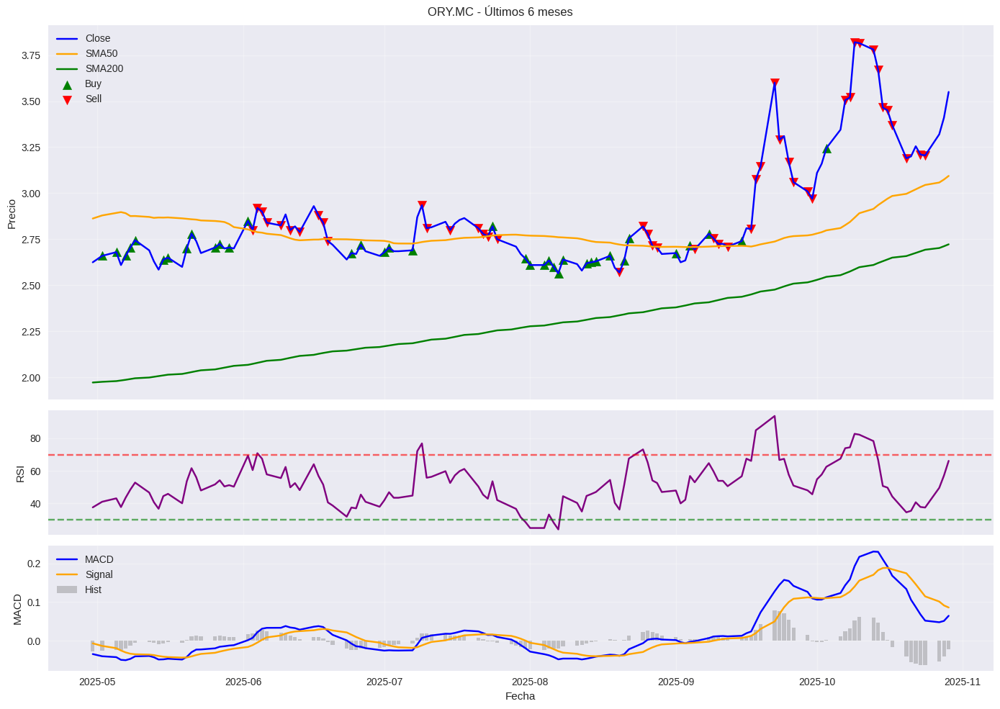

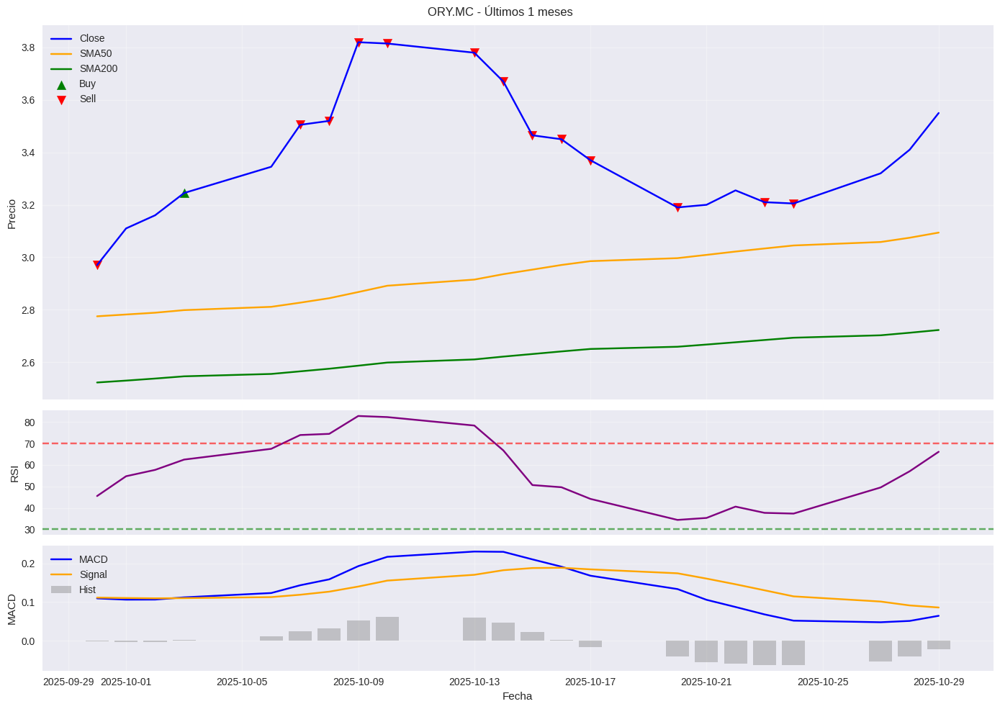

In [ ]:
# -------------------------------
# Script completo de trading técnico
# -------------------------------

import yfinance as yf
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from pandas.tseries.offsets import MonthEnd
from datetime import datetime

plt.ion()  # Modo interactivo para mostrar gráficos

# =========================
# CONFIGURACIÓN
# =========================
SYMBOL = "ORY.MC"
STOP_PCT = 0.97   # Stop -3%
TP_PCT = 1.10     # Take Profit +10%
RSI_PERIOD = 14
SMA_SHORT = 50
SMA_LONG = 200
VOL_MA = 20

# =========================
# DESCARGA Y PREPARACIÓN DE DATOS
# =========================
def download_data(symbol):
    print(f"✅ Descargando datos históricos para {symbol} ...")
    df = yf.download(symbol, period="max", interval="1d", auto_adjust=True)
    if df.empty:
        raise ValueError("No se descargaron datos.")
    # Aplanar columnas si vienen MultiIndex
    if isinstance(df.columns, pd.MultiIndex):
        df.columns = [col[0] for col in df.columns]
    print(f"📊 Datos descargados: {len(df)} filas. Columnas: {list(df.columns)}")
    print(f"✅ Primeras filas:\n{df.head(3)}")
    return df

# =========================
# CÁLCULO DE INDICADORES
# =========================
def calculate_indicators(df):
    df = df.copy()
    df['SMA50'] = df['Close'].rolling(SMA_SHORT).mean()
    df['SMA200'] = df['Close'].rolling(SMA_LONG).mean()
    df['VolMA'] = df['Volume'].rolling(VOL_MA).mean()
    # RSI
    delta = df['Close'].diff()
    up = delta.clip(lower=0)
    down = -1 * delta.clip(upper=0)
    roll_up = up.ewm(span=RSI_PERIOD, adjust=False).mean()
    roll_down = down.ewm(span=RSI_PERIOD, adjust=False).mean()
    rs = roll_up / roll_down
    df['RSI'] = 100 - (100 / (1 + rs))
    # MACD
    ema_fast = df['Close'].ewm(span=12, adjust=False).mean()
    ema_slow = df['Close'].ewm(span=26, adjust=False).mean()
    df['MACD'] = ema_fast - ema_slow
    df['MACD_signal'] = df['MACD'].ewm(span=9, adjust=False).mean()
    df['MACD_hist'] = df['MACD'] - df['MACD_signal']
    print("✅ Indicadores calculados.")
    return df

# =========================
# DETECCIÓN DE SEÑALES
# =========================
def detect_signals(df):
    df = df.copy()
    df['Signal'] = ''
    buys = []
    sells = []

    for i in range(1, len(df)):
        row = df.iloc[i]
        prev = df.iloc[i-1]
        reasons_buy = []
        reasons_sell = []

        # Pullback SMA50
        if pd.notna(prev['SMA50']):
            if prev['Close'] <= prev['SMA50'] and row['Close'] > prev['Close']:
                reasons_buy.append('Pullback_SMA50')
            if prev['Close'] >= prev['SMA50'] and row['Close'] < prev['Close']:
                reasons_sell.append('Pullback_SMA50')
        # RSI
        if pd.notna(row['RSI']):
            if row['RSI'] < 30:
                reasons_buy.append('RSI_OVERSOLD')
            elif row['RSI'] > 70:
                reasons_sell.append('RSI_OVERBOUGHT')
        # MACD Cross
        if pd.notna(prev['MACD']) and pd.notna(prev['MACD_signal']):
            if prev['MACD'] <= prev['MACD_signal'] and row['MACD'] > row['MACD_signal']:
                reasons_buy.append('MACD_CrossUp')
            elif prev['MACD'] >= prev['MACD_signal'] and row['MACD'] < row['MACD_signal']:
                reasons_sell.append('MACD_CrossDown')
        # Asignar señales
        if reasons_buy and not reasons_sell:
            df.at[df.index[i], 'Signal'] = 'Buy:' + '|'.join(reasons_buy)
            buys.append(df.index[i])
        elif reasons_sell and not reasons_buy:
            df.at[df.index[i], 'Signal'] = 'Sell:' + '|'.join(reasons_sell)
            sells.append(df.index[i])
        elif reasons_buy and reasons_sell:
            df.at[df.index[i], 'Signal'] = 'Mix:' + '|'.join(reasons_buy + reasons_sell)
    print(f"✅ Detección completada. Buy={len(buys)}, Sell={len(sells)}")
    return df, buys, sells

# =========================
# FUNCIÓN DE GRAFICADO
# =========================
def plot_graphs(df, buys, sells, months, symbol):
    ultimo = df.index.max()
    inicio = ultimo - MonthEnd(months)
    df_plot = df[df.index >= inicio]
    buys_plot = [b for b in buys if b >= inicio]
    sells_plot = [s for s in sells if s >= inicio]

    fig, axs = plt.subplots(3,1, figsize=(14,10), sharex=True, gridspec_kw={'height_ratios':[3,1,1]})
    ax_price, ax_rsi, ax_macd = axs

    # Precio y SMAs
    ax_price.plot(df_plot.index, df_plot['Close'], label='Close', color='blue')
    ax_price.plot(df_plot.index, df_plot['SMA50'], label='SMA50', color='orange')
    ax_price.plot(df_plot.index, df_plot['SMA200'], label='SMA200', color='green')
    # Señales
    if buys_plot:
        ax_price.scatter(buys_plot, df_plot.loc[buys_plot, 'Close'], marker='^', color='green', s=80, label='Buy')
    if sells_plot:
        ax_price.scatter(sells_plot, df_plot.loc[sells_plot, 'Close'], marker='v', color='red', s=80, label='Sell')
    ax_price.set_ylabel("Precio")
    ax_price.legend(loc='upper left')
    ax_price.grid(True, alpha=0.3)

    # RSI
    ax_rsi.plot(df_plot.index, df_plot['RSI'], color='purple')
    ax_rsi.axhline(70, linestyle='--', alpha=0.6, color='red')
    ax_rsi.axhline(30, linestyle='--', alpha=0.6, color='green')
    ax_rsi.set_ylabel("RSI")
    ax_rsi.grid(True, alpha=0.3)

    # MACD
    ax_macd.plot(df_plot.index, df_plot['MACD'], label='MACD', color='blue')
    ax_macd.plot(df_plot.index, df_plot['MACD_signal'], label='Signal', color='orange')
    ax_macd.bar(df_plot.index, df_plot['MACD_hist'], alpha=0.4, label='Hist', color='gray')
    ax_macd.set_ylabel("MACD")
    ax_macd.legend(loc='upper left')
    ax_macd.grid(True, alpha=0.3)

    plt.xlabel("Fecha")
    plt.suptitle(f"{symbol} - Últimos {months} meses")
    plt.tight_layout()
    plt.show()

# =========================
# RESUMEN
# =========================
def summary_report(df, buys, sells):
    print("\n===== Resumen =====")
    if buys:
        last_buy = df.loc[buys[-1]]
        date_buy = buys[-1].date()
        entry = last_buy['Close']
        stop = entry * STOP_PCT
        target = entry * TP_PCT
        print(f"Última Buy: {date_buy} a {entry:.3f}")
        print(f" - Stop: {stop:.3f}, Take Profit: {target:.3f}")
    if sells:
        last_sell = df.loc[sells[-1]]
        date_sell = sells[-1].date()
        price_sell = last_sell['Close']
        print(f"Última Sell: {date_sell} a {price_sell:.3f}")
    # Últimas 10 señales
    recent = df[df['Signal'] != ''].tail(10)
    if not recent.empty:
        print("\n📊 Últimas 10 señales detectadas:")
        print(recent[['Close','SMA50','SMA200','Signal']])

# =========================
# EJECUCIÓN PRINCIPAL
# =========================
def main(symbol=SYMBOL):
    print("🏁 INICIO DEL SCRIPT")
    df = download_data(symbol)
    df = calculate_indicators(df)
    df, buys, sells = detect_signals(df)
    summary_report(df, buys, sells)
    # Graficar últimos 6 meses y último mes
    print("\n📈 Generando gráficas para últimos 6 meses y último mes...")
    plot_graphs(df, buys, sells, 6, symbol)
    plot_graphs(df, buys, sells, 1, symbol)
    return df

if __name__ == "__main__":
    df_result = main()


[*********************100%***********************]  1 of 1 completed

🏁 INICIO DEL SCRIPT
✅ Descargando datos históricos para ORY.MC ...
📊 Datos descargados: 2528 filas. Columnas: [('Close', 'ORY.MC'), ('High', 'ORY.MC'), ('Low', 'ORY.MC'), ('Open', 'ORY.MC'), ('Volume', 'ORY.MC')]
✅ Datos listos. Primeras filas:
Price       Close   High    Low  Open  Volume
Date                                         
2015-12-14  4.600  5.250  4.490  4.49  532562
2015-12-15  4.013  5.190  4.013  4.90  340731
2015-12-16  3.900  4.111  3.665  4.10  242740
➡️ Calculando indicadores...
✅ Indicadores calculados.
➡️ Detectando señales...


✅ Detección completada. Buy=939, Sell=767

📊 Últimas 10 señales detectadas:
Price       Close   SMA50    SMA200  \
Date                                  
2025-10-16  3.450  2.9705  2.640845   
2025-10-17  3.370  2.9851  2.650235   
2025-10-20  3.190  2.9966  2.658725   
2025-10-21  3.200  3.0090  2.667105   
2025-10-22  3.255  3.0217  2.675780   
2025-10-23  3.210  3.0334  2.684450   
2025-10-24  3.205  3.0449  2.693135   
2025-10-27  3.320  3.0581  2.702395   
2025-10-28  3.410  3.0744  2.712095   
2025-10-29  3.545  3.0939  2.722500   

Price                                                  Signal  
Date                                                           
2025-10-16                Sell:Pullback_SMA50|Pullback_SMA200  
2025-10-17  Sell:Pullback_SMA50|Pullback_SMA200|MACD_Cross...  
2025-10-20                Sell:Pullback_SMA50|Pullback_SMA200  
2025-10-21                                                     
2025-10-22                                                     
2025-10

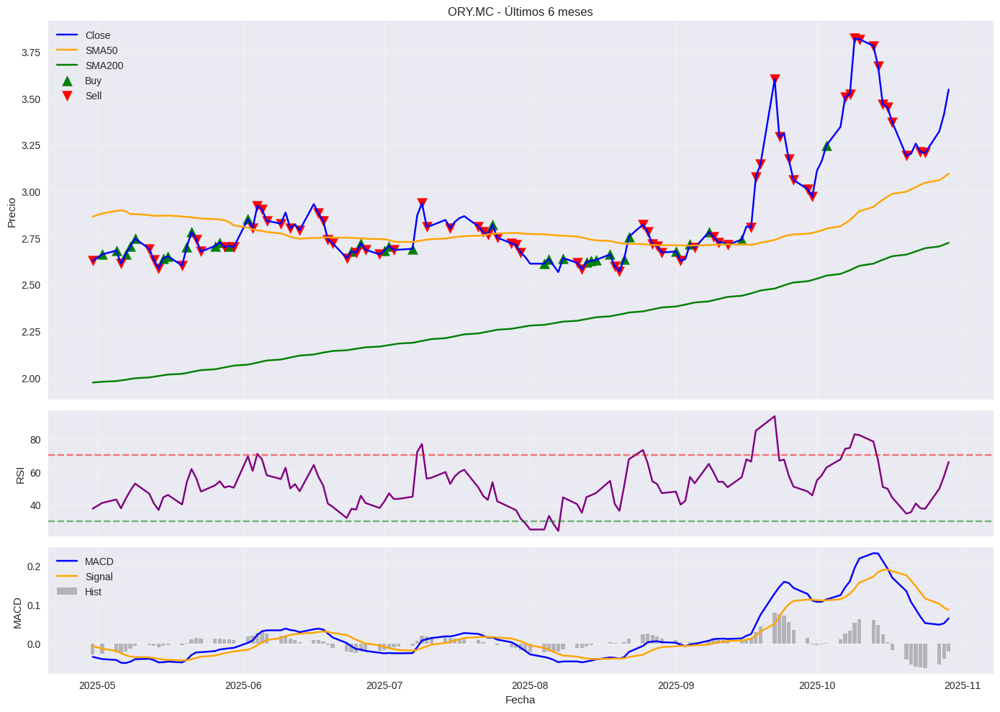

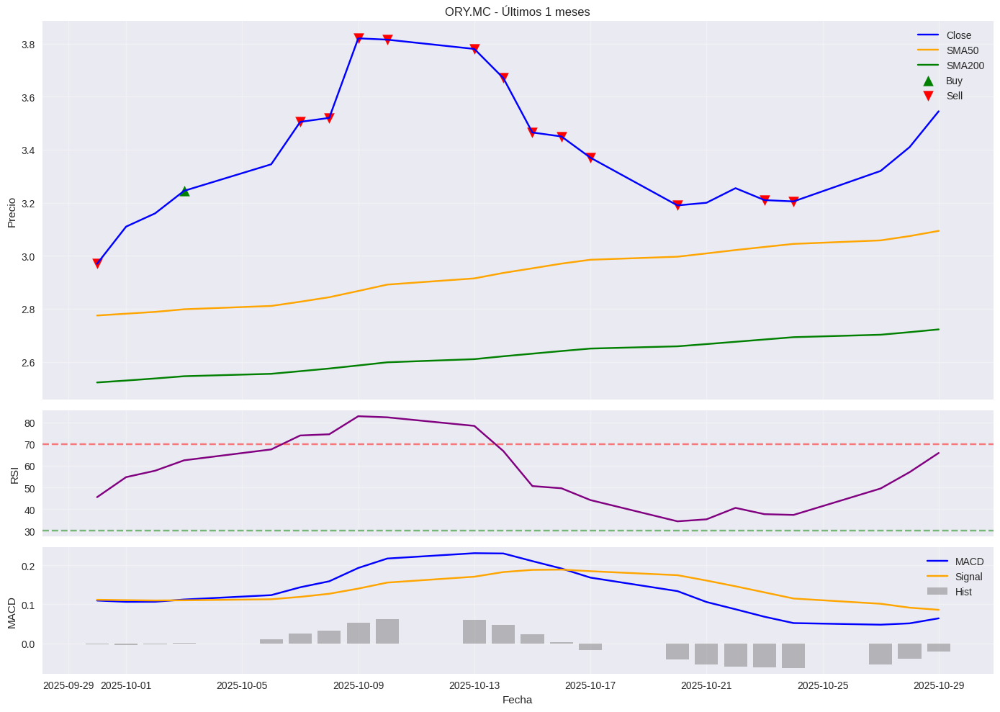


===== Resumen =====
Última Buy: 2025-10-03 a 3.245
 - Stop: 3.148, Take Profit: 3.569
Última Sell: 2025-10-24 a 3.205



In [ ]:
# -------------------------------
# Script completo de trading con indicadores y señales
# -------------------------------

import yfinance as yf
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from pandas.tseries.offsets import MonthEnd
from datetime import datetime

# -------------------------------
# Configuración
# -------------------------------
SYMBOL = "ORY.MC"
PERIOD = "10y"
STOP_PCT = 0.97
TP_PCT = 1.10
SMA_SHORT = 50
SMA_LONG = 200
VOL_MA = 20
RSI_PERIOD = 14
MACD_FAST = 12
MACD_SLOW = 26
MACD_SIGNAL = 9

# -------------------------------
# Descarga y limpieza de datos
# -------------------------------
def download_data(symbol, period="10y"):
    print(f"✅ Descargando datos históricos para {symbol} ...")
    df = yf.download(symbol, period=period, auto_adjust=True)
    print(f"📊 Datos descargados: {len(df)} filas. Columnas: {list(df.columns)}")
    df = df.copy()
    df.columns = df.columns.get_level_values(0) if isinstance(df.columns, pd.MultiIndex) else df.columns
    print(f"✅ Datos listos. Primeras filas:\n{df.head(3)}")
    return df

# -------------------------------
# Cálculo de indicadores
# -------------------------------
def calculate_indicators(df):
    print("➡️ Calculando indicadores...")
    df['SMA50'] = df['Close'].rolling(SMA_SHORT).mean()
    df['SMA200'] = df['Close'].rolling(SMA_LONG).mean()
    df['VolMA'] = df['Volume'].rolling(VOL_MA).mean()

    # RSI
    delta = df['Close'].diff()
    up = delta.clip(lower=0)
    down = -1*delta.clip(upper=0)
    roll_up = up.ewm(span=RSI_PERIOD, adjust=False).mean()
    roll_down = down.ewm(span=RSI_PERIOD, adjust=False).mean()
    rs = roll_up / roll_down
    df['RSI'] = 100 - (100 / (1 + rs))

    # MACD
    ema_fast = df['Close'].ewm(span=MACD_FAST, adjust=False).mean()
    ema_slow = df['Close'].ewm(span=MACD_SLOW, adjust=False).mean()
    df['MACD'] = ema_fast - ema_slow
    df['MACD_signal'] = df['MACD'].ewm(span=MACD_SIGNAL, adjust=False).mean()
    df['MACD_hist'] = df['MACD'] - df['MACD_signal']

    print("✅ Indicadores calculados.")
    return df

# -------------------------------
# Detección de señales
# -------------------------------
def detect_signals(df):
    print("➡️ Detectando señales...")
    df = df.copy()
    df['Signal'] = ''
    buys = []
    sells = []

    for i in range(1, len(df)):
        row = df.iloc[i]
        prev = df.iloc[i-1]
        reasons_buy = []
        reasons_sell = []

        # Pullback SMA50/SMA200
        if pd.notna(prev['SMA50']) and pd.notna(row['SMA50']):
            if prev['Close'] <= prev['SMA50'] and row['Close'] > prev['Close']:
                reasons_buy.append('Pullback_SMA50')
            if prev['Close'] >= prev['SMA50'] and row['Close'] < prev['Close']:
                reasons_sell.append('Pullback_SMA50')
        if pd.notna(prev['SMA200']) and pd.notna(row['SMA200']):
            if prev['Close'] <= prev['SMA200'] and row['Close'] > prev['Close']:
                reasons_buy.append('Pullback_SMA200')
            if prev['Close'] >= prev['SMA200'] and row['Close'] < prev['Close']:
                reasons_sell.append('Pullback_SMA200')

        # RSI
        if pd.notna(row['RSI']):
            if row['RSI'] < 30:
                reasons_buy.append('RSI_OVERSOLD')
            elif row['RSI'] > 70:
                reasons_sell.append('RSI_OVERBOUGHT')

        # MACD cross
        if pd.notna(prev['MACD']) and pd.notna(prev['MACD_signal']):
            if prev['MACD'] <= prev['MACD_signal'] and row['MACD'] > row['MACD_signal']:
                reasons_buy.append('MACD_CrossUp')
            elif prev['MACD'] >= prev['MACD_signal'] and row['MACD'] < row['MACD_signal']:
                reasons_sell.append('MACD_CrossDown')

        # Definir señal final
        if reasons_buy and not reasons_sell:
            df.at[df.index[i], 'Signal'] = 'Buy:' + '|'.join(reasons_buy)
            buys.append(df.index[i])
        elif reasons_sell and not reasons_buy:
            df.at[df.index[i], 'Signal'] = 'Sell:' + '|'.join(reasons_sell)
            sells.append(df.index[i])
        elif reasons_buy and reasons_sell:
            df.at[df.index[i], 'Signal'] = 'Mix:' + '|'.join(reasons_buy + reasons_sell)

    print(f"✅ Detección completada. Buy={len(buys)}, Sell={len(sells)}")
    return df, buys, sells

# -------------------------------
# Graficar indicadores y señales
# -------------------------------
def plot_graphs(df, buys, sells, months, symbol):
    inicio = df.index.max() - MonthEnd(months)
    df_plot = df[df.index >= inicio]
    buys_plot = [b for b in buys if b >= inicio]
    sells_plot = [s for s in sells if s >= inicio]

    fig, axs = plt.subplots(3,1, figsize=(14,10), sharex=True, gridspec_kw={'height_ratios':[3,1,1]})
    ax_price, ax_rsi, ax_macd = axs

    # Precio + SMAs
    ax_price.plot(df_plot.index, df_plot['Close'], label='Close', color='blue')
    ax_price.plot(df_plot.index, df_plot['SMA50'], label='SMA50', color='orange')
    ax_price.plot(df_plot.index, df_plot['SMA200'], label='SMA200', color='green')

    # Señales
    if buys_plot:
        ax_price.scatter(buys_plot, df_plot.loc[buys_plot, 'Close'], marker='^', color='green', s=100, label='Buy')
    if sells_plot:
        ax_price.scatter(sells_plot, df_plot.loc[sells_plot, 'Close'], marker='v', color='red', s=100, label='Sell')

    ax_price.set_title(f"{symbol} - Últimos {months} meses")
    ax_price.set_ylabel('Precio')
    ax_price.legend()
    ax_price.grid(True, alpha=0.3)

    # RSI
    ax_rsi.plot(df_plot.index, df_plot['RSI'], color='purple')
    ax_rsi.axhline(70, linestyle='--', color='red', alpha=0.5)
    ax_rsi.axhline(30, linestyle='--', color='green', alpha=0.5)
    ax_rsi.set_ylabel('RSI')
    ax_rsi.grid(True, alpha=0.3)

    # MACD
    ax_macd.plot(df_plot.index, df_plot['MACD'], label='MACD', color='blue')
    ax_macd.plot(df_plot.index, df_plot['MACD_signal'], label='Signal', color='orange')
    ax_macd.bar(df_plot.index, df_plot['MACD_hist'], label='Hist', color='grey', alpha=0.5)
    ax_macd.set_ylabel('MACD')
    ax_macd.legend()
    ax_macd.grid(True, alpha=0.3)

    plt.xlabel('Fecha')
    plt.tight_layout()
    plt.show()

# -------------------------------
# Resumen textual
# -------------------------------
def textual_summary(df, buys, sells):
    report = "===== Resumen =====\n"
    if buys:
        last_buy_idx = buys[-1]
        last_buy = float(df.loc[last_buy_idx, 'Close'])
        stop = last_buy * STOP_PCT
        tp = last_buy * TP_PCT
        report += f"Última Buy: {last_buy_idx.date()} a {last_buy:.3f}\n"
        report += f" - Stop: {stop:.3f}, Take Profit: {tp:.3f}\n"
    if sells:
        last_sell_idx = sells[-1]
        last_sell = float(df.loc[last_sell_idx, 'Close'])
        report += f"Última Sell: {last_sell_idx.date()} a {last_sell:.3f}\n"
    return report

# -------------------------------
# Función principal
# -------------------------------
def main():
    print("🏁 INICIO DEL SCRIPT")
    df = download_data(SYMBOL, PERIOD)
    df = calculate_indicators(df)
    df, buys, sells = detect_signals(df)

    print("\n📊 Últimas 10 señales detectadas:")
    print(df[['Close','SMA50','SMA200','Signal']].tail(10))

    # Graficar últimos 6 meses y último mes
    print("\n📈 Generando gráficas para últimos 6 meses y último mes...")
    plot_graphs(df, buys, sells, months=6, symbol=SYMBOL)
    plot_graphs(df, buys, sells, months=1, symbol=SYMBOL)

    # Resumen
    report = textual_summary(df, buys, sells)
    print("\n" + report)

# -------------------------------
# Ejecutar
# -------------------------------
if __name__ == "__main__":
    main()


[*********************100%***********************]  1 of 1 completed

🏁 INICIO DEL SCRIPT
✅ Descargando datos históricos para ORY.MC ...
📊 Datos descargados: 2528 filas. Columnas: ['Open', 'High', 'Low', 'Close', 'Volume']
✅ Datos listos. Primeras filas:
             Open   High    Low  Close  Volume
Date                                          
2015-12-14  4.600  5.250  4.490   4.49  532562
2015-12-15  4.013  5.190  4.013   4.90  340731
2015-12-16  3.900  4.111  3.665   4.10  242740


✅ Detección completada. Buy=906, Sell=807

📊 Últimas 10 señales detectadas:
            Close   SMA50    SMA200  \
Date                                  
2025-10-16  3.490  2.9764  2.649665   
2025-10-17  3.410  2.9932  2.659325   
2025-10-20  3.120  3.0025  2.667365   
2025-10-21  3.230  3.0150  2.676005   
2025-10-22  3.220  3.0274  2.684475   
2025-10-23  3.325  3.0414  2.693500   
2025-10-24  3.225  3.0528  2.702225   
2025-10-27  3.280  3.0658  2.711225   
2025-10-28  3.355  3.0795  2.720690   
2025-10-29  3.430  3.0959  2.730530   

                                                       Signal  
Date                                                           
2025-10-16                Sell:Pullback_SMA50|Pullback_SMA200  
2025-10-17  Sell:Pullback_SMA50|Pullback_SMA200|MACD_Cross...  
2025-10-20                Sell:Pullback_SMA50|Pullback_SMA200  
2025-10-21                                                     
2025-10-22                Sell:Pullback_SMA50|Pullback_SMA200  
2025-10

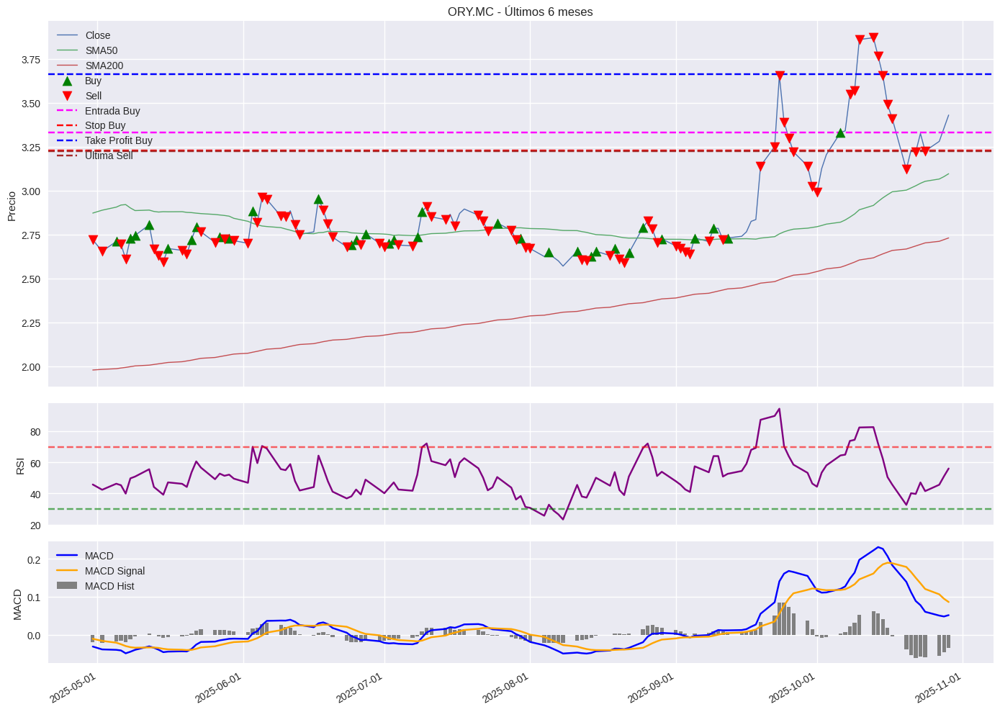

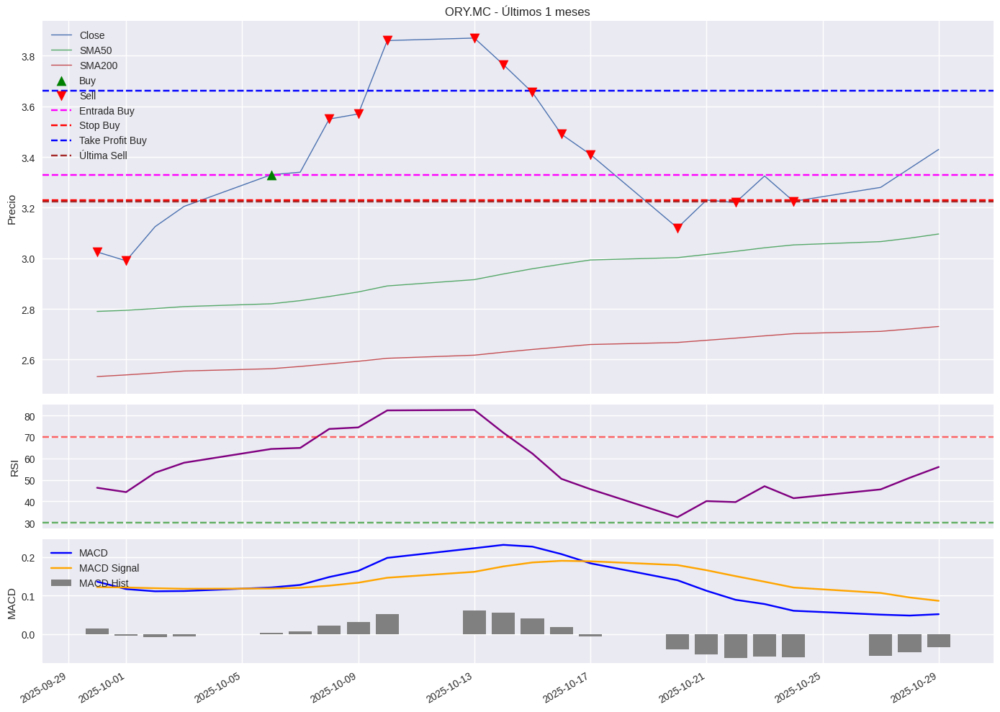


===== Resumen =====
Última Buy: 2025-10-06 a 3.330
 - Stop: 3.230, Take Profit: 3.663
Última Sell: 2025-10-24 a 3.225


In [ ]:
# =========================
# Script completo de trading con indicadores, señales y gráficas
# =========================

import yfinance as yf
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from pandas.tseries.offsets import MonthEnd
from datetime import timedelta
import matplotlib.dates as mdates

# =========================
# Configuración
# =========================
SYMBOL = "ORY.MC"
STOP_PCT = 0.97
TP_PCT = 1.10
RSI_PERIOD = 14
MACD_FAST = 12
MACD_SLOW = 26
MACD_SIGNAL = 9
SMA_SHORT = 50
SMA_LONG = 200
VOL_MA = 20
PERIODS_MONTHS = [6, 1]  # para las gráficas

# =========================
# Descargar y limpiar datos
# =========================
def download_data(symbol):
    print(f"✅ Descargando datos históricos para {symbol} ...")
    df = yf.download(symbol, period="max", interval="1d", auto_adjust=True)

    # Aplanar MultiIndex si existe
    if isinstance(df.columns, pd.MultiIndex):
        df.columns = [col[0] if col[1]==symbol else col[1] for col in df.columns]
        rename_map = {col: c for col, c in zip(df.columns, ['Open','High','Low','Close','Volume'])}
        df.rename(columns=rename_map, inplace=True)

    df.dropna(inplace=True)
    print(f"📊 Datos descargados: {len(df)} filas. Columnas: {list(df.columns)}")
    print(f"✅ Datos listos. Primeras filas:\n{df.head(3)}")
    return df

# =========================
# Calcular indicadores
# =========================
def calculate_indicators(df):
    df = df.copy()
    df['SMA50'] = df['Close'].rolling(SMA_SHORT).mean()
    df['SMA200'] = df['Close'].rolling(SMA_LONG).mean()
    df['VolMA'] = df['Volume'].rolling(VOL_MA).mean()

    # RSI
    delta = df['Close'].diff()
    up = delta.clip(lower=0)
    down = -1*delta.clip(upper=0)
    roll_up = up.ewm(span=RSI_PERIOD, adjust=False).mean()
    roll_down = down.ewm(span=RSI_PERIOD, adjust=False).mean()
    rs = roll_up / roll_down
    df['RSI'] = 100 - (100 / (1 + rs))

    # MACD
    ema_fast = df['Close'].ewm(span=MACD_FAST, adjust=False).mean()
    ema_slow = df['Close'].ewm(span=MACD_SLOW, adjust=False).mean()
    df['MACD'] = ema_fast - ema_slow
    df['MACD_signal'] = df['MACD'].ewm(span=MACD_SIGNAL, adjust=False).mean()
    df['MACD_hist'] = df['MACD'] - df['MACD_signal']

    return df

# =========================
# Detectar señales
# =========================
def detect_signals(df):
    df = df.copy()
    df['Signal'] = ''
    buys = []
    sells = []

    for i in range(1, len(df)):
        row = df.iloc[i]
        prev = df.iloc[i-1]
        reasons_buy = []
        reasons_sell = []

        # Pullback sobre SMA50
        if pd.notna(prev['SMA50']) and pd.notna(row['SMA50']):
            if prev['Close'] <= prev['SMA50'] and row['Close'] > prev['Close']:
                reasons_buy.append('Pullback_SMA50')
            elif prev['Close'] >= prev['SMA50'] and row['Close'] < prev['Close']:
                reasons_sell.append('Pullback_SMA50')
        # Pullback sobre SMA200
        if pd.notna(prev['SMA200']) and pd.notna(row['SMA200']):
            if prev['Close'] <= prev['SMA200'] and row['Close'] > prev['Close']:
                reasons_buy.append('Pullback_SMA200')
            elif prev['Close'] >= prev['SMA200'] and row['Close'] < prev['Close']:
                reasons_sell.append('Pullback_SMA200')

        # RSI
        if pd.notna(row['RSI']):
            if row['RSI'] < 30:
                reasons_buy.append('RSI_OVERSOLD')
            elif row['RSI'] > 70:
                reasons_sell.append('RSI_OVERBOUGHT')

        # SMA cross
        if pd.notna(prev['SMA50']) and pd.notna(prev['SMA200']):
            if prev['SMA50'] <= prev['SMA200'] and row['SMA50'] > row['SMA200']:
                reasons_buy.append('GoldenCross')
            elif prev['SMA50'] >= prev['SMA200'] and row['SMA50'] < row['SMA200']:
                reasons_sell.append('DeathCross')

        # MACD cross
        if pd.notna(prev['MACD']) and pd.notna(prev['MACD_signal']):
            if prev['MACD'] <= prev['MACD_signal'] and row['MACD'] > row['MACD_signal']:
                reasons_buy.append('MACD_CrossUp')
            elif prev['MACD'] >= prev['MACD_signal'] and row['MACD'] < row['MACD_signal']:
                reasons_sell.append('MACD_CrossDown')

        # Asignar señal
        if reasons_buy and not reasons_sell:
            df.at[df.index[i], 'Signal'] = 'Buy:' + '|'.join(reasons_buy)
            buys.append(df.index[i])
        elif reasons_sell and not reasons_buy:
            df.at[df.index[i], 'Signal'] = 'Sell:' + '|'.join(reasons_sell)
            sells.append(df.index[i])
        elif reasons_buy and reasons_sell:
            df.at[df.index[i], 'Signal'] = 'Mix:' + '|'.join(reasons_buy + reasons_sell)

    return df, buys, sells

# =========================
# Graficar
# =========================
def plot_graphs(df, buys, sells, months, symbol):
    from matplotlib.dates import DateFormatter, MonthLocator, AutoDateLocator
    ultimo_dato = df.index.max()
    inicio = ultimo_dato - MonthEnd(months)
    df_plot = df[df.index >= inicio]
    buys_plot = [b for b in buys if b >= inicio]
    sells_plot = [s for s in sells if s >= inicio]

    fig, axs = plt.subplots(3, 1, figsize=(14, 10), sharex=True,
                            gridspec_kw={'height_ratios':[3,1,1]})
    ax_price, ax_rsi, ax_macd = axs

    # Precio y SMAs
    ax_price.plot(df_plot.index, df_plot['Close'], label='Close', linewidth=1)
    if df_plot['SMA50'].notna().any():
        ax_price.plot(df_plot.index, df_plot['SMA50'], label='SMA50', linewidth=1)
    if df_plot['SMA200'].notna().any():
        ax_price.plot(df_plot.index, df_plot['SMA200'], label='SMA200', linewidth=1)

    # Señales
    if buys_plot:
        ax_price.scatter(buys_plot, df_plot.loc[buys_plot, 'Close'],
                         marker='^', color='green', s=90, label='Buy', zorder=5)
    if sells_plot:
        ax_price.scatter(sells_plot, df_plot.loc[sells_plot, 'Close'],
                         marker='v', color='red', s=90, label='Sell', zorder=5)

    # Líneas de última Buy/Sell
    if buys_plot:
        last_buy = buys_plot[-1]
        entry = df_plot.loc[last_buy, 'Close']
        stop = entry * STOP_PCT
        target = entry * TP_PCT
        ax_price.axhline(entry, linestyle='--', color='magenta', label='Entrada Buy')
        ax_price.axhline(stop, linestyle='--', color='red', label='Stop Buy')
        ax_price.axhline(target, linestyle='--', color='blue', label='Take Profit Buy')
    if sells_plot:
        last_sell = sells_plot[-1]
        entry_sell = df_plot.loc[last_sell, 'Close']
        ax_price.axhline(entry_sell, linestyle='--', color='brown', label='Última Sell')

    ax_price.set_title(f"{symbol} - Últimos {months} meses")
    ax_price.set_ylabel("Precio")
    ax_price.legend(loc='upper left')
    ax_price.grid(True)

    # RSI
    ax_rsi.plot(df_plot.index, df_plot['RSI'], color='purple')
    ax_rsi.axhline(70, linestyle='--', alpha=0.6, color='red')
    ax_rsi.axhline(30, linestyle='--', alpha=0.6, color='green')
    ax_rsi.set_ylabel("RSI")
    ax_rsi.grid(True)

    # MACD
    ax_macd.plot(df_plot.index, df_plot['MACD'], color='blue', label='MACD')
    ax_macd.plot(df_plot.index, df_plot['MACD_signal'], color='orange', label='MACD Signal')
    ax_macd.bar(df_plot.index, df_plot['MACD_hist'], color='grey', label='MACD Hist')
    ax_macd.set_ylabel("MACD")
    ax_macd.grid(True)
    ax_macd.legend(loc='upper left')

    # Formatear fechas eje X
    ax_macd.xaxis.set_major_locator(AutoDateLocator())
    ax_macd.xaxis.set_major_formatter(DateFormatter('%Y-%m-%d'))
    fig.autofmt_xdate()

    plt.tight_layout()
    plt.show()

# =========================
# Main
# =========================
def main():
    print("🏁 INICIO DEL SCRIPT")
    df = download_data(SYMBOL)
    df = calculate_indicators(df)
    df, buys, sells = detect_signals(df)
    print(f"✅ Detección completada. Buy={len(buys)}, Sell={len(sells)}\n")

    # Resumen últimas señales
    if buys:
        last_buy = buys[-1]
        entry = df.loc[last_buy, 'Close']
        stop = entry * STOP_PCT
        target = entry * TP_PCT
    if sells:
        last_sell = sells[-1]
        entry_sell = df.loc[last_sell, 'Close']

    print("📊 Últimas 10 señales detectadas:")
    display_df = df[['Close','SMA50','SMA200','Signal']].tail(10)
    print(display_df)

    print("\n📈 Generando gráficas para últimos 6 meses y último mes...")
    for m in PERIODS_MONTHS:
        plot_graphs(df, buys, sells, m, SYMBOL)

    print("\n===== Resumen =====")
    if buys:
        print(f"Última Buy: {last_buy.date()} a {entry:.3f}")
        print(f" - Stop: {stop:.3f}, Take Profit: {target:.3f}")
    if sells:
        print(f"Última Sell: {last_sell.date()} a {entry_sell:.3f}")

    return df

# =========================
# Ejecutar
# =========================
if __name__ == "__main__":
    main()


🏁 INICIO DEL SCRIPT
✅ Descargando datos históricos para CHGG ...


[*********************100%***********************]  1 of 1 completed


📊 Datos descargados: 3008 filas. Columnas: ['Open', 'High', 'Low', 'Close', 'Volume']
✅ Datos listos. Primeras filas:
            Open   High   Low  Close    Volume
Date                                          
2013-11-13  9.68  11.25  9.50   11.0  17261600
2013-11-14  8.88   9.93  8.56    9.8   3125200
2013-11-15  9.13   9.60  8.82    9.0   1987500
✅ Detección completada. Buy=1112, Sell=932

📊 Últimas 10 señales detectadas:
            Close   SMA50   SMA200                           Signal
Date                                                               
2025-10-16   1.30  1.4138  1.21005                                 
2025-10-17   1.24  1.4158  1.20850                                 
2025-10-20   1.30  1.4194  1.20730               Buy:Pullback_SMA50
2025-10-21   1.34  1.4232  1.20565               Buy:Pullback_SMA50
2025-10-22   1.38  1.4288  1.20405               Buy:Pullback_SMA50
2025-10-23   1.38  1.4332  1.20235                                 
2025-10-24   1.39  1.4358 

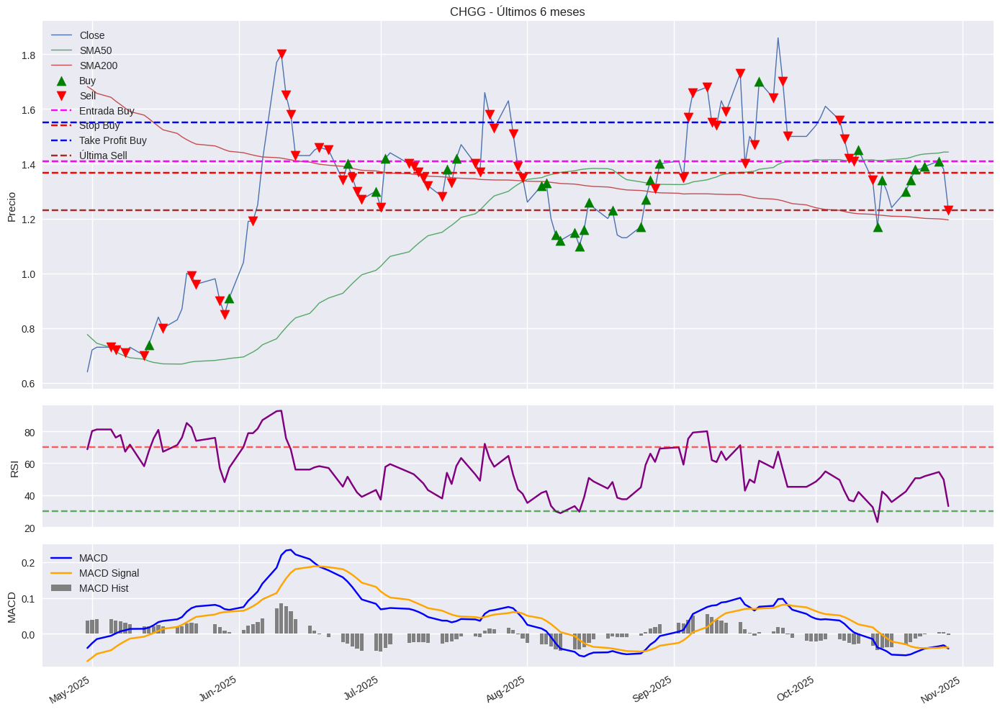

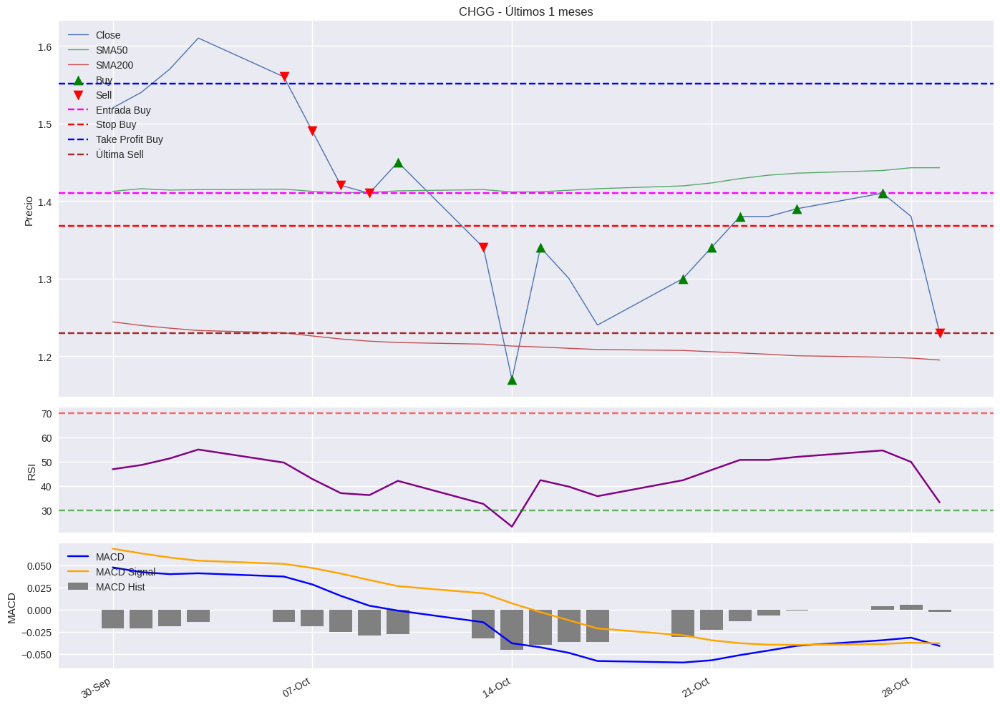


===== Resumen =====
Última Buy: 2025-10-27 a 1.410
 - Stop: 1.368, Take Profit: 1.551
Última Sell: 2025-10-29 a 1.230


In [ ]:
# =========================
# Script completo de trading con indicadores, señales y gráficas
# =========================

import yfinance as yf
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from pandas.tseries.offsets import MonthEnd
from datetime import timedelta
import matplotlib.dates as mdates

# =========================
# Configuración
# =========================
SYMBOL = "CHGG"
STOP_PCT = 0.97
TP_PCT = 1.10
RSI_PERIOD = 14
MACD_FAST = 12
MACD_SLOW = 26
MACD_SIGNAL = 9
SMA_SHORT = 50
SMA_LONG = 200
VOL_MA = 20
PERIODS_MONTHS = [6, 1]  # para las gráficas

# =========================
# Descargar y limpiar datos
# =========================
def download_data(symbol):
    print(f"✅ Descargando datos históricos para {symbol} ...")
    df = yf.download(symbol, period="max", interval="1d", auto_adjust=True)

    # Aplanar MultiIndex si existe
    if isinstance(df.columns, pd.MultiIndex):
        df.columns = [col[0] if col[1]==symbol else col[1] for col in df.columns]
        rename_map = {col: c for col, c in zip(df.columns, ['Open','High','Low','Close','Volume'])}
        df.rename(columns=rename_map, inplace=True)

    df.dropna(inplace=True)
    print(f"📊 Datos descargados: {len(df)} filas. Columnas: {list(df.columns)}")
    print(f"✅ Datos listos. Primeras filas:\n{df.head(3)}")
    return df

# =========================
# Calcular indicadores
# =========================
def calculate_indicators(df):
    df = df.copy()
    df['SMA50'] = df['Close'].rolling(SMA_SHORT).mean()
    df['SMA200'] = df['Close'].rolling(SMA_LONG).mean()
    df['VolMA'] = df['Volume'].rolling(VOL_MA).mean()

    # RSI
    delta = df['Close'].diff()
    up = delta.clip(lower=0)
    down = -1*delta.clip(upper=0)
    roll_up = up.ewm(span=RSI_PERIOD, adjust=False).mean()
    roll_down = down.ewm(span=RSI_PERIOD, adjust=False).mean()
    rs = roll_up / roll_down
    df['RSI'] = 100 - (100 / (1 + rs))

    # MACD
    ema_fast = df['Close'].ewm(span=MACD_FAST, adjust=False).mean()
    ema_slow = df['Close'].ewm(span=MACD_SLOW, adjust=False).mean()
    df['MACD'] = ema_fast - ema_slow
    df['MACD_signal'] = df['MACD'].ewm(span=MACD_SIGNAL, adjust=False).mean()
    df['MACD_hist'] = df['MACD'] - df['MACD_signal']

    return df

# =========================
# Detectar señales
# =========================
def detect_signals(df):
    df = df.copy()
    df['Signal'] = ''
    buys = []
    sells = []

    for i in range(1, len(df)):
        row = df.iloc[i]
        prev = df.iloc[i-1]
        reasons_buy = []
        reasons_sell = []

        # Pullback sobre SMA50
        if pd.notna(prev['SMA50']) and pd.notna(row['SMA50']):
            if prev['Close'] <= prev['SMA50'] and row['Close'] > prev['Close']:
                reasons_buy.append('Pullback_SMA50')
            elif prev['Close'] >= prev['SMA50'] and row['Close'] < prev['Close']:
                reasons_sell.append('Pullback_SMA50')
        # Pullback sobre SMA200
        if pd.notna(prev['SMA200']) and pd.notna(row['SMA200']):
            if prev['Close'] <= prev['SMA200'] and row['Close'] > prev['Close']:
                reasons_buy.append('Pullback_SMA200')
            elif prev['Close'] >= prev['SMA200'] and row['Close'] < row['Close']:
                reasons_sell.append('Pullback_SMA200')

        # RSI
        if pd.notna(row['RSI']):
            if row['RSI'] < 30:
                reasons_buy.append('RSI_OVERSOLD')
            elif row['RSI'] > 70:
                reasons_sell.append('RSI_OVERBOUGHT')

        # SMA cross
        if pd.notna(prev['SMA50']) and pd.notna(prev['SMA200']):
            if prev['SMA50'] <= prev['SMA200'] and row['SMA50'] > row['SMA200']:
                reasons_buy.append('GoldenCross')
            elif prev['SMA50'] >= prev['SMA200'] and row['SMA50'] < row['SMA200']:
                reasons_sell.append('DeathCross')

        # MACD cross
        if pd.notna(prev['MACD']) and pd.notna(prev['MACD_signal']):
            if prev['MACD'] <= prev['MACD_signal'] and row['MACD'] > row['MACD_signal']:
                reasons_buy.append('MACD_CrossUp')
            elif prev['MACD'] >= prev['MACD_signal'] and row['MACD'] < row['MACD_signal']:
                reasons_sell.append('MACD_CrossDown')

        # Asignar señal
        if reasons_buy and not reasons_sell:
            df.at[df.index[i], 'Signal'] = 'Buy:' + '|'.join(reasons_buy)
            buys.append(df.index[i])
        elif reasons_sell and not reasons_buy:
            df.at[df.index[i], 'Signal'] = 'Sell:' + '|'.join(reasons_sell)
            sells.append(df.index[i])
        elif reasons_buy and reasons_sell:
            df.at[df.index[i], 'Signal'] = 'Mix:' + '|'.join(reasons_buy + reasons_sell)

    return df, buys, sells

# =========================
# Graficar con fechas limpias
# =========================
def plot_graphs(df, buys, sells, months, symbol):
    ultimo_dato = df.index.max()
    inicio = ultimo_dato - MonthEnd(months)
    df_plot = df[df.index >= inicio]
    buys_plot = [b for b in buys if b >= inicio]
    sells_plot = [s for s in sells if s >= inicio]

    fig, axs = plt.subplots(3, 1, figsize=(14, 10), sharex=True,
                            gridspec_kw={'height_ratios':[3,1,1]})
    ax_price, ax_rsi, ax_macd = axs

    # Precio y SMAs
    ax_price.plot(df_plot.index, df_plot['Close'], label='Close', linewidth=1)
    if df_plot['SMA50'].notna().any():
        ax_price.plot(df_plot.index, df_plot['SMA50'], label='SMA50', linewidth=1)
    if df_plot['SMA200'].notna().any():
        ax_price.plot(df_plot.index, df_plot['SMA200'], label='SMA200', linewidth=1)

    # Señales
    if buys_plot:
        ax_price.scatter(buys_plot, df_plot.loc[buys_plot, 'Close'],
                         marker='^', color='green', s=90, label='Buy', zorder=5)
    if sells_plot:
        ax_price.scatter(sells_plot, df_plot.loc[sells_plot, 'Close'],
                         marker='v', color='red', s=90, label='Sell', zorder=5)

    # Líneas de última Buy/Sell
    if buys_plot:
        last_buy = buys_plot[-1]
        entry = df_plot.loc[last_buy, 'Close']
        stop = entry * STOP_PCT
        target = entry * TP_PCT
        ax_price.axhline(entry, linestyle='--', color='magenta', label='Entrada Buy')
        ax_price.axhline(stop, linestyle='--', color='red', label='Stop Buy')
        ax_price.axhline(target, linestyle='--', color='blue', label='Take Profit Buy')
    if sells_plot:
        last_sell = sells_plot[-1]
        entry_sell = df_plot.loc[last_sell, 'Close']
        ax_price.axhline(entry_sell, linestyle='--', color='brown', label='Última Sell')

    ax_price.set_title(f"{symbol} - Últimos {months} meses")
    ax_price.set_ylabel("Precio")
    ax_price.grid(True)
    ax_price.legend(loc='upper left')

    # RSI
    ax_rsi.plot(df_plot.index, df_plot['RSI'], color='purple')
    ax_rsi.axhline(70, linestyle='--', alpha=0.6, color='red')
    ax_rsi.axhline(30, linestyle='--', alpha=0.6, color='green')
    ax_rsi.set_ylabel("RSI")
    ax_rsi.grid(True)

    # MACD
    ax_macd.plot(df_plot.index, df_plot['MACD'], color='blue', label='MACD')
    ax_macd.plot(df_plot.index, df_plot['MACD_signal'], color='orange', label='MACD Signal')
    ax_macd.bar(df_plot.index, df_plot['MACD_hist'], color='grey', label='MACD Hist')
    ax_macd.set_ylabel("MACD")
    ax_macd.grid(True)
    ax_macd.legend(loc='upper left')

    # Formatear fechas eje X
    if months <= 1:
        ax_macd.xaxis.set_major_locator(mdates.WeekdayLocator(interval=1))
        ax_macd.xaxis.set_major_formatter(mdates.DateFormatter('%d-%b'))
    else:
        ax_macd.xaxis.set_major_locator(mdates.MonthLocator())
        ax_macd.xaxis.set_major_formatter(mdates.DateFormatter('%b-%Y'))

    fig.autofmt_xdate()
    plt.tight_layout()
    plt.show()

# =========================
# Main
# =========================
def main():
    print("🏁 INICIO DEL SCRIPT")
    df = download_data(SYMBOL)
    df = calculate_indicators(df)
    df, buys, sells = detect_signals(df)
    print(f"✅ Detección completada. Buy={len(buys)}, Sell={len(sells)}\n")

    # Resumen últimas señales
    if buys:
        last_buy = buys[-1]
        entry = df.loc[last_buy, 'Close']
        stop = entry * STOP_PCT
        target = entry * TP_PCT
    if sells:
        last_sell = sells[-1]
        entry_sell = df.loc[last_sell, 'Close']

    print("📊 Últimas 10 señales detectadas:")
    display_df = df[['Close','SMA50','SMA200','Signal']].tail(10)
    print(display_df)

    print("\n📈 Generando gráficas para últimos 6 meses y último mes...")
    for m in PERIODS_MONTHS:
        plot_graphs(df, buys, sells, m, SYMBOL)

    print("\n===== Resumen =====")
    if buys:
        print(f"Última Buy: {last_buy.date()} a {entry:.3f}")
        print(f" - Stop: {stop:.3f}, Take Profit: {target:.3f}")
    if sells:
        print(f"Última Sell: {last_sell.date()} a {entry_sell:.3f}")

    return df

# =========================
# Ejecutar
# =========================
if __name__ == "__main__":
    main()


🏁 INICIO DEL SCRIPT
✅ Descargando datos históricos para ORY.MC ...


[*********************100%***********************]  1 of 1 completed


📊 Datos descargados: 2528 filas. Columnas: ['Open', 'High', 'Low', 'Close', 'Volume']
✅ Datos listos. Primeras filas:
             Open   High    Low  Close  Volume
Date                                          
2015-12-14  4.600  5.250  4.490  4.490  532562
2015-12-15  4.013  5.190  4.013  4.900  340731
2015-12-16  3.900  4.111  3.665  4.100  242740
2015-12-17  3.601  4.000  3.601  3.960  145756
2015-12-18  3.551  3.695  3.551  3.695   81910
➡️ Calculando indicadores...
✅ Indicadores calculados.
➡️ Detectando señales...
✅ Detección completada. Buy=1500, Sell=1768

📊 Últimas 10 señales detectadas:
            Close   SMA50    SMA200                                  Signal
Date                                                                       
2025-10-16  3.490  2.9764  2.649665     Buy:Pullback_SMA50|Buy:MACD_CrossUp
2025-10-17  3.410  2.9932  2.659325  Buy:Pullback_SMA50|Sell:MACD_CrossDown
2025-10-20  3.120  3.0025  2.667365  Buy:Pullback_SMA50|Sell:MACD_CrossDown
2025-10-21  3.2

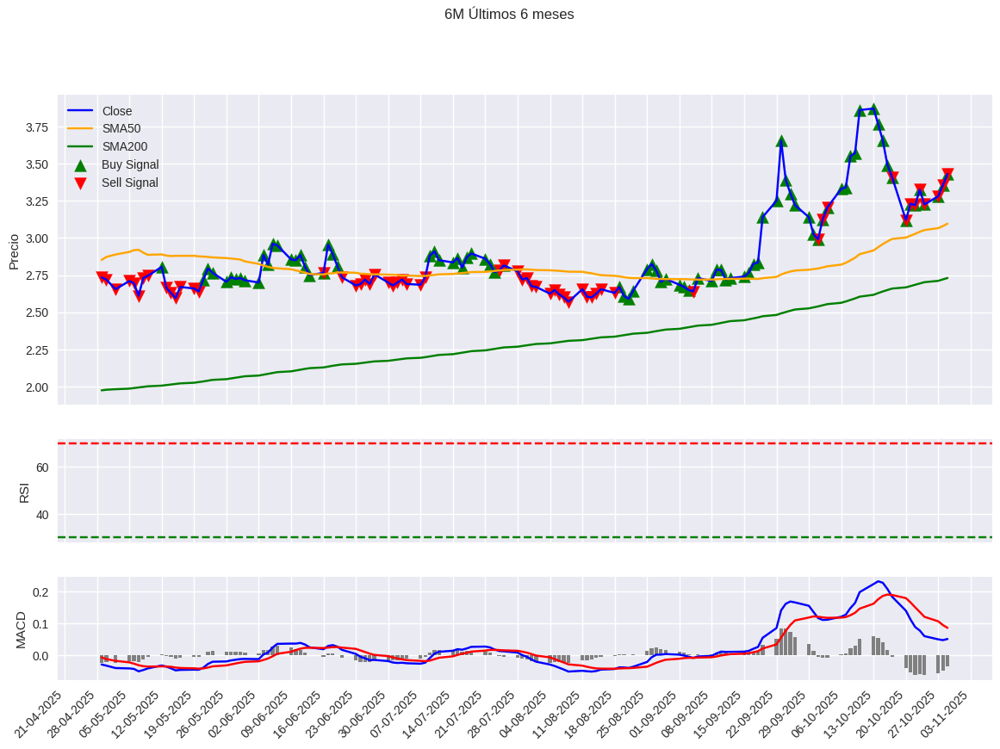


📈 Generando gráficas para último mes...


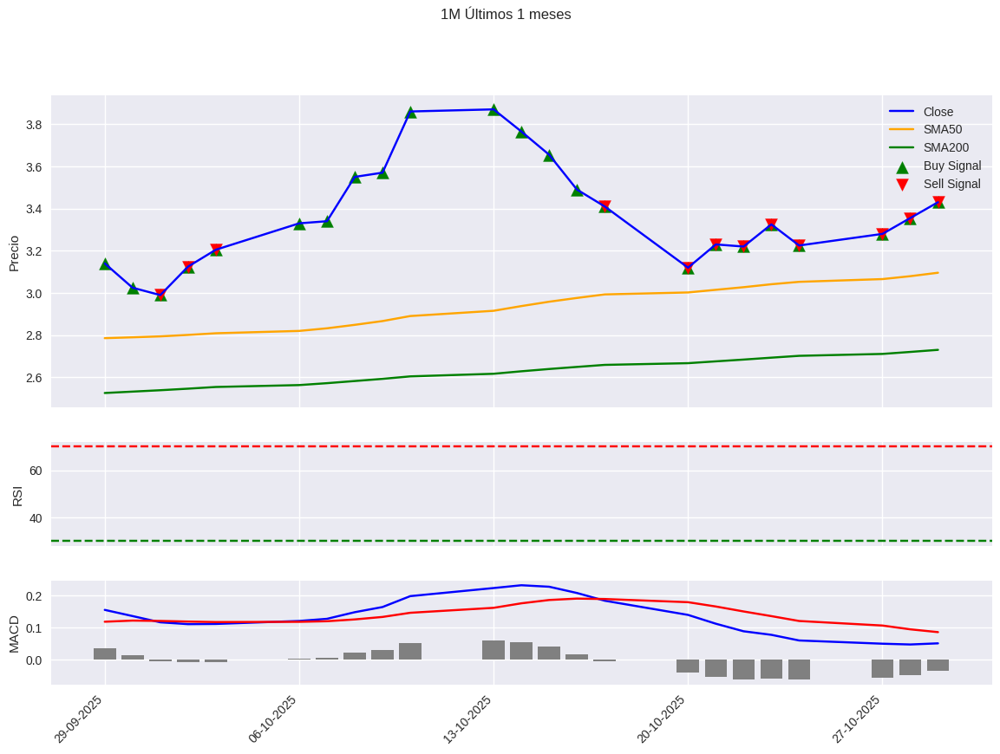

In [ ]:
import yfinance as yf
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.dates import DateFormatter, WeekdayLocator, MO

# ------------------------------
# FUNCIONES DE INDICADORES
# ------------------------------
def calcular_indicadores(df):
    df['SMA50'] = df['Close'].rolling(window=50).mean()
    df['SMA200'] = df['Close'].rolling(window=200).mean()
    # RSI 14 días
    delta = df['Close'].diff()
    gain = np.where(delta>0, delta, 0)
    loss = np.where(delta<0, -delta, 0)
    avg_gain = pd.Series(gain).rolling(window=14).mean()
    avg_loss = pd.Series(loss).rolling(window=14).mean()
    rs = avg_gain / avg_loss
    df['RSI'] = 100 - (100 / (1 + rs))
    # MACD
    ema12 = df['Close'].ewm(span=12, adjust=False).mean()
    ema26 = df['Close'].ewm(span=26, adjust=False).mean()
    df['MACD'] = ema12 - ema26
    df['MACD_signal'] = df['MACD'].ewm(span=9, adjust=False).mean()
    df['MACD_hist'] = df['MACD'] - df['MACD_signal']
    return df

# ------------------------------
# FUNCIONES DE SEÑALES
# ------------------------------
def detectar_senales(df):
    signals = []
    for i in range(len(df)):
        row = df.iloc[i]
        signal = []
        if row['Close'] > row['SMA50'] and row['Close'] > row['SMA200']:
            signal.append('Buy:Pullback_SMA50')
        elif row['Close'] < row['SMA50'] and row['Close'] < row['SMA200']:
            signal.append('Sell:Pullback_SMA50')
        if row['RSI'] < 30:
            signal.append('Buy:RSI_OVERSOLD')
        elif row['RSI'] > 70:
            signal.append('Sell:RSI_OVERBOUGHT')
        if row['MACD'] > row['MACD_signal']:
            signal.append('Buy:MACD_CrossUp')
        elif row['MACD'] < row['MACD_signal']:
            signal.append('Sell:MACD_CrossDown')
        signals.append('|'.join(signal))
    df['Signal'] = signals
    return df

# ------------------------------
# FUNCION DE GRAFICAS CON SEÑALES
# ------------------------------
def plot_graphs(df, months=6, title_suffix=''):
    last_date = df.index.max()
    inicio = last_date - pd.DateOffset(months=months)
    df_plot = df[df.index >= inicio]

    fig, axs = plt.subplots(3, 1, figsize=(14,10), sharex=True,
                            gridspec_kw={'height_ratios':[3,1,1]})

    # --- Precio y SMA
    axs[0].plot(df_plot.index, df_plot['Close'], label='Close', color='blue')
    axs[0].plot(df_plot.index, df_plot['SMA50'], label='SMA50', color='orange')
    axs[0].plot(df_plot.index, df_plot['SMA200'], label='SMA200', color='green')

    # Marcamos señales
    buys = df_plot[df_plot['Signal'].str.contains('Buy')].index
    sells = df_plot[df_plot['Signal'].str.contains('Sell')].index
    axs[0].scatter(buys, df_plot.loc[buys, 'Close'], marker='^', color='green', s=100, label='Buy Signal')
    axs[0].scatter(sells, df_plot.loc[sells, 'Close'], marker='v', color='red', s=100, label='Sell Signal')

    axs[0].set_ylabel('Precio')
    axs[0].legend()
    axs[0].grid(True)

    # --- RSI
    axs[1].plot(df_plot.index, df_plot['RSI'], label='RSI', color='purple')
    axs[1].axhline(70, color='red', linestyle='--')
    axs[1].axhline(30, color='green', linestyle='--')
    axs[1].set_ylabel('RSI')
    axs[1].grid(True)

    # --- MACD
    axs[2].plot(df_plot.index, df_plot['MACD'], label='MACD', color='blue')
    axs[2].plot(df_plot.index, df_plot['MACD_signal'], label='Signal', color='red')
    axs[2].bar(df_plot.index, df_plot['MACD_hist'], label='Hist', color='gray')
    axs[2].set_ylabel('MACD')
    axs[2].grid(True)

    # Formato eje X
    locator = WeekdayLocator(byweekday=MO, interval=1)
    axs[2].xaxis.set_major_locator(locator)
    axs[2].xaxis.set_major_formatter(DateFormatter("%d-%m-%Y"))
    fig.autofmt_xdate(rotation=45)
    plt.suptitle(f"{title_suffix} Últimos {months} meses")
    plt.show()

# ------------------------------
# FUNCION PRINCIPAL
# ------------------------------
def main():
    symbol = 'ORY.MC'
    print("🏁 INICIO DEL SCRIPT")
    print(f"✅ Descargando datos históricos para {symbol} ...")
    df = yf.download(symbol, period='10y', auto_adjust=True)
    df.columns = ['Open','High','Low','Close','Volume']

    print(f"📊 Datos descargados: {df.shape[0]} filas. Columnas: {list(df.columns)}")
    print("✅ Datos listos. Primeras filas:")
    print(df.head())

    # Indicadores
    print("➡️ Calculando indicadores...")
    df = calcular_indicadores(df)
    print("✅ Indicadores calculados.")

    # Señales
    print("➡️ Detectando señales...")
    df = detectar_senales(df)
    buy_count = df['Signal'].str.contains('Buy').sum()
    sell_count = df['Signal'].str.contains('Sell').sum()
    print(f"✅ Detección completada. Buy={buy_count}, Sell={sell_count}")

    # Últimas señales
    print("\n📊 Últimas 10 señales detectadas:")
    print(df[['Close','SMA50','SMA200','Signal']].tail(10))

    # Niveles trading (última Buy y Sell)
    last_buy = df[df['Signal'].str.contains('Buy')].iloc[-1]
    last_sell = df[df['Signal'].str.contains('Sell')].iloc[-1]
    print("\n===== Resumen =====")
    print(f"Última Buy: {last_buy.name.date()} a {last_buy['Close']:.3f}")
    print(f"Última Sell: {last_sell.name.date()} a {last_sell['Close']:.3f}")

    # Graficas últimos 6 meses y último mes
    print("\n📈 Generando gráficas para últimos 6 meses...")
    plot_graphs(df, months=6, title_suffix='6M')
    print("\n📈 Generando gráficas para último mes...")
    plot_graphs(df, months=1, title_suffix='1M')

# ------------------------------
if __name__ == "__main__":
    main()


/tmp/ipython-input-1707512187.py:108: FutureWarning: YF.download() has changed argument auto_adjust default to True
  df = yf.download(symbol, period='10y')
[*********************100%***********************]  1 of 1 completed

🏁 INICIO DEL SCRIPT
✅ Descargando datos históricos para ORY.MC ...
📊 Datos descargados: 2528 filas. Columnas: ['Close', 'High', 'Low', 'Open', 'Volume']
✅ Datos listos. Primeras filas:
Price       Close   High    Low   Open  Volume
Date                                          
2015-12-14  4.600  5.250  4.490  4.490  532562
2015-12-15  4.013  5.190  4.013  4.900  340731
2015-12-16  3.900  4.111  3.665  4.100  242740
2015-12-17  3.601  4.000  3.601  3.960  145756
2015-12-18  3.551  3.695  3.551  3.695   81910
➡️ Calculando indicadores...
✅ Indicadores calculados.
➡️ Detectando señales...


✅ Detección completada. Buy=1546, Sell=962

===== Resumen =====
Última Buy: 2025-09-12 a 2.710
 - Stop: 2.629, Take Profit: 2.981
Última Sell: 2025-10-29 a 3.530
📈 Generando gráficas últimos 6 meses...


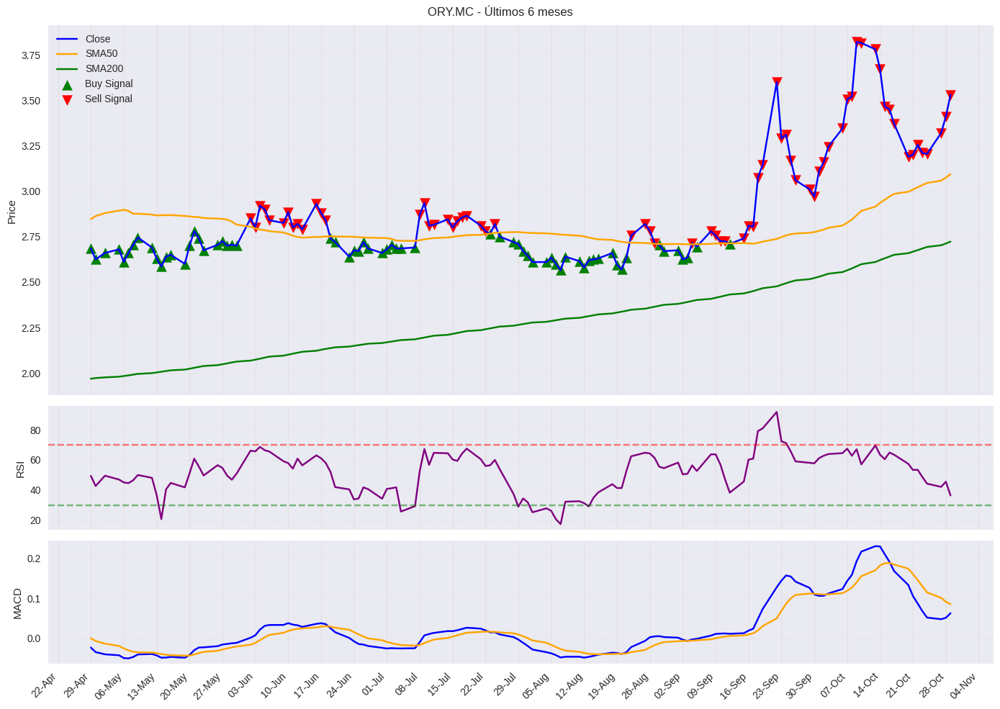

📈 Generando gráficas último mes...


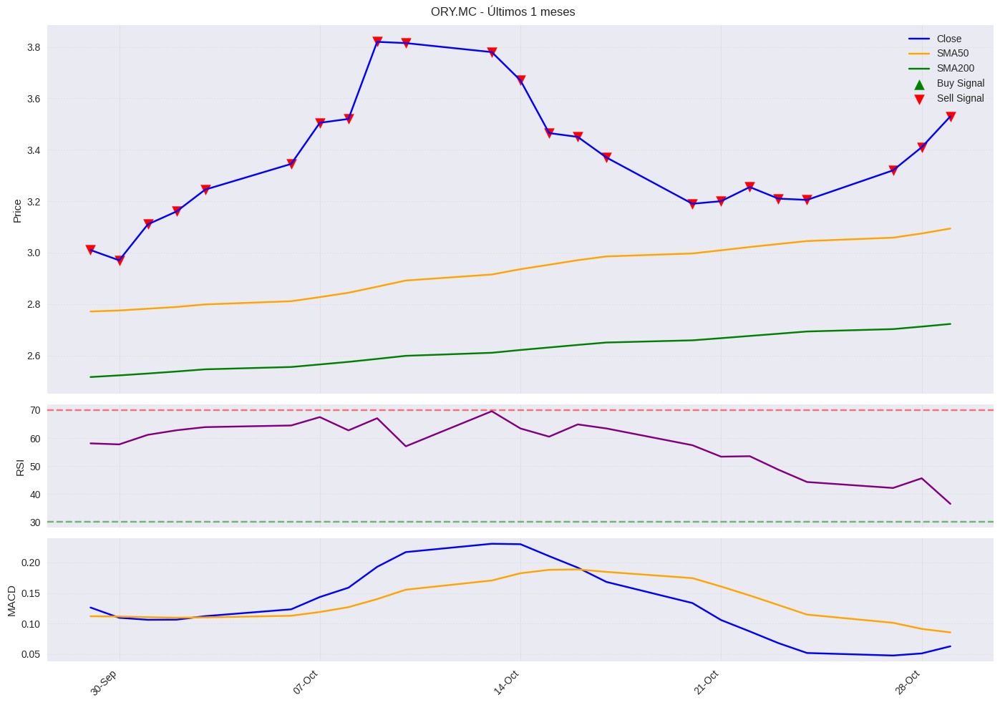

In [ ]:
import yfinance as yf
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.dates as mdates

# ======================
# Funciones de indicadores
# ======================

def calc_indicators(df):
    df['SMA50'] = df['Close'].rolling(window=50).mean()
    df['SMA200'] = df['Close'].rolling(window=200).mean()
    delta = df['Close'].diff()
    gain = delta.clip(lower=0)
    loss = -delta.clip(upper=0)
    avg_gain = gain.rolling(14).mean()
    avg_loss = loss.rolling(14).mean()
    rs = avg_gain / avg_loss
    df['RSI'] = 100 - (100 / (1 + rs))

    # MACD
    ema12 = df['Close'].ewm(span=12, adjust=False).mean()
    ema26 = df['Close'].ewm(span=26, adjust=False).mean()
    df['MACD'] = ema12 - ema26
    df['MACD_signal'] = df['MACD'].ewm(span=9, adjust=False).mean()

    return df

# ======================
# Función para detectar señales
# ======================

def detect_signals(df):
    signals = []
    for i in range(1, len(df)):
        signal = ''
        # RSI
        if df['RSI'].iloc[i] < 30:
            signal += 'Buy:RSI_OVERSOLD'
        elif df['RSI'].iloc[i] > 70:
            signal += 'Sell:RSI_OVERBOUGHT'
        # Pullbacks SMA
        if df['Close'].iloc[i] < df['SMA50'].iloc[i]:
            if signal: signal += '|'
            signal += 'Buy:SMA50'
        if df['Close'].iloc[i] > df['SMA50'].iloc[i]:
            if signal: signal += '|'
            signal += 'Sell:SMA50'
        signals.append(signal)
    df['Signal'] = [''] + signals
    return df

def plot_graphs(df, symbol, months=6):
    # Filtrar últimos X meses
    inicio = df.index.max() - pd.DateOffset(months=months)
    df_plot = df[df.index >= inicio]

    fig, axs = plt.subplots(3,1, figsize=(14,10), sharex=True, gridspec_kw={'height_ratios':[3,1,1]})

    # Precio con SMA y señales
    axs[0].plot(df_plot.index, df_plot['Close'], label='Close', color='blue')
    axs[0].plot(df_plot.index, df_plot['SMA50'], label='SMA50', color='orange')
    axs[0].plot(df_plot.index, df_plot['SMA200'], label='SMA200', color='green')

    buys = df_plot[df_plot['Signal'].str.contains('Buy', na=False)]
    sells = df_plot[df_plot['Signal'].str.contains('Sell', na=False)]
    axs[0].scatter(buys.index, buys['Close'], marker='^', color='green', s=100, label='Buy Signal')
    axs[0].scatter(sells.index, sells['Close'], marker='v', color='red', s=100, label='Sell Signal')

    axs[0].set_ylabel('Price')
    axs[0].legend()
    axs[0].grid(axis='x', color='#e0e0e0', linestyle='-', linewidth=0.7)
    axs[0].grid(axis='y', color='#e0e0e0', linestyle='--', linewidth=0.5)

    # RSI
    axs[1].plot(df_plot.index, df_plot['RSI'], label='RSI', color='purple')
    axs[1].axhline(70, color='red', linestyle='--', alpha=0.5)
    axs[1].axhline(30, color='green', linestyle='--', alpha=0.5)
    axs[1].set_ylabel('RSI')
    axs[1].grid(axis='x', color='#e0e0e0', linestyle='-', linewidth=0.7)
    axs[1].grid(axis='y', color='#e0e0e0', linestyle='--', linewidth=0.5)

    # MACD
    axs[2].plot(df_plot.index, df_plot['MACD'], label='MACD', color='blue')
    axs[2].plot(df_plot.index, df_plot['MACD_signal'], label='Signal', color='orange')
    axs[2].set_ylabel('MACD')
    axs[2].grid(axis='x', color='#e0e0e0', linestyle='-', linewidth=0.7)
    axs[2].grid(axis='y', color='#e0e0e0', linestyle='--', linewidth=0.5)

    # Eje X con fechas legibles
    axs[2].xaxis.set_major_locator(mdates.WeekdayLocator(interval=1))  # Marca cada semana
    axs[2].xaxis.set_major_formatter(mdates.DateFormatter('%d-%b'))
    plt.setp(axs[2].xaxis.get_majorticklabels(), rotation=45, ha='right')

    plt.suptitle(f'{symbol} - Últimos {months} meses')
    plt.tight_layout()
    plt.show()


# ======================
# Función principal
# ======================

def main(symbol='ORY.MC'):
    print("🏁 INICIO DEL SCRIPT")
    print(f"✅ Descargando datos históricos para {symbol} ...")
    df = yf.download(symbol, period='10y')
    df.columns = df.columns.get_level_values(0)  # Aplanar MultiIndex
    print(f"📊 Datos descargados: {len(df)} filas. Columnas: {list(df.columns)}")

    df.dropna(inplace=True)
    print(f"✅ Datos listos. Primeras filas:\n{df.head()}")

    print("➡️ Calculando indicadores...")
    df = calc_indicators(df)
    print("✅ Indicadores calculados.")

    print("➡️ Detectando señales...")
    df = detect_signals(df)
    n_buy = df['Signal'].str.contains('Buy', na=False).sum()
    n_sell = df['Signal'].str.contains('Sell', na=False).sum()
    print(f"✅ Detección completada. Buy={n_buy}, Sell={n_sell}")

    # Últimas señales
    buy_df = df[df['Signal'].str.contains('Buy', na=False)]
    sell_df = df[df['Signal'].str.contains('Sell', na=False)]
    last_buy = buy_df.iloc[-1] if not buy_df.empty else None
    last_sell = sell_df.iloc[-1] if not sell_df.empty else None

    print("\n===== Resumen =====")
    if last_buy is not None:
        fecha_buy = last_buy.name if isinstance(last_buy.name, pd.Timestamp) else last_buy.index[-1]
        precio_buy = float(last_buy['Close'])
        print(f"Última Buy: {fecha_buy.date()} a {precio_buy:.3f}")
        print(f" - Stop: {precio_buy*0.97:.3f}, Take Profit: {precio_buy*1.10:.3f}")
    if last_sell is not None:
        fecha_sell = last_sell.name if isinstance(last_sell.name, pd.Timestamp) else last_sell.index[-1]
        precio_sell = float(last_sell['Close'])
        print(f"Última Sell: {fecha_sell.date()} a {precio_sell:.3f}")

    # Graficar últimos 6 meses
    print("📈 Generando gráficas últimos 6 meses...")
    plot_graphs(df, symbol, months=6)

    # Graficar último mes
    print("📈 Generando gráficas último mes...")
    plot_graphs(df, symbol, months=1)

    return df

# ======================
# Ejecutar
# ======================

if __name__ == "__main__":
    df_result = main('ORY.MC')


🏁 INICIO DEL SCRIPT
✅ Descargando datos históricos para RUN ...


/tmp/ipython-input-3926710238.py:109: FutureWarning: YF.download() has changed argument auto_adjust default to True
  df = yf.download(symbol, period='10y')
[*********************100%***********************]  1 of 1 completed


📊 Datos descargados: 2515 filas. Columnas: ['Close', 'High', 'Low', 'Open', 'Volume']
➡️ Calculando indicadores...
✅ Indicadores calculados.
➡️ Detectando señales...
✅ Detección completada. Buy=391, Sell=476

===== Resumen =====
Última Buy: 2025-07-01 a 9.040
 - Stop: 8.769, Take Profit: 9.944
Última Sell: 2025-10-15 a 21.290

📈 Generando gráficas para últimos 6 meses y último mes...


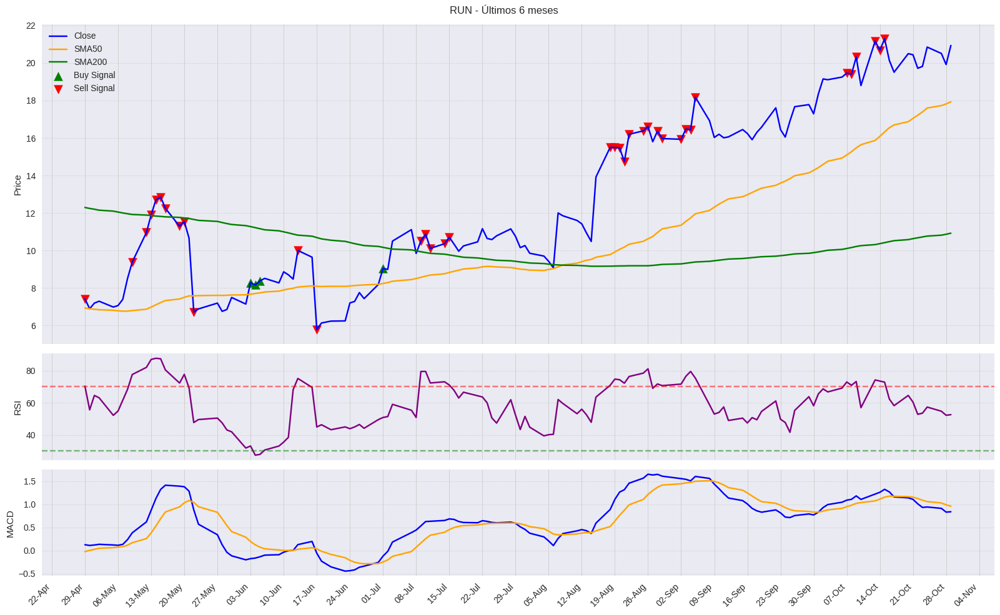

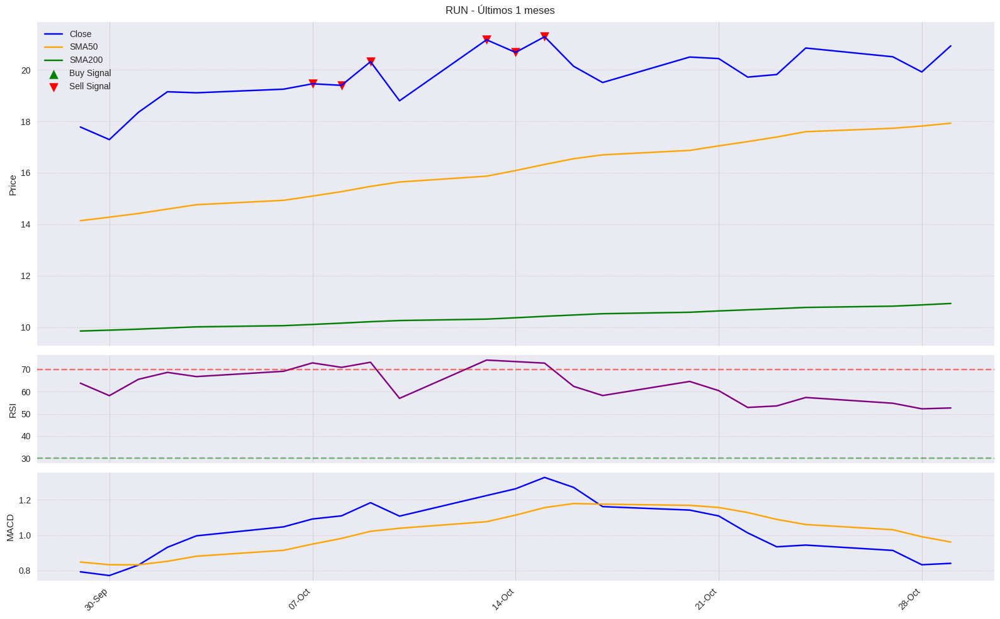

In [ ]:
import yfinance as yf
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import numpy as np

# ======================
# Funciones de indicadores
# ======================

def calculate_indicators(df):
    df['SMA50'] = df['Close'].rolling(window=50).mean()
    df['SMA200'] = df['Close'].rolling(window=200).mean()

    # RSI
    delta = df['Close'].diff()
    gain = delta.where(delta>0, 0)
    loss = -delta.where(delta<0, 0)
    avg_gain = gain.rolling(14).mean()
    avg_loss = loss.rolling(14).mean()
    rs = avg_gain / avg_loss
    df['RSI'] = 100 - (100 / (1 + rs))

    # MACD
    ema12 = df['Close'].ewm(span=12, adjust=False).mean()
    ema26 = df['Close'].ewm(span=26, adjust=False).mean()
    df['MACD'] = ema12 - ema26
    df['MACD_signal'] = df['MACD'].ewm(span=9, adjust=False).mean()

    return df

# ======================
# Función detección señales
# ======================

def detect_signals(df):
    signals = []
    for i in range(len(df)):
        sig = []
        if df['RSI'].iloc[i] < 30:
            sig.append('Buy:RSI_OVERSOLD')
        elif df['RSI'].iloc[i] > 70:
            sig.append('Sell:RSI_OVERBOUGHT')
        if i>0 and df['Close'].iloc[i] > df['SMA50'].iloc[i] and df['Close'].iloc[i-1] <= df['SMA50'].iloc[i-1]:
            sig.append('Buy:Pullback_SMA50')
        elif i>0 and df['Close'].iloc[i] < df['SMA50'].iloc[i] and df['Close'].iloc[i-1] >= df['SMA50'].iloc[i-1]:
            sig.append('Sell:Pullback_SMA50')
        signals.append('|'.join(sig) if sig else '')
    df['Signal'] = signals
    return df

# ======================
# Función de graficado
# ======================

def plot_graphs(df, symbol, months=6):
    inicio = df.index.max() - pd.DateOffset(months=months)
    df_plot = df[df.index >= inicio]

    fig, axs = plt.subplots(3,1, figsize=(16,10), sharex=True, gridspec_kw={'height_ratios':[3,1,1]})

    # Precio + SMA + señales
    axs[0].plot(df_plot.index, df_plot['Close'], label='Close', color='blue')
    axs[0].plot(df_plot.index, df_plot['SMA50'], label='SMA50', color='orange')
    axs[0].plot(df_plot.index, df_plot['SMA200'], label='SMA200', color='green')
    buys = df_plot[df_plot['Signal'].str.contains('Buy', na=False)]
    sells = df_plot[df_plot['Signal'].str.contains('Sell', na=False)]
    axs[0].scatter(buys.index, buys['Close'], marker='^', color='green', s=100, label='Buy Signal')
    axs[0].scatter(sells.index, sells['Close'], marker='v', color='red', s=100, label='Sell Signal')
    axs[0].set_ylabel('Price')
    axs[0].legend()

    # Cuadrícula con más líneas visibles
    axs[0].grid(axis='x', color='#d0d0d0', linestyle='-', linewidth=0.7)
    axs[0].grid(axis='y', color='#d0d0d0', linestyle='--', linewidth=0.5)

    # RSI
    axs[1].plot(df_plot.index, df_plot['RSI'], label='RSI', color='purple')
    axs[1].axhline(70, color='red', linestyle='--', alpha=0.5)
    axs[1].axhline(30, color='green', linestyle='--', alpha=0.5)
    axs[1].set_ylabel('RSI')
    axs[1].grid(axis='x', color='#d0d0d0', linestyle='-', linewidth=0.7)
    axs[1].grid(axis='y', color='#d0d0d0', linestyle='--', linewidth=0.5)

    # MACD
    axs[2].plot(df_plot.index, df_plot['MACD'], label='MACD', color='blue')
    axs[2].plot(df_plot.index, df_plot['MACD_signal'], label='Signal', color='orange')
    axs[2].set_ylabel('MACD')
    axs[2].grid(axis='x', color='#d0d0d0', linestyle='-', linewidth=0.7)
    axs[2].grid(axis='y', color='#d0d0d0', linestyle='--', linewidth=0.5)

    # Eje X
    axs[2].xaxis.set_major_locator(mdates.WeekdayLocator(interval=1))
    axs[2].xaxis.set_minor_locator(mdates.DayLocator(interval=1))
    axs[2].xaxis.set_major_formatter(mdates.DateFormatter('%d-%b'))
    plt.setp(axs[2].xaxis.get_majorticklabels(), rotation=45, ha='right')

    plt.suptitle(f'{symbol} - Últimos {months} meses')
    plt.tight_layout()
    plt.show()

# ======================
# Función principal
# ======================

def main(symbol):
    print("🏁 INICIO DEL SCRIPT")
    print(f"✅ Descargando datos históricos para {symbol} ...")
    df = yf.download(symbol, period='10y')

    # Si las columnas vienen multiindex
    if isinstance(df.columns, pd.MultiIndex):
        df.columns = df.columns.get_level_values(0)

    print(f"📊 Datos descargados: {df.shape[0]} filas. Columnas: {list(df.columns)}")

    df = calculate_indicators(df)
    print("➡️ Calculando indicadores...")
    print("✅ Indicadores calculados.")

    df = detect_signals(df)
    print("➡️ Detectando señales...")
    buy_count = df['Signal'].str.contains('Buy', na=False).sum()
    sell_count = df['Signal'].str.contains('Sell', na=False).sum()
    print(f"✅ Detección completada. Buy={buy_count}, Sell={sell_count}")

    # Última Buy y Sell
    last_buy = df[df['Signal'].str.contains('Buy', na=False)].iloc[-1] if buy_count>0 else None
    last_sell = df[df['Signal'].str.contains('Sell', na=False)].iloc[-1] if sell_count>0 else None

    print("\n===== Resumen =====")
    if last_buy is not None:
        print(f"Última Buy: {last_buy.name.date()} a {last_buy['Close']:.3f}")
        print(f" - Stop: {last_buy['Close']*0.97:.3f}, Take Profit: {last_buy['Close']*1.10:.3f}")
    if last_sell is not None:
        print(f"Última Sell: {last_sell.name.date()} a {last_sell['Close']:.3f}")

    # Mostrar las gráficas
    print(f"\n📈 Generando gráficas para últimos 6 meses y último mes...")
    plot_graphs(df, symbol, months=6)
    plot_graphs(df, symbol, months=1)

    return df

# ======================
# Ejecutar
# ======================

if __name__ == "__main__":
    df_result = main('RUN')


🏁 INICIO DEL SCRIPT
✅ Descargando datos históricos para CISS ...


/tmp/ipython-input-991346800.py:115: FutureWarning: YF.download() has changed argument auto_adjust default to True
  df = yf.download(symbol, period='10y')
[*********************100%***********************]  1 of 1 completed


📊 Datos descargados: 597 filas. Columnas: ['Close', 'High', 'Low', 'Open', 'Volume']
➡️ Calculando indicadores...
✅ Indicadores calculados.
➡️ Detectando señales...
✅ Detección completada. Buy=179, Sell=27

===== Resumen =====
Última Buy: 2025-10-28 a 2.150
 - Stop: 2.086, Take Profit: 2.365
Última Sell: 2025-10-08 a 2.580

📈 Generando gráficas para últimos 6 meses y último mes...


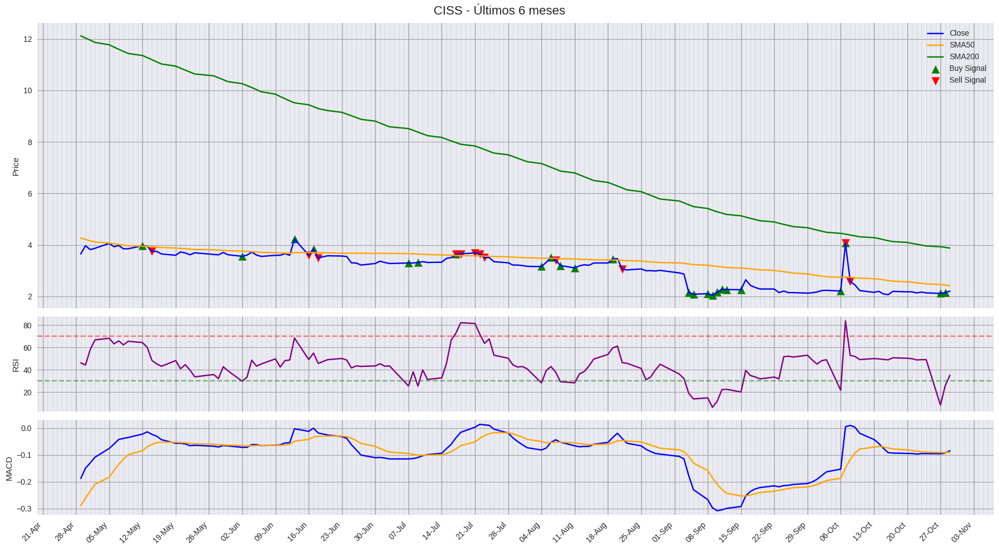

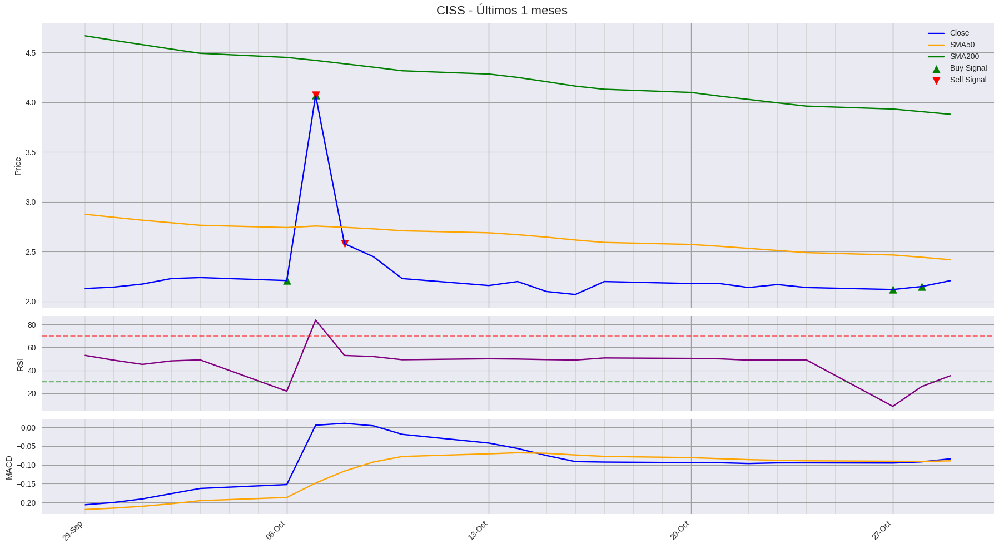

In [ ]:
# @title Texto de título predeterminado
import yfinance as yf
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import numpy as np

# ======================
# Funciones de indicadores
# ======================

def calculate_indicators(df):
    df['SMA50'] = df['Close'].rolling(window=50).mean()
    df['SMA200'] = df['Close'].rolling(window=200).mean()

    # RSI
    delta = df['Close'].diff()
    gain = delta.where(delta>0, 0)
    loss = -delta.where(delta<0, 0)
    avg_gain = gain.rolling(14).mean()
    avg_loss = loss.rolling(14).mean()
    rs = avg_gain / avg_loss
    df['RSI'] = 100 - (100 / (1 + rs))

    # MACD
    ema12 = df['Close'].ewm(span=12, adjust=False).mean()
    ema26 = df['Close'].ewm(span=26, adjust=False).mean()
    df['MACD'] = ema12 - ema26
    df['MACD_signal'] = df['MACD'].ewm(span=9, adjust=False).mean()

    return df

# ======================
# Función detección señales
# ======================

def detect_signals(df):
    signals = []
    for i in range(len(df)):
        sig = []
        if df['RSI'].iloc[i] < 30:
            sig.append('Buy:RSI_OVERSOLD')
        elif df['RSI'].iloc[i] > 70:
            sig.append('Sell:RSI_OVERBOUGHT')
        if i>0 and df['Close'].iloc[i] > df['SMA50'].iloc[i] and df['Close'].iloc[i-1] <= df['SMA50'].iloc[i-1]:
            sig.append('Buy:Pullback_SMA50')
        elif i>0 and df['Close'].iloc[i] < df['SMA50'].iloc[i] and df['Close'].iloc[i-1] >= df['SMA50'].iloc[i-1]:
            sig.append('Sell:Pullback_SMA50')
        signals.append('|'.join(sig) if sig else '')
    df['Signal'] = signals
    return df

# ======================
# Función de graficado “milimétrica”
# ======================

def plot_graphs(df, symbol, months=6):
    inicio = df.index.max() - pd.DateOffset(months=months)
    df_plot = df[df.index >= inicio]

    fig, axs = plt.subplots(3,1, figsize=(18,10), sharex=True, gridspec_kw={'height_ratios':[3,1,1]})

    # Precio + SMA + señales
    axs[0].plot(df_plot.index, df_plot['Close'], label='Close', color='blue')
    axs[0].plot(df_plot.index, df_plot['SMA50'], label='SMA50', color='orange')
    axs[0].plot(df_plot.index, df_plot['SMA200'], label='SMA200', color='green')
    buys = df_plot[df_plot['Signal'].str.contains('Buy', na=False)]
    sells = df_plot[df_plot['Signal'].str.contains('Sell', na=False)]
    axs[0].scatter(buys.index, buys['Close'], marker='^', color='green', s=100, label='Buy Signal')
    axs[0].scatter(sells.index, sells['Close'], marker='v', color='red', s=100, label='Sell Signal')
    axs[0].set_ylabel('Price')
    axs[0].legend()

    # Cuadrícula milimétrica: líneas diarias finas, semanales más gruesas
    axs[0].xaxis.set_major_locator(mdates.WeekdayLocator(byweekday=mdates.MO))
    axs[0].xaxis.set_minor_locator(mdates.DayLocator())
    axs[0].xaxis.set_major_formatter(mdates.DateFormatter('%d-%b'))
    axs[0].grid(which='major', axis='x', color='#a0a0a0', linestyle='-', linewidth=1.0)
    axs[0].grid(which='minor', axis='x', color='#d0d0d0', linestyle='-', linewidth=0.5)
    axs[0].grid(which='major', axis='y', color='#a0a0a0', linestyle='-', linewidth=0.8)
    axs[0].grid(which='minor', axis='y', color='#d0d0d0', linestyle='--', linewidth=0.4)

    # RSI
    axs[1].plot(df_plot.index, df_plot['RSI'], label='RSI', color='purple')
    axs[1].axhline(70, color='red', linestyle='--', alpha=0.5)
    axs[1].axhline(30, color='green', linestyle='--', alpha=0.5)
    axs[1].set_ylabel('RSI')
    axs[1].grid(which='major', axis='x', color='#a0a0a0', linestyle='-', linewidth=1.0)
    axs[1].grid(which='minor', axis='x', color='#d0d0d0', linestyle='-', linewidth=0.5)
    axs[1].grid(which='major', axis='y', color='#a0a0a0', linestyle='-', linewidth=0.8)
    axs[1].grid(which='minor', axis='y', color='#d0d0d0', linestyle='--', linewidth=0.4)

    # MACD
    axs[2].plot(df_plot.index, df_plot['MACD'], label='MACD', color='blue')
    axs[2].plot(df_plot.index, df_plot['MACD_signal'], label='Signal', color='orange')
    axs[2].set_ylabel('MACD')
    axs[2].grid(which='major', axis='x', color='#a0a0a0', linestyle='-', linewidth=1.0)
    axs[2].grid(which='minor', axis='x', color='#d0d0d0', linestyle='-', linewidth=0.5)
    axs[2].grid(which='major', axis='y', color='#a0a0a0', linestyle='-', linewidth=0.8)
    axs[2].grid(which='minor', axis='y', color='#d0d0d0', linestyle='--', linewidth=0.4)

    # Formato eje X
    plt.setp(axs[2].xaxis.get_majorticklabels(), rotation=45, ha='right')

    plt.suptitle(f'{symbol} - Últimos {months} meses', fontsize=16)
    plt.tight_layout()
    plt.show()

# ======================
# Función principal
# ======================

def main(symbol):
    print("🏁 INICIO DEL SCRIPT")
    print(f"✅ Descargando datos históricos para {symbol} ...")
    df = yf.download(symbol, period='10y')

    # Ajuste si columnas MultiIndex
    if isinstance(df.columns, pd.MultiIndex):
        df.columns = df.columns.get_level_values(0)

    print(f"📊 Datos descargados: {df.shape[0]} filas. Columnas: {list(df.columns)}")

    df = calculate_indicators(df)
    print("➡️ Calculando indicadores...")
    print("✅ Indicadores calculados.")

    df = detect_signals(df)
    print("➡️ Detectando señales...")
    buy_count = df['Signal'].str.contains('Buy', na=False).sum()
    sell_count = df['Signal'].str.contains('Sell', na=False).sum()
    print(f"✅ Detección completada. Buy={buy_count}, Sell={sell_count}")

    # Última Buy y Sell
    last_buy = df[df['Signal'].str.contains('Buy', na=False)].iloc[-1] if buy_count>0 else None
    last_sell = df[df['Signal'].str.contains('Sell', na=False)].iloc[-1] if sell_count>0 else None

    print("\n===== Resumen =====")
    if last_buy is not None:
        print(f"Última Buy: {last_buy.name.date()} a {last_buy['Close']:.3f}")
        print(f" - Stop: {last_buy['Close']*0.97:.3f}, Take Profit: {last_buy['Close']*1.10:.3f}")
    if last_sell is not None:
        print(f"Última Sell: {last_sell.name.date()} a {last_sell['Close']:.3f}")

    # Mostrar gráficas
    print(f"\n📈 Generando gráficas para últimos 6 meses y último mes...")
    plot_graphs(df, symbol, months=6)
    plot_graphs(df, symbol, months=1)

    return df

# ======================
# Ejecutar
# ======================

if __name__ == "__main__":
    df_result = main('CISS')


[*********************100%***********************]  1 of 1 completed

🏁 INICIO DEL SCRIPT
✅ Descargando datos históricos para CISS ...
📊 Datos descargados: 597 filas. Columnas: ['Close', 'High', 'Low', 'Open', 'Volume']
➡️ Calculando indicadores... ✅ Indicadores calculados.


✅ Detección completada. Buy=191, Sell=27

📈 Generando gráficas para últimos 6 meses...


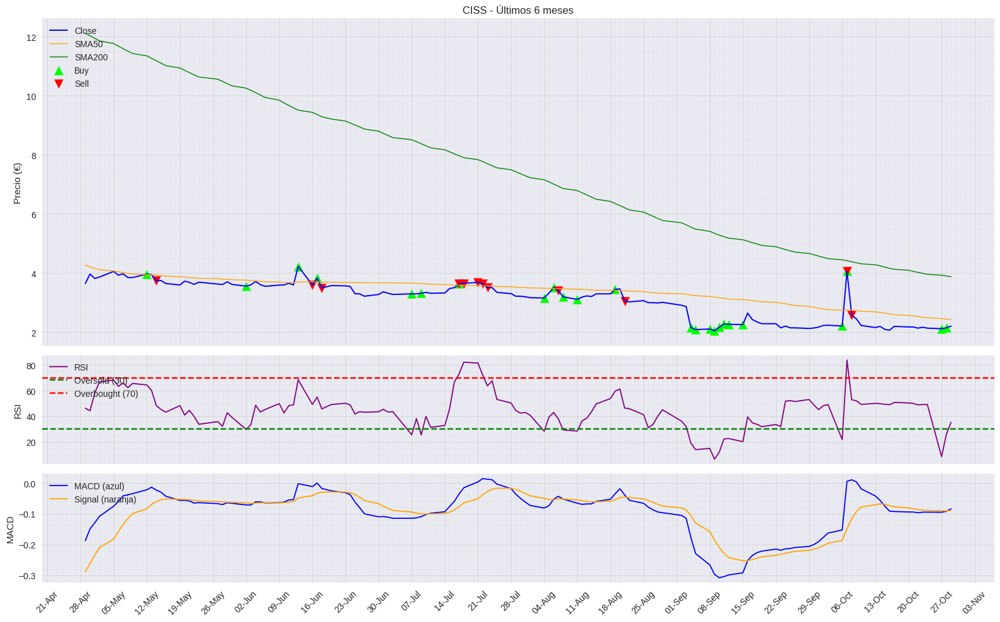


📈 Generando gráficas para último mes...


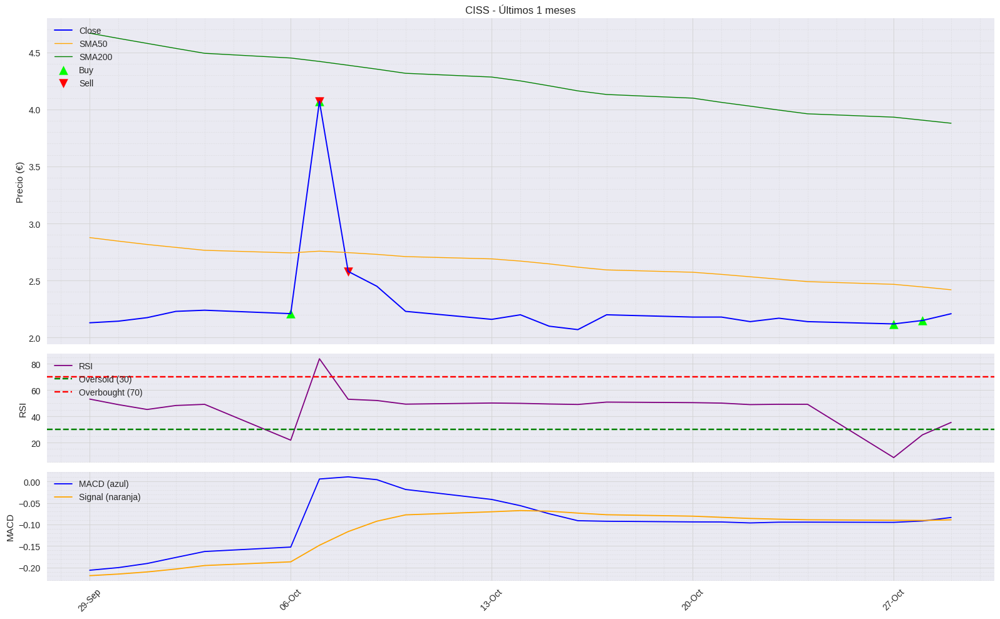


===== Resumen =====
Última Buy: 2025-10-28 a 2.150
 - Stop: 2.086, Take Profit: 2.365
Última Sell: 2025-10-08 a 2.580


In [ ]:
import yfinance as yf
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.dates import DateFormatter, DayLocator, WeekdayLocator, MonthLocator

# ======================
# Funciones de indicadores
# ======================
def calculate_indicators(df):
    df['SMA50'] = df['Close'].rolling(window=50).mean()
    df['SMA200'] = df['Close'].rolling(window=200).mean()
    df['RSI'] = compute_rsi(df['Close'], 14)
    df['EMA12'] = df['Close'].ewm(span=12, adjust=False).mean()
    df['EMA26'] = df['Close'].ewm(span=26, adjust=False).mean()
    df['MACD'] = df['EMA12'] - df['EMA26']
    df['MACD_signal'] = df['MACD'].ewm(span=9, adjust=False).mean()
    return df

def compute_rsi(series, period):
    delta = series.diff()
    gain = delta.where(delta > 0, 0.0)
    loss = -delta.where(delta < 0, 0.0)
    avg_gain = gain.rolling(window=period).mean()
    avg_loss = loss.rolling(window=period).mean()
    rs = avg_gain / avg_loss
    rsi = 100 - (100 / (1 + rs))
    return rsi.fillna(0)

# ======================
# Detección de señales
# ======================
def detect_signals(df):
    buy_signals = []
    sell_signals = []
    signals = []

    for i in range(1, len(df)):
        row = df.iloc[i]
        prev = df.iloc[i - 1]
        signal_text = ""

        if row['RSI'] < 30:
            signal_text += "Buy:RSI_OVERSOLD"
            buy_signals.append(row.name)
        if row['RSI'] > 70:
            signal_text += "Sell:RSI_OVERBOUGHT"
            sell_signals.append(row.name)
        if prev['Close'] < prev['SMA50'] and row['Close'] > row['SMA50']:
            signal_text += "|Buy_SMA50"
            buy_signals.append(row.name)
        if prev['Close'] > prev['SMA50'] and row['Close'] < row['SMA50']:
            signal_text += "|Sell_SMA50"
            sell_signals.append(row.name)

        signals.append(signal_text.strip('|'))

    df = df.iloc[1:].copy()
    df['Signal'] = signals
    return df, buy_signals, sell_signals

# ======================
# Gráficas
# ======================
def plot_graphs(df, buys, sells, months, symbol):
    inicio = df.index.max() - pd.DateOffset(months=months)
    df_plot = df[df.index >= inicio]
    buys_plot = [b for b in buys if b >= inicio]
    sells_plot = [s for s in sells if s >= inicio]

    fig, axs = plt.subplots(3, 1, figsize=(16, 10), sharex=True, gridspec_kw={'height_ratios': [3, 1, 1]})

    # ===== Precio =====
    axs[0].plot(df_plot.index, df_plot['Close'], label='Close', color='blue', linewidth=1.4)
    axs[0].plot(df_plot.index, df_plot['SMA50'], label='SMA50', color='orange', linewidth=1)
    axs[0].plot(df_plot.index, df_plot['SMA200'], label='SMA200', color='green', linewidth=1)
    axs[0].scatter(buys_plot, df_plot.loc[buys_plot, 'Close'], marker='^', color='lime', s=100, label='Buy')
    axs[0].scatter(sells_plot, df_plot.loc[sells_plot, 'Close'], marker='v', color='red', s=100, label='Sell')
    axs[0].legend(loc='upper left')
    axs[0].set_ylabel('Precio (€)')
    axs[0].set_title(f"{symbol} - Últimos {months} meses")

    # cuadrícula densa
    axs[0].grid(which='major', linestyle='-', linewidth=0.8, color='lightgray', alpha=0.8)
    axs[0].grid(which='minor', linestyle='--', linewidth=0.5, color='lightgray', alpha=0.5)
    axs[0].minorticks_on()

    # ===== RSI =====
    axs[1].plot(df_plot.index, df_plot['RSI'], label='RSI', color='purple', linewidth=1.3)
    axs[1].axhline(30, color='green', linestyle='--', label='Oversold (30)')
    axs[1].axhline(70, color='red', linestyle='--', label='Overbought (70)')
    axs[1].legend(loc='upper left')
    axs[1].set_ylabel('RSI')
    axs[1].grid(which='major', linestyle='-', linewidth=0.8, color='lightgray', alpha=0.8)
    axs[1].grid(which='minor', linestyle='--', linewidth=0.5, color='lightgray', alpha=0.5)
    axs[1].minorticks_on()

    # ===== MACD =====
    axs[2].plot(df_plot.index, df_plot['MACD'], label='MACD (azul)', color='blue', linewidth=1.3)
    axs[2].plot(df_plot.index, df_plot['MACD_signal'], label='Signal (naranja)', color='orange', linewidth=1.3)
    axs[2].legend(loc='upper left')
    axs[2].set_ylabel('MACD')
    axs[2].grid(which='major', linestyle='-', linewidth=0.8, color='lightgray', alpha=0.8)
    axs[2].grid(which='minor', linestyle='--', linewidth=0.5, color='lightgray', alpha=0.5)
    axs[2].minorticks_on()

    # Configuración del eje X
    axs[2].xaxis.set_major_locator(WeekdayLocator(byweekday=0, interval=1))
    axs[2].xaxis.set_minor_locator(DayLocator(interval=1))
    axs[2].xaxis.set_major_formatter(DateFormatter('%d-%b'))
    plt.xticks(rotation=45)

    plt.tight_layout()
    plt.show()

# ======================
# Main
# ======================
def main(symbol):
    print("🏁 INICIO DEL SCRIPT")
    print(f"✅ Descargando datos históricos para {symbol} ...")
    df = yf.download(symbol, period='10y', auto_adjust=True)

    # Arreglo de MultiIndex
    df.columns = [col[0] if isinstance(col, tuple) else col for col in df.columns]

    print(f"📊 Datos descargados: {df.shape[0]} filas. Columnas: {list(df.columns)}")

    df = calculate_indicators(df)
    print("➡️ Calculando indicadores... ✅ Indicadores calculados.")

    df, buys, sells = detect_signals(df)
    print(f"✅ Detección completada. Buy={len(buys)}, Sell={len(sells)}")

    print("\n📈 Generando gráficas para últimos 6 meses...")
    plot_graphs(df, buys, sells, months=6, symbol=symbol)

    print("\n📈 Generando gráficas para último mes...")
    plot_graphs(df, buys, sells, months=1, symbol=symbol)

    print("\n===== Resumen =====")
    if df['Signal'].str.contains('Buy').any():
        last_buy = df[df['Signal'].str.contains('Buy')].iloc[-1]
        print(f"Última Buy: {last_buy.name.date()} a {last_buy['Close']:.3f}")
        print(f" - Stop: {last_buy['Close']*0.97:.3f}, Take Profit: {last_buy['Close']*1.10:.3f}")
    if df['Signal'].str.contains('Sell').any():
        last_sell = df[df['Signal'].str.contains('Sell')].iloc[-1]
        print(f"Última Sell: {last_sell.name.date()} a {last_sell['Close']:.3f}")

    return df

# ======================
# Ejecución
# ======================
if __name__ == "__main__":
    df_result = main('CISS')


🏁 INICIO DEL SCRIPT
✅ Descargando datos históricos para DIA.MC ...


[*********************100%***********************]  1 of 1 completed


📊 Datos descargados: 2560 filas. Columnas: ['Close', 'High', 'Low', 'Open', 'Volume']
➡️ Calculando indicadores... ✅ Indicadores calculados.
✅ Detección completada. Buy=515, Sell=448

📈 Generando gráficas para últimos 6 meses...


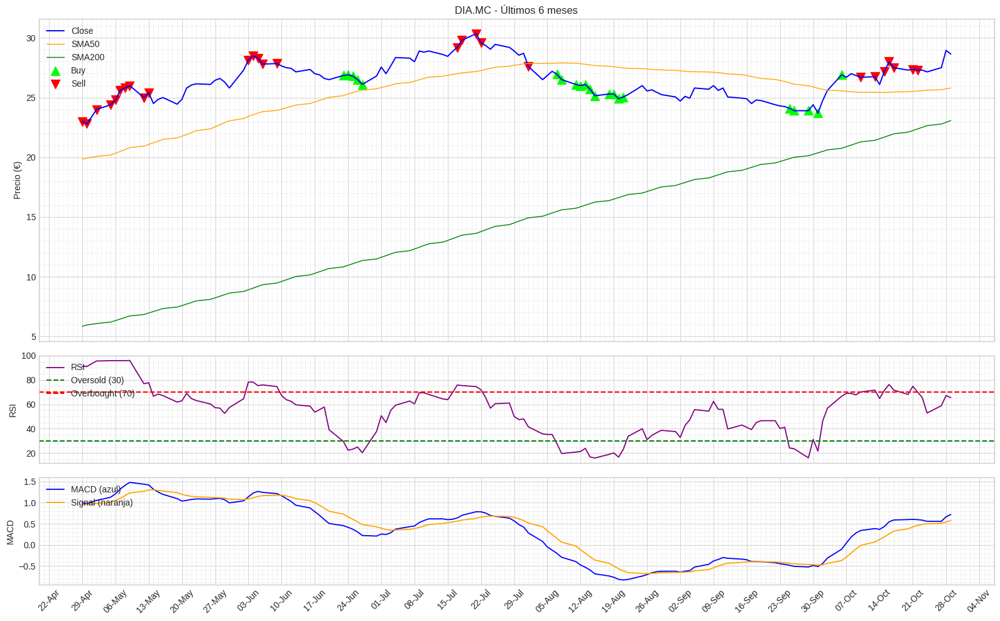


📈 Generando gráficas para último mes...


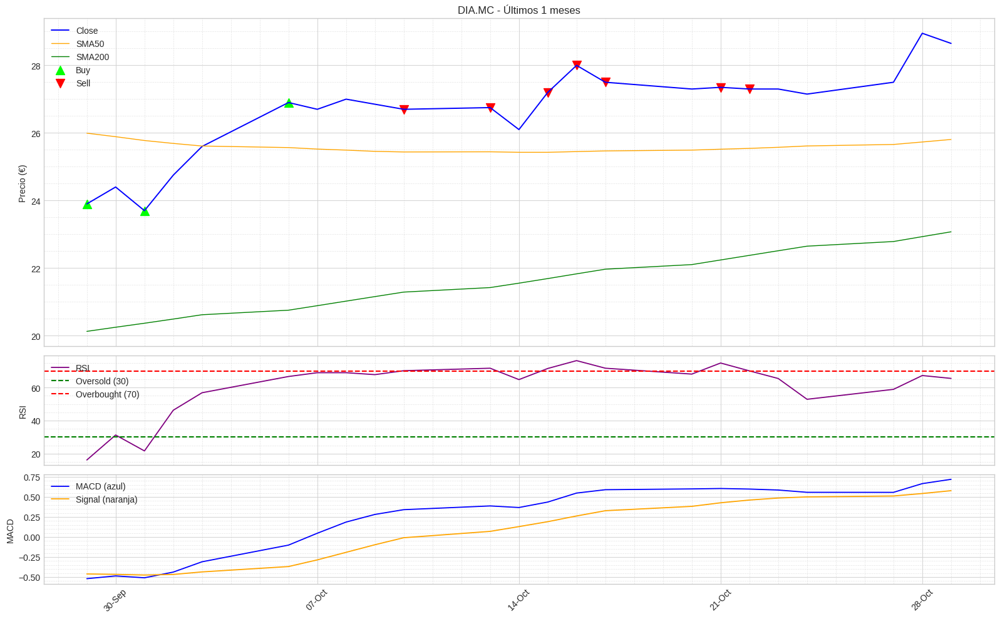


===== Resumen =====
Última Buy: 2025-10-06 a 26.900
 - Stop: 26.093, Take Profit: 29.590
Última Sell: 2025-10-22 a 27.300


In [ ]:
import yfinance as yf
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.dates import DateFormatter, DayLocator, WeekdayLocator

# ======================
# Funciones de indicadores
# ======================
def calculate_indicators(df):
    df['SMA50'] = df['Close'].rolling(window=50).mean()
    df['SMA200'] = df['Close'].rolling(window=200).mean()
    df['RSI'] = compute_rsi(df['Close'], 14)
    df['EMA12'] = df['Close'].ewm(span=12, adjust=False).mean()
    df['EMA26'] = df['Close'].ewm(span=26, adjust=False).mean()
    df['MACD'] = df['EMA12'] - df['EMA26']
    df['MACD_signal'] = df['MACD'].ewm(span=9, adjust=False).mean()
    return df

def compute_rsi(series, period):
    delta = series.diff()
    gain = delta.where(delta > 0, 0.0)
    loss = -delta.where(delta < 0, 0.0)
    avg_gain = gain.rolling(window=period).mean()
    avg_loss = loss.rolling(window=period).mean()
    rs = avg_gain / avg_loss
    rsi = 100 - (100 / (1 + rs))
    return rsi.fillna(0)

# ======================
# Detección de señales
# ======================
def detect_signals(df):
    buy_signals = []
    sell_signals = []
    signals = []

    for i in range(1, len(df)):
        row = df.iloc[i]
        prev = df.iloc[i - 1]
        signal_text = ""

        if row['RSI'] < 30:
            signal_text += "Buy:RSI_OVERSOLD"
            buy_signals.append(row.name)
        if row['RSI'] > 70:
            signal_text += "Sell:RSI_OVERBOUGHT"
            sell_signals.append(row.name)
        if prev['Close'] < prev['SMA50'] and row['Close'] > row['SMA50']:
            signal_text += "|Buy_SMA50"
            buy_signals.append(row.name)
        if prev['Close'] > prev['SMA50'] and row['Close'] < row['SMA50']:
            signal_text += "|Sell_SMA50"
            sell_signals.append(row.name)

        signals.append(signal_text.strip('|'))

    df = df.iloc[1:].copy()
    df['Signal'] = signals
    return df, buy_signals, sell_signals

# ======================
# Gráficas
# ======================
def plot_graphs(df, buys, sells, months, symbol):
    if df.empty:
        print("⚠️ No hay datos para graficar.")
        return

    inicio = df.index.max() - pd.DateOffset(months=months)
    df_plot = df[df.index >= inicio]
    buys_plot = [b for b in buys if b >= inicio]
    sells_plot = [s for s in sells if s >= inicio]

    fig, axs = plt.subplots(3, 1, figsize=(16, 10), sharex=True, gridspec_kw={'height_ratios': [3, 1, 1]})

    # ===== Precio =====
    axs[0].plot(df_plot.index, df_plot['Close'], label='Close', color='blue', linewidth=1.4)
    axs[0].plot(df_plot.index, df_plot['SMA50'], label='SMA50', color='orange', linewidth=1)
    axs[0].plot(df_plot.index, df_plot['SMA200'], label='SMA200', color='green', linewidth=1)
    axs[0].scatter(buys_plot, df_plot.loc[buys_plot, 'Close'], marker='^', color='lime', s=100, label='Buy')
    axs[0].scatter(sells_plot, df_plot.loc[sells_plot, 'Close'], marker='v', color='red', s=100, label='Sell')
    axs[0].legend(loc='upper left')
    axs[0].set_ylabel('Precio (€)')
    axs[0].set_title(f"{symbol} - Últimos {months} meses")

    # Cuadrícula milimétrica
    axs[0].grid(which='major', linestyle='-', linewidth=0.8, color='lightgray', alpha=0.9)
    axs[0].grid(which='minor', linestyle='--', linewidth=0.5, color='lightgray', alpha=0.6)
    axs[0].minorticks_on()

    # ===== RSI =====
    axs[1].plot(df_plot.index, df_plot['RSI'], label='RSI', color='purple', linewidth=1.3)
    axs[1].axhline(30, color='green', linestyle='--', label='Oversold (30)')
    axs[1].axhline(70, color='red', linestyle='--', label='Overbought (70)')
    axs[1].legend(loc='upper left')
    axs[1].set_ylabel('RSI')
    axs[1].grid(which='major', linestyle='-', linewidth=0.8, color='lightgray', alpha=0.9)
    axs[1].grid(which='minor', linestyle='--', linewidth=0.5, color='lightgray', alpha=0.6)
    axs[1].minorticks_on()

    # ===== MACD =====
    axs[2].plot(df_plot.index, df_plot['MACD'], label='MACD (azul)', color='blue', linewidth=1.3)
    axs[2].plot(df_plot.index, df_plot['MACD_signal'], label='Signal (naranja)', color='orange', linewidth=1.3)
    axs[2].legend(loc='upper left')
    axs[2].set_ylabel('MACD')
    axs[2].grid(which='major', linestyle='-', linewidth=0.8, color='lightgray', alpha=0.9)
    axs[2].grid(which='minor', linestyle='--', linewidth=0.5, color='lightgray', alpha=0.6)
    axs[2].minorticks_on()

    # Eje X milimétrico
    axs[2].xaxis.set_major_locator(WeekdayLocator(interval=1))
    axs[2].xaxis.set_minor_locator(DayLocator(interval=1))
    axs[2].xaxis.set_major_formatter(DateFormatter('%d-%b'))
    plt.xticks(rotation=45)

    plt.tight_layout()
    plt.show()

# ======================
# Main
# ======================
def main(symbol):
    print("🏁 INICIO DEL SCRIPT")
    print(f"✅ Descargando datos históricos para {symbol} ...")
    df = yf.download(symbol, period='10y', auto_adjust=True, progress=True)

    # Arreglo de MultiIndex
    df.columns = [col[0] if isinstance(col, tuple) else col for col in df.columns]

    if df.empty:
        print("❌ No se pudieron descargar datos. Intenta más tarde o revisa tu conexión.")
        return pd.DataFrame()

    print(f"📊 Datos descargados: {df.shape[0]} filas. Columnas: {list(df.columns)}")

    df = calculate_indicators(df)
    print("➡️ Calculando indicadores... ✅ Indicadores calculados.")

    df, buys, sells = detect_signals(df)
    print(f"✅ Detección completada. Buy={len(buys)}, Sell={len(sells)}")

    print("\n📈 Generando gráficas para últimos 6 meses...")
    plot_graphs(df, buys, sells, months=6, symbol=symbol)

    print("\n📈 Generando gráficas para último mes...")
    plot_graphs(df, buys, sells, months=1, symbol=symbol)

    print("\n===== Resumen =====")
    if 'Signal' in df.columns and not df.empty:
        if df['Signal'].astype(str).str.contains('Buy').any():
            last_buy = df[df['Signal'].astype(str).str.contains('Buy')].iloc[-1]
            print(f"Última Buy: {last_buy.name.date()} a {last_buy['Close']:.3f}")
            print(f" - Stop: {last_buy['Close']*0.97:.3f}, Take Profit: {last_buy['Close']*1.10:.3f}")
        if df['Signal'].astype(str).str.contains('Sell').any():
            last_sell = df[df['Signal'].astype(str).str.contains('Sell')].iloc[-1]
            print(f"Última Sell: {last_sell.name.date()} a {last_sell['Close']:.3f}")

    return df

# ======================
# Ejecución
# ======================
if __name__ == "__main__":
    df_result = main('DIA.MC')


🏁 INICIO DEL SCRIPT
✅ Descargando datos históricos para ADX.MC ...


/tmp/ipython-input-1674700103.py:92: FutureWarning: YF.download() has changed argument auto_adjust default to True
  df = yf.download(symbol, period=period)[["Open", "High", "Low", "Close", "Volume"]]
[*********************100%***********************]  1 of 1 completed


📊 Datos descargados: 2560 filas. Columnas: ['Open', 'High', 'Low', 'Close', 'Volume']
➡️ Calculando indicadores...
✅ Indicadores calculados.
➡️ Detectando señales...
✅ Detección completada. Buy=2, Sell=4

===== Resumen =====
Última Buy: 2024-01-05 a 1.285
 - Stop: 1.246, Take Profit: 1.413
Última Sell: 2023-10-30 a 1.038

📈 Generando gráficas para últimos 6 meses...



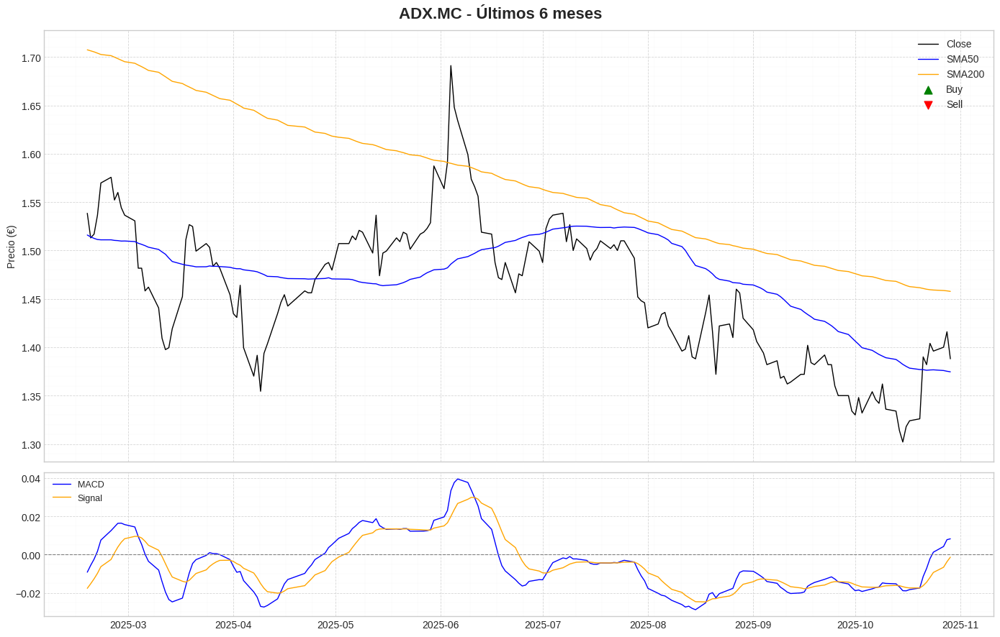


📈 Generando gráficas para último mes...



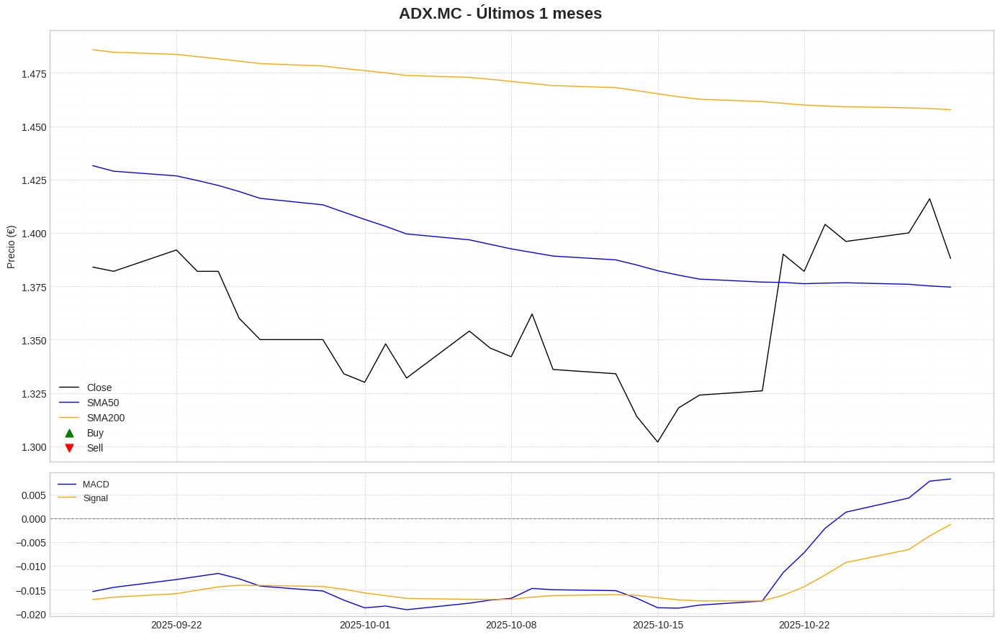

In [ ]:
import yfinance as yf
import pandas as pd
import numpy as np
import talib as ta
import matplotlib.pyplot as plt

plt.style.use("seaborn-v0_8-whitegrid")

# =========================================
# FUNCIONES AUXILIARES
# =========================================
def detectar_senales(df):
    """
    Detecta señales de compra/venta basadas en cruces de medias y condiciones RSI/MACD.
    """
    df["Buy"] = False
    df["Sell"] = False

    for i in range(1, len(df)):
        row = df.iloc[i]
        prev = df.iloc[i - 1]

        close = float(row["Close"])
        sma50 = float(row["SMA50"])
        sma200 = float(row["SMA200"])
        rsi = float(row["RSI"])
        macd = float(row["MACD"])
        macd_signal = float(row["MACD_signal"])

        prev_close = float(prev["Close"])
        prev_sma50 = float(prev["SMA50"])
        prev_sma200 = float(prev["SMA200"])
        prev_rsi = float(prev["RSI"])
        prev_macd = float(prev["MACD"])
        prev_macd_signal = float(prev["MACD_signal"])

        # Señal de compra
        if (prev_sma50 < prev_sma200 and sma50 > sma200) and (rsi < 70) and (macd > macd_signal):
            df.loc[df.index[i], "Buy"] = True

        # Señal de venta
        if (prev_sma50 > prev_sma200 and sma50 < sma200) and (rsi > 30) and (macd < macd_signal):
            df.loc[df.index[i], "Sell"] = True

    return df


def graficar(df, symbol, meses=6):
    """
    Genera gráficas para los últimos X meses y el MACD con cuadrícula milimétrica.
    """
    periodo = meses * 30
    df_periodo = df.tail(periodo)

    fig, axs = plt.subplots(2, 1, figsize=(14, 9), sharex=True, gridspec_kw={"height_ratios": [3, 1]})
    fig.suptitle(f"{symbol} - Últimos {meses} meses", fontsize=16, fontweight="bold")

    # --- Gráfico principal ---
    axs[0].plot(df_periodo.index, df_periodo["Close"], label="Close", color="black", linewidth=1)
    axs[0].plot(df_periodo.index, df_periodo["SMA50"], label="SMA50", color="blue", linewidth=1)
    axs[0].plot(df_periodo.index, df_periodo["SMA200"], label="SMA200", color="orange", linewidth=1)
    axs[0].scatter(df_periodo.index[df_periodo["Buy"]], df_periodo["Close"][df_periodo["Buy"]],
                   marker="^", color="green", s=60, label="Buy")
    axs[0].scatter(df_periodo.index[df_periodo["Sell"]], df_periodo["Close"][df_periodo["Sell"]],
                   marker="v", color="red", s=60, label="Sell")
    axs[0].legend()
    axs[0].set_ylabel("Precio (€)")
    axs[0].grid(True, which="major", linestyle="--", linewidth=0.6, alpha=0.8)
    axs[0].grid(True, which="minor", linestyle=":", linewidth=0.3, alpha=0.4)
    axs[0].minorticks_on()

    # --- MACD ---
    axs[1].plot(df_periodo.index, df_periodo["MACD"], label="MACD", color="blue", linewidth=1)
    axs[1].plot(df_periodo.index, df_periodo["MACD_signal"], label="Signal", color="orange", linewidth=1)
    axs[1].axhline(0, color="gray", linestyle="--", linewidth=0.8)
    axs[1].legend(loc="upper left", fontsize=9)
    axs[1].grid(True, which="major", linestyle="--", linewidth=0.6, alpha=0.8)
    axs[1].grid(True, which="minor", linestyle=":", linewidth=0.3, alpha=0.4)
    axs[1].minorticks_on()

    plt.tight_layout()
    plt.show()


# =========================================
# FUNCIÓN PRINCIPAL
# =========================================
def main(symbol="CISS", period="10y"):
    print("🏁 INICIO DEL SCRIPT")
    print(f"✅ Descargando datos históricos para {symbol} ...")

    df = yf.download(symbol, period=period)[["Open", "High", "Low", "Close", "Volume"]]

    # 🔧 Aplanar columnas (por si yfinance devuelve MultiIndex)
    if isinstance(df.columns, pd.MultiIndex):
        df.columns = df.columns.get_level_values(0)

    print(f"📊 Datos descargados: {len(df)} filas. Columnas: {list(df.columns)}")

    # Calcular indicadores
    print("➡️ Calculando indicadores...")
    df["SMA50"] = ta.SMA(df["Close"], timeperiod=50)
    df["SMA200"] = ta.SMA(df["Close"], timeperiod=200)
    df["RSI"] = ta.RSI(df["Close"], timeperiod=14)
    df["MACD"], df["MACD_signal"], _ = ta.MACD(df["Close"], fastperiod=12, slowperiod=26, signalperiod=9)
    print("✅ Indicadores calculados.")

    # Detección de señales
    print("➡️ Detectando señales...")
    df = detectar_senales(df)
    total_buys = df["Buy"].sum()
    total_sells = df["Sell"].sum()
    print(f"✅ Detección completada. Buy={total_buys}, Sell={total_sells}\n")

    # Mostrar resumen
    last_buy = df[df["Buy"]].iloc[-1] if total_buys > 0 else None
    last_sell = df[df["Sell"]].iloc[-1] if total_sells > 0 else None

    print("===== Resumen =====")
    if last_buy is not None:
        close = float(last_buy["Close"])
        print(f"Última Buy: {last_buy.name.date()} a {close:.3f}")
        print(f" - Stop: {close*0.97:.3f}, Take Profit: {close*1.10:.3f}")
    if last_sell is not None:
        close = float(last_sell["Close"])
        print(f"Última Sell: {last_sell.name.date()} a {close:.3f}")

    # Gráficas
    print("\n📈 Generando gráficas para últimos 6 meses...\n")
    graficar(df, symbol, meses=6)
    print("\n📈 Generando gráficas para último mes...\n")
    graficar(df, symbol, meses=1)

    return df


# ===========================
# EJECUCIÓN
# ===========================
if __name__ == "__main__":
    df_result = main("ADX.MC")


🏁 INICIO DEL SCRIPT
✅ Descargando datos históricos para BBVA.MC ...


/tmp/ipython-input-435877019.py:95: FutureWarning: YF.download() has changed argument auto_adjust default to True
  df = yf.download(symbol, period=period)[["Open", "High", "Low", "Close", "Volume"]]
[*********************100%***********************]  1 of 1 completed


📊 Datos descargados: 2560 filas. Columnas: ['Open', 'High', 'Low', 'Close', 'Volume']
➡️ Calculando indicadores...
✅ Indicadores calculados.
➡️ Detectando señales...
✅ Detección completada. Buy=4, Sell=2

===== Resumen =====
Última Buy: 2022-10-31 a 4.374
 - Stop: 4.243, Take Profit: 4.812
Última Sell: 2022-01-24 a 4.252

📈 Generando gráficas para últimos 6 meses...



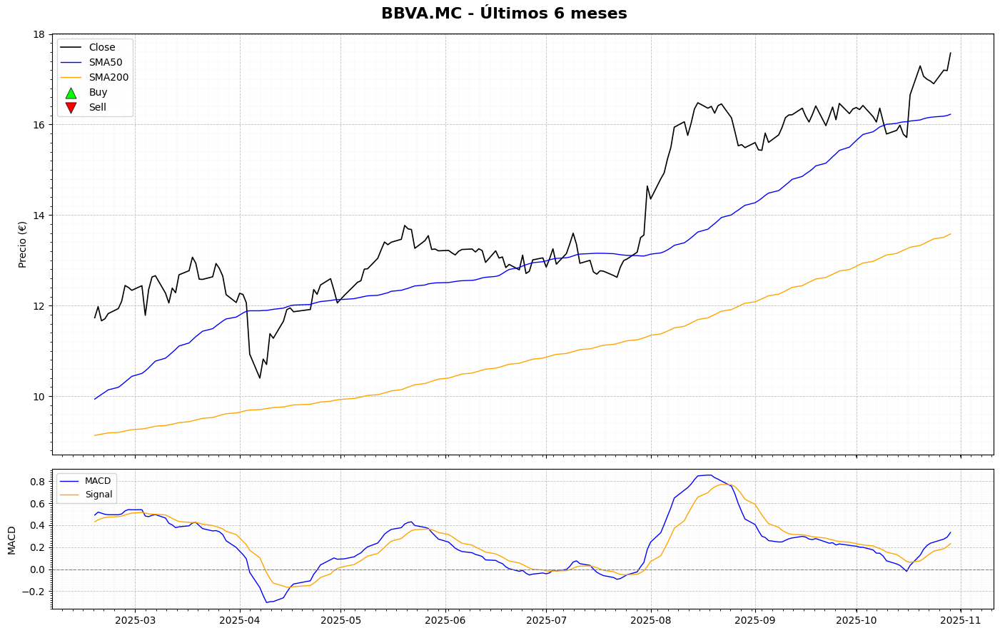


📈 Generando gráficas para último mes...



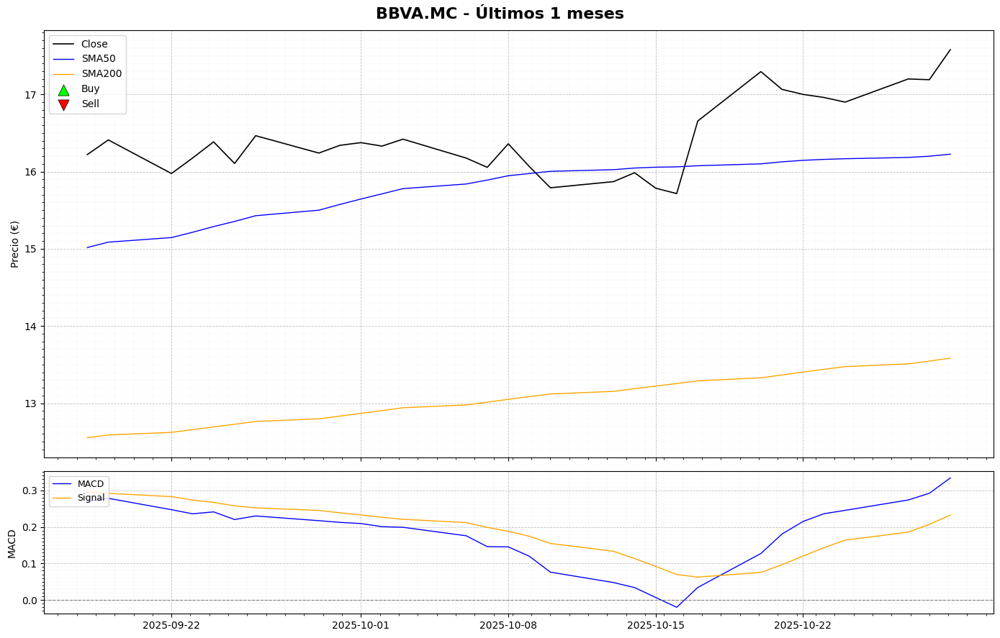

In [ ]:
import yfinance as yf
import pandas as pd
import numpy as np
import talib as ta
import matplotlib.pyplot as plt
from matplotlib.ticker import AutoMinorLocator

plt.style.use("default")

# =========================================
# FUNCIONES AUXILIARES
# =========================================
def detectar_senales(df):
    df["Buy"] = False
    df["Sell"] = False

    for i in range(1, len(df)):
        row = df.iloc[i]
        prev = df.iloc[i - 1]

        close = float(row["Close"])
        sma50 = float(row["SMA50"])
        sma200 = float(row["SMA200"])
        rsi = float(row["RSI"])
        macd = float(row["MACD"])
        macd_signal = float(row["MACD_signal"])

        prev_sma50 = float(prev["SMA50"])
        prev_sma200 = float(prev["SMA200"])
        prev_rsi = float(prev["RSI"])
        prev_macd = float(prev["MACD"])
        prev_macd_signal = float(prev["MACD_signal"])

        # Señal de compra
        if (prev_sma50 < prev_sma200 and sma50 > sma200) and (rsi < 70) and (macd > macd_signal):
            df.loc[df.index[i], "Buy"] = True

        # Señal de venta
        if (prev_sma50 > prev_sma200 and sma50 < sma200) and (rsi > 30) and (macd < macd_signal):
            df.loc[df.index[i], "Sell"] = True

    return df


def graficar(df, symbol, meses=6):
    periodo = meses * 30
    df_periodo = df.tail(periodo)

    fig, axs = plt.subplots(2, 1, figsize=(14, 9), sharex=True, gridspec_kw={"height_ratios": [3, 1]})
    fig.suptitle(f"{symbol} - Últimos {meses} meses", fontsize=16, fontweight="bold")

    # --- Gráfico principal ---
    axs[0].plot(df_periodo.index, df_periodo["Close"], label="Close", color="black", linewidth=1.2)
    axs[0].plot(df_periodo.index, df_periodo["SMA50"], label="SMA50", color="blue", linewidth=1)
    axs[0].plot(df_periodo.index, df_periodo["SMA200"], label="SMA200", color="orange", linewidth=1)

    # Señales más visibles
    axs[0].scatter(df_periodo.index[df_periodo["Buy"]], df_periodo["Close"][df_periodo["Buy"]],
                   marker="^", color="lime", s=120, edgecolor="black", linewidth=0.5, zorder=5, label="Buy")
    axs[0].scatter(df_periodo.index[df_periodo["Sell"]], df_periodo["Close"][df_periodo["Sell"]],
                   marker="v", color="red", s=120, edgecolor="black", linewidth=0.5, zorder=5, label="Sell")

    axs[0].legend()
    axs[0].set_ylabel("Precio (€)")

    # Cuadrícula milimétrica
    axs[0].grid(True, which="major", linestyle="--", linewidth=0.6, alpha=0.8)
    axs[0].grid(True, which="minor", linestyle=":", linewidth=0.3, alpha=0.4)
    axs[0].xaxis.set_minor_locator(AutoMinorLocator(10))
    axs[0].yaxis.set_minor_locator(AutoMinorLocator(10))

    # --- MACD ---
    axs[1].plot(df_periodo.index, df_periodo["MACD"], label="MACD", color="blue", linewidth=1)
    axs[1].plot(df_periodo.index, df_periodo["MACD_signal"], label="Signal", color="orange", linewidth=1)
    axs[1].axhline(0, color="gray", linestyle="--", linewidth=0.8)
    axs[1].legend(loc="upper left", fontsize=9)
    axs[1].set_ylabel("MACD")

    axs[1].grid(True, which="major", linestyle="--", linewidth=0.6, alpha=0.8)
    axs[1].grid(True, which="minor", linestyle=":", linewidth=0.3, alpha=0.4)
    axs[1].xaxis.set_minor_locator(AutoMinorLocator(10))
    axs[1].yaxis.set_minor_locator(AutoMinorLocator(10))

    plt.tight_layout()
    plt.show()


# =========================================
# FUNCIÓN PRINCIPAL
# =========================================
def main(symbol="CISS", period="10y"):
    print("🏁 INICIO DEL SCRIPT")
    print(f"✅ Descargando datos históricos para {symbol} ...")

    df = yf.download(symbol, period=period)[["Open", "High", "Low", "Close", "Volume"]]

    # Aplanar columnas
    if isinstance(df.columns, pd.MultiIndex):
        df.columns = df.columns.get_level_values(0)

    print(f"📊 Datos descargados: {len(df)} filas. Columnas: {list(df.columns)}")

    # Calcular indicadores
    print("➡️ Calculando indicadores...")
    df["SMA50"] = ta.SMA(df["Close"], timeperiod=50)
    df["SMA200"] = ta.SMA(df["Close"], timeperiod=200)
    df["RSI"] = ta.RSI(df["Close"], timeperiod=14)
    df["MACD"], df["MACD_signal"], _ = ta.MACD(df["Close"], fastperiod=12, slowperiod=26, signalperiod=9)
    print("✅ Indicadores calculados.")

    # Detección de señales
    print("➡️ Detectando señales...")
    df = detectar_senales(df)
    total_buys = df["Buy"].sum()
    total_sells = df["Sell"].sum()
    print(f"✅ Detección completada. Buy={total_buys}, Sell={total_sells}\n")

    # Resumen
    print("===== Resumen =====")
    if total_buys > 0:
        last_buy = df[df["Buy"]].iloc[-1]
        close = float(last_buy["Close"])
        print(f"Última Buy: {last_buy.name.date()} a {close:.3f}")
        print(f" - Stop: {close*0.97:.3f}, Take Profit: {close*1.10:.3f}")
    if total_sells > 0:
        last_sell = df[df["Sell"]].iloc[-1]
        close = float(last_sell["Close"])
        print(f"Última Sell: {last_sell.name.date()} a {close:.3f}")

    # Gráficas
    print("\n📈 Generando gráficas para últimos 6 meses...\n")
    graficar(df, symbol, meses=6)
    print("\n📈 Generando gráficas para último mes...\n")
    graficar(df, symbol, meses=1)

    return df


# ===========================
if __name__ == "__main__":
    df_result = main("BBVA.MC")


In [8]:
# Script diagnóstico y corregido — indicadores + señales + gráficos
!pip install ta-lib

import yfinance as yf
import pandas as pd
import numpy as np
import talib as ta
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
from matplotlib.ticker import AutoMinorLocator
from pandas.tseries.offsets import MonthEnd

plt.rcParams.update({'figure.max_open_warning': 0})
plt.style.use('default')

# -----------------------------
# CONFIG
# -----------------------------
SYMBOL = "BBVA.MC"       # Cambia aquí
PERIOD = "10y"           # datos históricos
STOP_PCT = 0.97
TP_PCT = 1.10

# -----------------------------
# DESCARGA Y PREPARACIÓN
# -----------------------------
def download_and_prepare(symbol, period=PERIOD):
    print(f"✅ Descargando datos históricos para {symbol} ...")
    df = yf.download(symbol, period=period)[["Open","High","Low","Close","Volume"]]
    # Aplanar columnas si vienen con MultiIndex (ej Yahoo con ticker multi-col)
    if isinstance(df.columns, pd.MultiIndex):
        df.columns = df.columns.get_level_values(0)
    df.index = pd.to_datetime(df.index)
    print(f"📊 Datos descargados: {len(df)} filas. Columnas: {list(df.columns)}")
    return df

# -----------------------------
# INDICADORES
# -----------------------------
def calculate_indicators(df):
    print("➡️ Calculando indicadores (SMA50, SMA200, RSI, MACD)...")
    df = df.copy()
    df['SMA50'] = ta.SMA(df['Close'].values, timeperiod=50)
    df['SMA200'] = ta.SMA(df['Close'].values, timeperiod=200)
    df['RSI'] = ta.RSI(df['Close'].values, timeperiod=14)
    macd, macd_signal, macd_hist = ta.MACD(df['Close'].values, fastperiod=12, slowperiod=26, signalperiod=9)
    df['MACD'] = macd
    df['MACD_signal'] = macd_signal
    df['MACD_hist'] = macd_hist
    # Vol MA para info
    df['VolMA20'] = df['Volume'].rolling(20).mean()
    print("✅ Indicadores calculados.")
    return df

# -----------------------------
# DETECCIÓN DE SEÑALES (verbose & motivos)
# -----------------------------
def detect_signals_verbose(df):
    print("➡️ Detectando señales (pullbacks, cruces SMA, MACD, RSI)...")
    df = df.copy()
    df['Signal'] = ''
    buys = []
    sells = []
    reasons_count = {}

    def add_reason(counter, reason):
        counter[reason] = counter.get(reason, 0) + 1

    for i in range(1, len(df)):
        date = df.index[i]
        row = df.iloc[i]
        prev = df.iloc[i-1]

        reasons_buy = []
        reasons_sell = []

        # Pullback: si el cierre anterior estaba por debajo de SMA y ahora el cierre sube respecto al anterior
        try:
            if pd.notna(prev['SMA50']):
                if (prev['Close'] <= prev['SMA50']) and (row['Close'] > prev['Close']):
                    reasons_buy.append('Pullback_SMA50')
            if pd.notna(prev['SMA200']):
                if (prev['Close'] <= prev['SMA200']) and (row['Close'] > prev['Close']):
                    reasons_buy.append('Pullback_SMA200')
        except Exception as e:
            # nunca parar por un error en una fila; solo lo mostramos
            print(f"⚠️ Pullback error en fila {i} ({date.date()}): {e}")

        # SMA cross (golden/death)
        if pd.notna(prev['SMA50']) and pd.notna(prev['SMA200']) and pd.notna(row['SMA50']) and pd.notna(row['SMA200']):
            if (prev['SMA50'] <= prev['SMA200']) and (row['SMA50'] > row['SMA200']):
                reasons_buy.append('GoldenCross')
            if (prev['SMA50'] >= prev['SMA200']) and (row['SMA50'] < row['SMA200']):
                reasons_sell.append('DeathCross')

        # MACD cross
        if pd.notna(prev['MACD']) and pd.notna(prev['MACD_signal']) and pd.notna(row['MACD']) and pd.notna(row['MACD_signal']):
            if (prev['MACD'] <= prev['MACD_signal']) and (row['MACD'] > row['MACD_signal']):
                reasons_buy.append('MACD_CrossUp')
            if (prev['MACD'] >= prev['MACD_signal']) and (row['MACD'] < row['MACD_signal']):
                reasons_sell.append('MACD_CrossDown')

        # RSI extremes
        if pd.notna(row['RSI']):
            if row['RSI'] < 30:
                reasons_buy.append('RSI_OVERSOLD')
            if row['RSI'] > 70:
                reasons_sell.append('RSI_OVERBOUGHT')

        # Decide
        if reasons_buy and not reasons_sell:
            sig = 'Buy:' + '|'.join(reasons_buy)
            df.at[date, 'Signal'] = sig
            buys.append(date)
            for r in reasons_buy: add_reason(reasons_count, r)
        elif reasons_sell and not reasons_buy:
            sig = 'Sell:' + '|'.join(reasons_sell)
            df.at[date, 'Signal'] = sig
            sells.append(date)
            for r in reasons_sell: add_reason(reasons_count, r)
        elif reasons_buy and reasons_sell:
            sig = 'Mix:' + '|'.join(reasons_buy + reasons_sell)
            df.at[date, 'Signal'] = sig
            # count both
            for r in (reasons_buy + reasons_sell): add_reason(reasons_count, r)
        # else empty

    print("✅ Detección completada.")
    # resumen motivos
    print("🔎 Conteo de motivos (top):")
    for k,v in sorted(reasons_count.items(), key=lambda x: -x[1])[:20]:
        print(f"   {k}: {v}")
    return df, buys, sells

# -----------------------------
# IMPRESIÓN DE CONTROL (últimas filas con indicadores)
# -----------------------------
def print_debug_tail(df, n=8):
    cols = ['Close','SMA50','SMA200','RSI','MACD','MACD_signal','MACD_hist','Volume','VolMA20','Signal']
    cols_exist = [c for c in cols if c in df.columns]
    print("\n📋 Últimas filas con indicadores:")
    with pd.option_context('display.max_columns', None):
        print(df[cols_exist].tail(n))

# -----------------------------
# GRAFICADO (6m y 1m), ticks y cuadricula densa
# -----------------------------
def plot_with_grids(df, buys, sells, months=6, symbol=SYMBOL):
    ultimo = df.index.max()
    inicio = ultimo - MonthEnd(months)
    df_plot = df.loc[df.index >= inicio]
    if df_plot.empty:
        print(f"⚠️ No hay datos para los últimos {months} meses.")
        return

    # preparar figura
    fig, axs = plt.subplots(3,1, figsize=(14,10), sharex=True, gridspec_kw={'height_ratios':[3,1,1]})
    ax_price, ax_rsi, ax_macd = axs

    # PRICE + SMAs
    ax_price.plot(df_plot.index, df_plot['Close'], label='Close', linewidth=1.2, zorder=1)
    if 'SMA50' in df_plot: ax_price.plot(df_plot.index, df_plot['SMA50'], label='SMA50', linewidth=0.9)
    if 'SMA200' in df_plot: ax_price.plot(df_plot.index, df_plot['SMA200'], label='SMA200', linewidth=0.9)

    # buys/sells markers (más visibles)
    buys_plot = [b for b in buys if b >= inicio]
    sells_plot = [s for s in sells if s >= inicio]
    if buys_plot:
        ax_price.scatter(buys_plot, df_plot.loc[buys_plot,'Close'], marker='^', s=140,
                         facecolors='lime', edgecolors='black', linewidths=0.6, zorder=6, label='Buy')
    if sells_plot:
        ax_price.scatter(sells_plot, df_plot.loc[sells_plot,'Close'], marker='v', s=140,
                         facecolors='red', edgecolors='black', linewidths=0.6, zorder=6, label='Sell')

    ax_price.set_ylabel('Precio')
    ax_price.legend(loc='upper left')

    # cuadrícula milimétrica: major y minor con más subdivisiones
    ax_price.grid(True, which='major', linestyle='--', linewidth=0.6, alpha=0.8)
    ax_price.grid(True, which='minor', linestyle=':', linewidth=0.3, alpha=0.45)
    ax_price.xaxis.set_minor_locator(mdates.AutoDateLocator())
    ax_price.yaxis.set_minor_locator(AutoMinorLocator(10))

    # Volumen en segundo eje (opcional)
    ax2 = ax_price.twinx()
    ax2.bar(df_plot.index, df_plot['Volume'], alpha=0.12, width=1)
    if 'VolMA20' in df_plot:
        ax2.plot(df_plot.index, df_plot['VolMA20'], linestyle='--', linewidth=0.7)
    ax2.set_ylabel('Vol')

    # RSI subplot
    if 'RSI' in df_plot:
        ax_rsi.plot(df_plot.index, df_plot['RSI'], linewidth=1)
        ax_rsi.axhline(70, linestyle='--', alpha=0.6, color='red')
        ax_rsi.axhline(30, linestyle='--', alpha=0.6, color='green')
        ax_rsi.set_ylabel('RSI(14)')
        ax_rsi.grid(True, which='major', linestyle='--', linewidth=0.5, alpha=0.6)
        ax_rsi.grid(True, which='minor', linestyle=':', linewidth=0.25, alpha=0.35)
        ax_rsi.yaxis.set_minor_locator(AutoMinorLocator(10))

    # MACD subplot
    if 'MACD' in df_plot and 'MACD_signal' in df_plot:
        ax_macd.plot(df_plot.index, df_plot['MACD'], label='MACD', linewidth=1)
        ax_macd.plot(df_plot.index, df_plot['MACD_signal'], label='Signal', linewidth=1)
        ax_macd.bar(df_plot.index, df_plot.get('MACD_hist', np.zeros(len(df_plot))), alpha=0.5)
        ax_macd.axhline(0, color='gray', linestyle='--', linewidth=0.8)
        ax_macd.legend(loc='upper left')
        ax_macd.grid(True, which='major', linestyle='--', linewidth=0.5, alpha=0.6)
        ax_macd.grid(True, which='minor', linestyle=':', linewidth=0.25, alpha=0.35)
        ax_macd.yaxis.set_minor_locator(AutoMinorLocator(10))

    # formato eje X: mayor = semanas si months>=3, daily si months==1
    if months >= 3:
        locator = mdates.WeekdayLocator(byweekday=mdates.MO)   # ticks cada lunes
        fmt = mdates.DateFormatter('%Y-%m-%d')
    else:
        locator = mdates.DayLocator(interval=1)
        fmt = mdates.DateFormatter('%Y-%m-%d')

    ax_macd.xaxis.set_major_locator(locator)
    ax_macd.xaxis.set_major_formatter(fmt)
    ax_macd.xaxis.set_minor_locator(mdates.AutoDateLocator())
    plt.setp(ax_macd.xaxis.get_majorticklabels(), rotation=45, ha='right')

    plt.tight_layout()
    plt.show()

# -----------------------------
# MAIN
# -----------------------------
def main(symbol=SYMBOL, period=PERIOD):
    df = download_and_prepare(symbol, period)
    df = calculate_indicators(df)
    print_debug_tail(df, n=6)           # muestra últimas filas con indicadores
    df_signals, buys, sells = detect_signals_verbose(df)
    print_debug_tail(df_signals, n=6)   # mostrar con Signal

    print(f"\nSe encontraron {len(buys)} señales de compra y {len(sells)} señales de venta.")

    # mostrar últimas 10 señales (texto)
    signals_df = df_signals[df_signals['Signal'] != '']
    if not signals_df.empty:
        print("\n📊 Últimas 10 señales (texto):")
        with pd.option_context('display.max_colwidth', 120):
            print(signals_df[['Close','SMA50','SMA200','RSI','MACD','Signal']].tail(10))

    # Resumen última buy/sell (segura)
    last_buy = buys[-1] if buys else None
    last_sell = sells[-1] if sells else None
    print("\n===== Resumen =====")
    if last_buy is not None:
        last_buy_row = df_signals.loc[last_buy]
        price = float(last_buy_row['Close'])
        print(f"Última Buy: {last_buy.date()} a {price:.3f}")
        print(f" - Stop: {price*STOP_PCT:.3f}, Take Profit: {price*TP_PCT:.3f}")
    else:
        print("No hay Buy detectada en el histórico procesado.")

    if last_sell is not None:
        last_sell_row = df_signals.loc[last_sell]
        price = float(last_sell_row['Close'])
        print(f"Última Sell: {last_sell.date()} a {price:.3f}")
    else:
        print("No hay Sell detectada en el histórico procesado.")

    # Plotea 6 meses y 1 mes
    print("\n📈 Generando gráficas para últimos 6 meses...")
    plot_with_grids(df_signals, buys, sells, months=6, symbol=symbol)
    print("\n📈 Generando gráficas para último mes...")
    plot_with_grids(df_signals, buys, sells, months=1, symbol=symbol)

    return df_signals, buys, sells

# =========================
if __name__ == "__main__":
    df_result, buys, sells = main(SYMBOL, PERIOD)


✅ Descargando datos históricos para BBVA.MC ...


/tmp/ipython-input-3050196479.py:29: FutureWarning: YF.download() has changed argument auto_adjust default to True
  df = yf.download(symbol, period=period)[["Open","High","Low","Close","Volume"]]
[*********************100%***********************]  1 of 1 completed


📊 Datos descargados: 2560 filas. Columnas: ['Open', 'High', 'Low', 'Close', 'Volume']
➡️ Calculando indicadores (SMA50, SMA200, RSI, MACD)...
✅ Indicadores calculados.

📋 Últimas filas con indicadores:
Price           Close    SMA50     SMA200        RSI      MACD  MACD_signal  \
Date                                                                          
2025-10-23  16.959999  16.1581  13.438252  60.816704  0.236075     0.143319   
2025-10-24  16.900000  16.1665  13.472989  59.617431  0.245292     0.163714   
2025-10-27  17.200001  16.1833  13.508913  63.493774  0.273650     0.185701   
2025-10-28  17.190001  16.1991  13.545172  63.275734  0.291951     0.206951   
2025-10-29  17.580000  16.2257  13.583357  67.904721  0.334074     0.232375   
2025-10-30  17.184999  16.2411  13.619134  59.697314  0.331759     0.252252   

Price       MACD_hist    Volume     VolMA20  
Date                                         
2025-10-23   0.092756   4720528  7856816.40  
2025-10-24   0.081578   664

TypeError: plot_with_grids() missing 1 required positional argument: 'long_name'

/tmp/ipython-input-3438071057.py:27: FutureWarning: YF.download() has changed argument auto_adjust default to True
  df = yf.download(symbol, period=period)[["Open", "High", "Low", "Close", "Volume"]]
[*********************100%***********************]  1 of 1 completed

🏁 INICIO DEL SCRIPT
✅ Descargando datos históricos para CIRSA.MC ...
📊 Datos descargados: 82 filas. Columnas: ['Open', 'High', 'Low', 'Close', 'Volume']
➡️ Calculando indicadores (SMA50, SMA200, RSI, MACD)...
✅ Indicadores calculados.
➡️ Detectando señales...
✅ Detección completada. Buy=0, Sell=0

📋 Últimas filas del DataFrame:
            Close    SMA50  SMA200        RSI      MACD  MACD_signal Signal
Date                                                                       
2025-10-24  14.61  15.3612     NaN  36.207487 -0.202832    -0.166771    nan
2025-10-27  14.64  15.3480     NaN  37.223534 -0.208872    -0.175191    nan
2025-10-28  14.43  15.3332     NaN  33.233364 -0.227977    -0.185749    nan
2025-10-29  14.30  15.3212     NaN  31.016802 -0.250717    -0.198742    nan
2025-10-30  14.21  15.3056     NaN  29.547502 -0.272856    -0.213565    nan



ERROR:yfinance:HTTP Error 500: {"quoteSummary":{"result":null,"error":{"code":"internal-error","description":"internal-error"}}}



📈 Generando gráficas para últimos 6 meses...


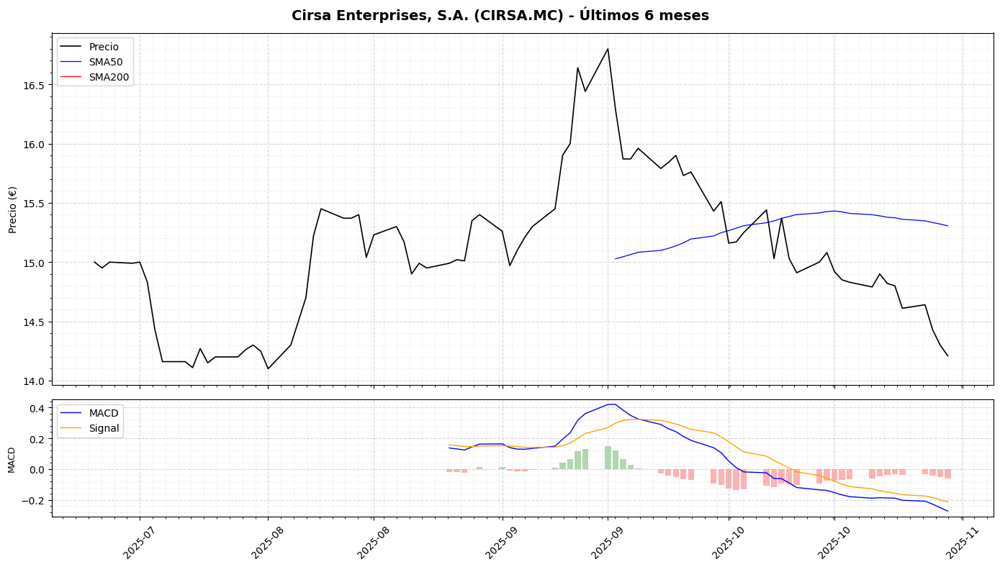


📈 Generando gráficas para último mes...


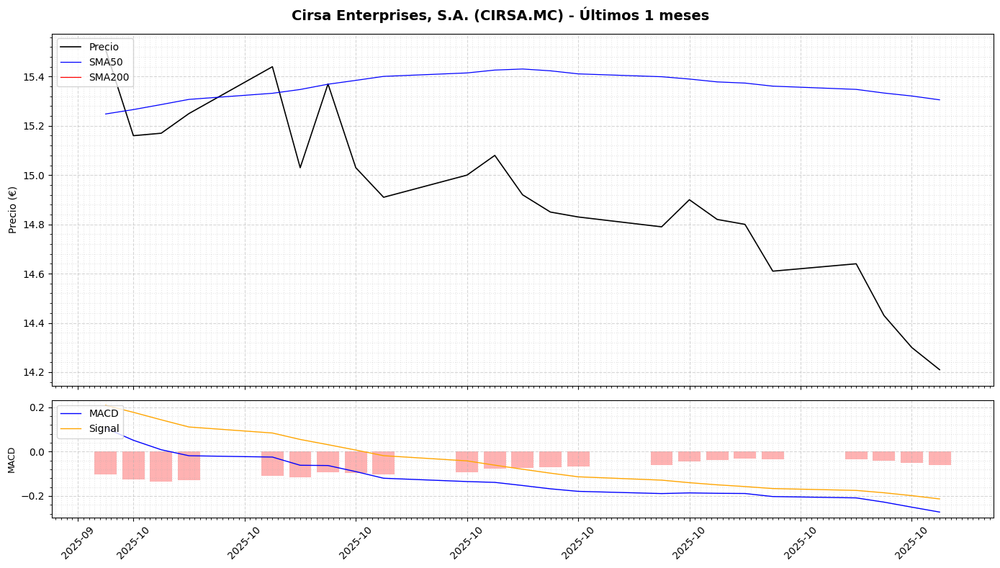

In [15]:
import yfinance as yf
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import talib as ta
import matplotlib.dates as mdates
from matplotlib.ticker import AutoMinorLocator

# ===========================
# CONFIGURACIÓN
# ===========================
SYMBOL = "CIRSA.MC"
PERIOD = "10y"

# ===========================
# FUNCIONES
# ===========================
def get_currency(symbol):
    """Determina la divisa en función del sufijo del símbolo."""
    if symbol.endswith(".MC"):
        return "€"
    else:
        return "$"

def download_data(symbol, period):
    """Descarga los datos y aplana columnas si tienen múltiples niveles."""
    df = yf.download(symbol, period=period)[["Open", "High", "Low", "Close", "Volume"]]
    # Si las columnas son MultiIndex (por ejemplo ('Close','BBVA.MC')), las aplanamos
    if isinstance(df.columns, pd.MultiIndex):
        df.columns = [col[0] for col in df.columns]
    return df

def compute_indicators(df):
    df["SMA50"] = ta.SMA(df["Close"].values, timeperiod=50)
    df["SMA200"] = ta.SMA(df["Close"].values, timeperiod=200)
    df["RSI"] = ta.RSI(df["Close"].values, timeperiod=14)
    macd, macd_signal, macd_hist = ta.MACD(df["Close"].values, fastperiod=12, slowperiod=26, signalperiod=9)
    df["MACD"], df["MACD_signal"], df["MACD_hist"] = macd, macd_signal, macd_hist
    return df

def detect_signals(df):
    df["Signal"] = np.nan
    df["Signal"] = np.where(
        (df["SMA50"] > df["SMA200"]) & (df["SMA50"].shift(1) <= df["SMA200"].shift(1)),
        "BUY",
        df["Signal"],
    )
    df["Signal"] = np.where(
        (df["SMA50"] < df["SMA200"]) & (df["SMA50"].shift(1) >= df["SMA200"].shift(1)),
        "SELL",
        df["Signal"],
    )
    buys = df[df["Signal"] == "BUY"].index
    sells = df[df["Signal"] == "SELL"].index
    return df, buys, sells

def find_crosses(df):
    golden = df[(df["SMA50"] > df["SMA200"]) & (df["SMA50"].shift(1) <= df["SMA200"].shift(1))]
    death = df[(df["SMA50"] < df["SMA200"]) & (df["SMA50"].shift(1) >= df["SMA200"].shift(1))]
    return golden, death

def plot_with_grids(df, buys, sells, months, symbol, currency, long_name):
    plt.style.use("default")
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(14, 8), sharex=True, gridspec_kw={"height_ratios": [3, 1]})
    fig.suptitle(f"{long_name} ({symbol}) - Últimos {months} meses", fontsize=14, fontweight="bold")

    end_date = df.index[-1]
    start_date = end_date - pd.DateOffset(months=months)
    df_plot = df.loc[start_date:end_date]

    # === GRÁFICO PRINCIPAL ===
    ax1.plot(df_plot.index, df_plot["Close"], label="Precio", color="black", linewidth=1.2)
    ax1.plot(df_plot.index, df_plot["SMA50"], label="SMA50", color="blue", linewidth=0.9)
    ax1.plot(df_plot.index, df_plot["SMA200"], label="SMA200", color="red", linewidth=0.9)

    for b in buys:
        if b in df_plot.index:
            ax1.scatter(b, df_plot.loc[b, "Close"], color="green", marker="^", s=80, label="Buy")
    for s in sells:
        if s in df_plot.index:
            ax1.scatter(s, df_plot.loc[s, "Close"], color="red", marker="v", s=80, label="Sell")

    ax1.set_ylabel(f"Precio ({currency})", fontsize=10)
    ax1.legend(loc="upper left")
    ax1.grid(True, which="major", linestyle="--", alpha=0.5)
    ax1.grid(True, which="minor", linestyle=":", alpha=0.3)
    ax1.xaxis.set_minor_locator(AutoMinorLocator(10))
    ax1.yaxis.set_minor_locator(AutoMinorLocator(5))

    # === MACD ===
    ax2.plot(df_plot.index, df_plot["MACD"], label="MACD", color="blue", linewidth=1)
    ax2.plot(df_plot.index, df_plot["MACD_signal"], label="Signal", color="orange", linewidth=1)
    ax2.bar(
        df_plot.index,
        df_plot["MACD"] - df_plot["MACD_signal"],
        color=np.where(df_plot["MACD"] - df_plot["MACD_signal"] >= 0, "green", "red"),
        alpha=0.3,
    )
    ax2.legend(loc="upper left")
    ax2.set_ylabel("MACD", fontsize=9)
    ax2.grid(True, which="major", linestyle="--", alpha=0.5)
    ax2.grid(True, which="minor", linestyle=":", alpha=0.3)
    ax2.xaxis.set_minor_locator(AutoMinorLocator(10))
    ax2.yaxis.set_minor_locator(AutoMinorLocator(5))

    ax2.xaxis.set_major_formatter(mdates.DateFormatter("%Y-%m"))
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

# ===========================
# MAIN
# ===========================
def main(symbol, period):
    print(f"✅ Descargando datos históricos para {symbol} ...")
    df = download_data(symbol, period)
    print(f"📊 Datos descargados: {len(df)} filas. Columnas: {list(df.columns)}")

    print("➡️ Calculando indicadores (SMA50, SMA200, RSI, MACD)...")
    df = compute_indicators(df)
    print("✅ Indicadores calculados.")

    print("➡️ Detectando señales...")
    df, buys, sells = detect_signals(df)
    print(f"✅ Detección completada. Buy={len(buys)}, Sell={len(sells)}")

    golden, death = find_crosses(df)

    print("\n📋 Últimas filas del DataFrame:")
    print(df.tail(5)[["Close", "SMA50", "SMA200", "RSI", "MACD", "MACD_signal", "Signal"]])

    if not golden.empty:
        print("\n⭐ Últimos Golden Cross:")
        print(golden.tail(2)[["Close", "SMA50", "SMA200"]])
    if not death.empty:
        print("\n⚠️ Últimos Death Cross:")
        print(death.tail(2)[["Close", "SMA50", "SMA200"]])

    info = yf.Ticker(symbol).info
    long_name = info.get("longName", symbol)
    currency = get_currency(symbol)

    print("\n📈 Generando gráficas para últimos 6 meses...")
    plot_with_grids(df, buys, sells, 6, symbol, currency, long_name)

    print("\n📈 Generando gráficas para último mes...")
    plot_with_grids(df, buys, sells, 1, symbol, currency, long_name)

    return df, buys, sells, golden, death

# ===========================
# EJECUCIÓN
# ===========================
if __name__ == "__main__":
    print("🏁 INICIO DEL SCRIPT")
    df_result, buys, sells, golden, death = main(SYMBOL, PERIOD)


/tmp/ipython-input-1106510056.py:27: FutureWarning: YF.download() has changed argument auto_adjust default to True
  df = yf.download(symbol, period=period)[["Open", "High", "Low", "Close", "Volume"]]
[*********************100%***********************]  1 of 1 completed

🏁 INICIO DEL SCRIPT
✅ Descargando datos históricos para PUIG.MC ...
📊 Datos descargados: 383 filas. Columnas: ['Open', 'High', 'Low', 'Close', 'Volume']
➡️ Calculando indicadores (SMA50, SMA200, RSI, MACD)...
✅ Indicadores calculados.
➡️ Detectando señales...
✅ Detección completada. Buy=0, Sell=0
⚠️ No se detectaron cruces (posiblemente falta histórico o SMA200 no estable aún).

📋 Últimas filas del DataFrame:
            Close    SMA50     SMA200        RSI      MACD  MACD_signal Signal
Date                                                                          
2025-10-24  14.01  14.7446  16.232708  47.223246 -0.151975    -0.273705    nan
2025-10-27  13.98  14.7042  16.217371  46.607985 -0.139572    -0.246878    nan
2025-10-28  13.78  14.6556  16.197841  42.621290 -0.144218    -0.226346    nan
2025-10-29  13.58  14.6028  16.175569  39.026322 -0.162169    -0.213511    nan
2025-10-30  13.52  14.5546  16.153855  37.991055 -0.179171    -0.206643    nan



ERROR:yfinance:HTTP Error 500: {"quoteSummary":{"result":null,"error":{"code":"internal-error","description":"internal-error"}}}



📈 Generando gráficas para últimos 6 meses...


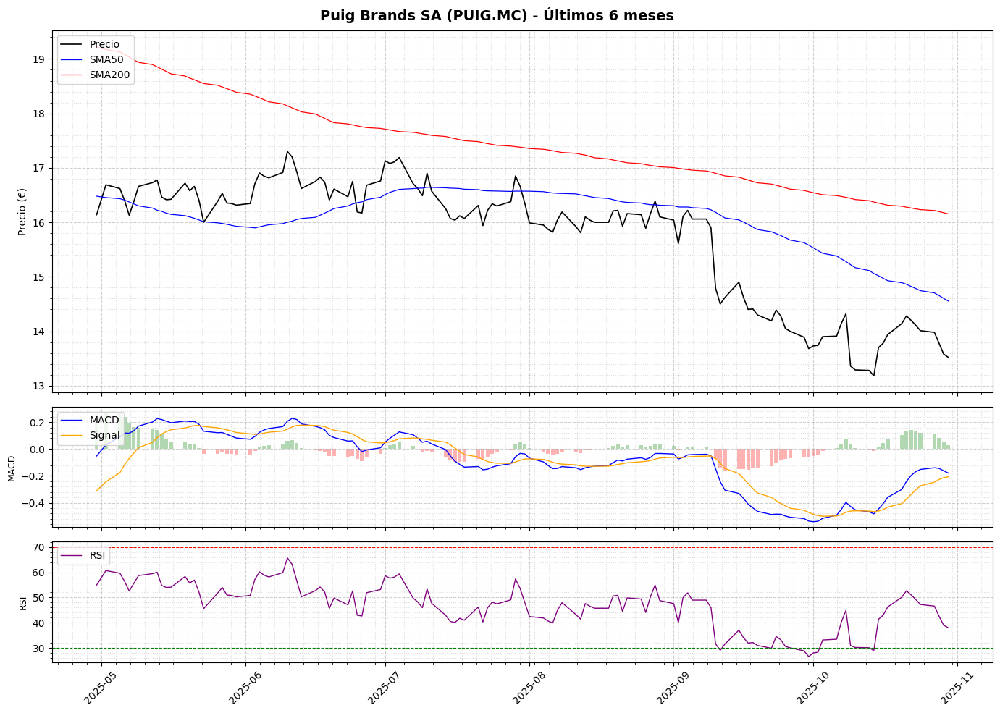


📈 Generando gráficas para último mes...


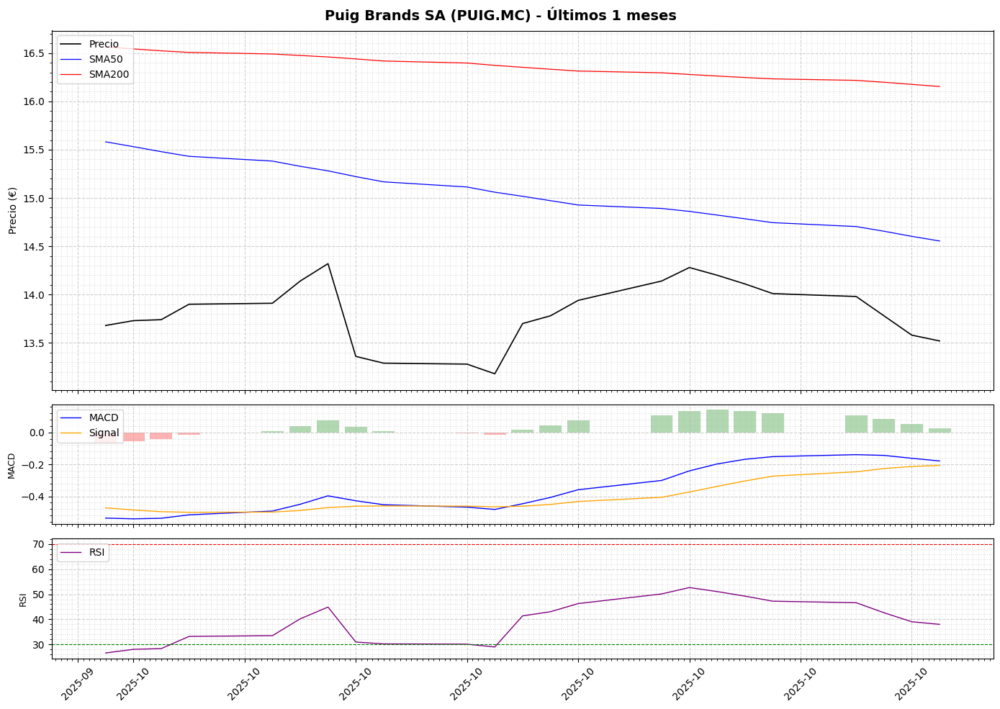

In [19]:
import yfinance as yf
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import talib as ta
import matplotlib.dates as mdates
from matplotlib.ticker import AutoMinorLocator

# ===========================
# CONFIGURACIÓN
# ===========================
SYMBOL = "PUIG.MC"
PERIOD = "10y"

# ===========================
# FUNCIONES
# ===========================
def get_currency(symbol):
    """Determina la divisa en función del sufijo del símbolo."""
    if symbol.endswith(".MC"):
        return "€"
    else:
        return "$"

def download_data(symbol, period):
    """Descarga los datos y aplana columnas si tienen múltiples niveles."""
    df = yf.download(symbol, period=period)[["Open", "High", "Low", "Close", "Volume"]]
    if isinstance(df.columns, pd.MultiIndex):
        df.columns = [col[0] for col in df.columns]
    return df.dropna()

def compute_indicators(df):
    """Calcula los indicadores técnicos principales."""
    df["SMA50"] = ta.SMA(df["Close"].values, timeperiod=50)
    df["SMA200"] = ta.SMA(df["Close"].values, timeperiod=200)
    df["RSI"] = ta.RSI(df["Close"].values, timeperiod=14)
    macd, macd_signal, macd_hist = ta.MACD(df["Close"].values, fastperiod=12, slowperiod=26, signalperiod=9)
    df["MACD"], df["MACD_signal"], df["MACD_hist"] = macd, macd_signal, macd_hist
    return df.dropna()

def detect_signals(df):
    """Detecta señales de cruce entre SMA50 y SMA200."""
    df["Signal"] = np.nan
    df["Signal"] = np.where(
        (df["SMA50"] > df["SMA200"]) & (df["SMA50"].shift(1) <= df["SMA200"].shift(1)),
        "BUY",
        df["Signal"],
    )
    df["Signal"] = np.where(
        (df["SMA50"] < df["SMA200"]) & (df["SMA50"].shift(1) >= df["SMA200"].shift(1)),
        "SELL",
        df["Signal"],
    )
    buys = df[df["Signal"] == "BUY"].index
    sells = df[df["Signal"] == "SELL"].index
    return df, buys, sells

def find_crosses(df):
    """Encuentra los Golden Cross y Death Cross."""
    golden = df[(df["SMA50"] > df["SMA200"]) & (df["SMA50"].shift(1) <= df["SMA200"].shift(1))]
    death = df[(df["SMA50"] < df["SMA200"]) & (df["SMA50"].shift(1) >= df["SMA200"].shift(1))]
    return golden, death

def plot_with_grids(df, buys, sells, months, symbol, currency, long_name):
    """Genera gráficos con cuadrícula milimétrica e indicadores."""
    plt.style.use("default")
    fig, (ax1, ax2, ax3) = plt.subplots(
        3, 1, figsize=(14, 10), sharex=True, gridspec_kw={"height_ratios": [3, 1, 1]}
    )
    fig.suptitle(f"{long_name} ({symbol}) - Últimos {months} meses", fontsize=14, fontweight="bold")

    end_date = df.index[-1]
    start_date = end_date - pd.DateOffset(months=months)
    df_plot = df.loc[start_date:end_date]

    # === GRÁFICO PRINCIPAL (Precio + SMA + Señales) ===
    ax1.plot(df_plot.index, df_plot["Close"], label="Precio", color="black", linewidth=1.2)
    ax1.plot(df_plot.index, df_plot["SMA50"], label="SMA50", color="blue", linewidth=0.9)
    ax1.plot(df_plot.index, df_plot["SMA200"], label="SMA200", color="red", linewidth=0.9)

    for b in buys:
        if b in df_plot.index:
            ax1.scatter(b, df_plot.loc[b, "Close"], color="green", marker="^", s=80, label="Buy")
    for s in sells:
        if s in df_plot.index:
            ax1.scatter(s, df_plot.loc[s, "Close"], color="red", marker="v", s=80, label="Sell")

    ax1.set_ylabel(f"Precio ({currency})", fontsize=10)
    ax1.legend(loc="upper left")
    ax1.grid(True, which="major", linestyle="--", alpha=0.6)
    ax1.grid(True, which="minor", linestyle=":", alpha=0.4)
    ax1.xaxis.set_minor_locator(AutoMinorLocator(10))
    ax1.yaxis.set_minor_locator(AutoMinorLocator(5))

    # === GRÁFICO MACD ===
    ax2.plot(df_plot.index, df_plot["MACD"], label="MACD", color="blue", linewidth=1)
    ax2.plot(df_plot.index, df_plot["MACD_signal"], label="Signal", color="orange", linewidth=1)
    ax2.bar(
        df_plot.index,
        df_plot["MACD_hist"],
        color=np.where(df_plot["MACD_hist"] >= 0, "green", "red"),
        alpha=0.3,
    )
    ax2.legend(loc="upper left")
    ax2.set_ylabel("MACD", fontsize=9)
    ax2.grid(True, which="major", linestyle="--", alpha=0.6)
    ax2.grid(True, which="minor", linestyle=":", alpha=0.4)
    ax2.xaxis.set_minor_locator(AutoMinorLocator(10))
    ax2.yaxis.set_minor_locator(AutoMinorLocator(5))

    # === GRÁFICO RSI ===
    ax3.plot(df_plot.index, df_plot["RSI"], label="RSI", color="purple", linewidth=1)
    ax3.axhline(70, color="red", linestyle="--", linewidth=0.8)
    ax3.axhline(30, color="green", linestyle="--", linewidth=0.8)
    ax3.set_ylabel("RSI", fontsize=9)
    ax3.legend(loc="upper left")
    ax3.grid(True, which="major", linestyle="--", alpha=0.6)
    ax3.grid(True, which="minor", linestyle=":", alpha=0.4)
    ax3.xaxis.set_minor_locator(AutoMinorLocator(10))
    ax3.yaxis.set_minor_locator(AutoMinorLocator(5))
    ax3.xaxis.set_major_formatter(mdates.DateFormatter("%Y-%m"))

    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()


# ===========================
# MAIN
# ===========================
def main(symbol, period):
    print(f"✅ Descargando datos históricos para {symbol} ...")
    df = download_data(symbol, period)
    print(f"📊 Datos descargados: {len(df)} filas. Columnas: {list(df.columns)}")

    print("➡️ Calculando indicadores (SMA50, SMA200, RSI, MACD)...")
    df = compute_indicators(df)
    print("✅ Indicadores calculados.")

    print("➡️ Detectando señales...")
    df, buys, sells = detect_signals(df)
    print(f"✅ Detección completada. Buy={len(buys)}, Sell={len(sells)}")
    if len(buys) == 0 and len(sells) == 0:
        print("⚠️ No se detectaron cruces (posiblemente falta histórico o SMA200 no estable aún).")

    golden, death = find_crosses(df)

    print("\n📋 Últimas filas del DataFrame:")
    print(df.tail(5)[["Close", "SMA50", "SMA200", "RSI", "MACD", "MACD_signal", "Signal"]])

    if not golden.empty:
        print("\n⭐ Últimos Golden Cross:")
        print(golden.tail(2)[["Close", "SMA50", "SMA200"]])
    if not death.empty:
        print("\n⚠️ Últimos Death Cross:")
        print(death.tail(2)[["Close", "SMA50", "SMA200"]])

    info = yf.Ticker(symbol).info
    long_name = info.get("longName", symbol)
    currency = get_currency(symbol)

    print("\n📈 Generando gráficas para últimos 6 meses...")
    plot_with_grids(df, buys, sells, 6, symbol, currency, long_name)

    print("\n📈 Generando gráficas para último mes...")
    plot_with_grids(df, buys, sells, 1, symbol, currency, long_name)

    return df, buys, sells, golden, death


# ===========================
# EJECUCIÓN
# ===========================
if __name__ == "__main__":
    print("🏁 INICIO DEL SCRIPT")
    df_result, buys, sells, golden, death = main(SYMBOL, PERIOD)


🏁 INICIO DEL SCRIPT
✅ Descargando datos históricos para BBVA.MC ...
📡 Descargando histórico completo (desde 1900)...


/tmp/ipython-input-2299026897.py:28: FutureWarning: YF.download() has changed argument auto_adjust default to True
  df = yf.download(symbol, start="1900-01-01", end=datetime.now().strftime("%Y-%m-%d"))
[*********************100%***********************]  1 of 1 completed


📊 Datos descargados: 6633 filas (2000-01-03 → 2025-10-29)
✅ Indicadores calculados.
✅ Detección completada. Buy=19, Sell=19

📋 Últimas filas del DataFrame:
                Close    SMA50     SMA200        RSI      MACD  MACD_signal  \
Date                                                                          
2025-10-23  16.959999  16.1581  13.438252  60.816704  0.236075     0.143319   
2025-10-24  16.900000  16.1665  13.472989  59.617431  0.245292     0.163714   
2025-10-27  17.200001  16.1833  13.508913  63.493774  0.273650     0.185701   
2025-10-28  17.190001  16.1991  13.545172  63.275734  0.291951     0.206951   
2025-10-29  17.580000  16.2257  13.583357  67.904721  0.334074     0.232375   

           Signal  
Date               
2025-10-23    nan  
2025-10-24    nan  
2025-10-27    nan  
2025-10-28    nan  
2025-10-29    nan  

⭐ Últimos Golden Cross:
               Close     SMA50    SMA200
Date                                    
2022-10-31  4.374288  3.947788  3.942842
20

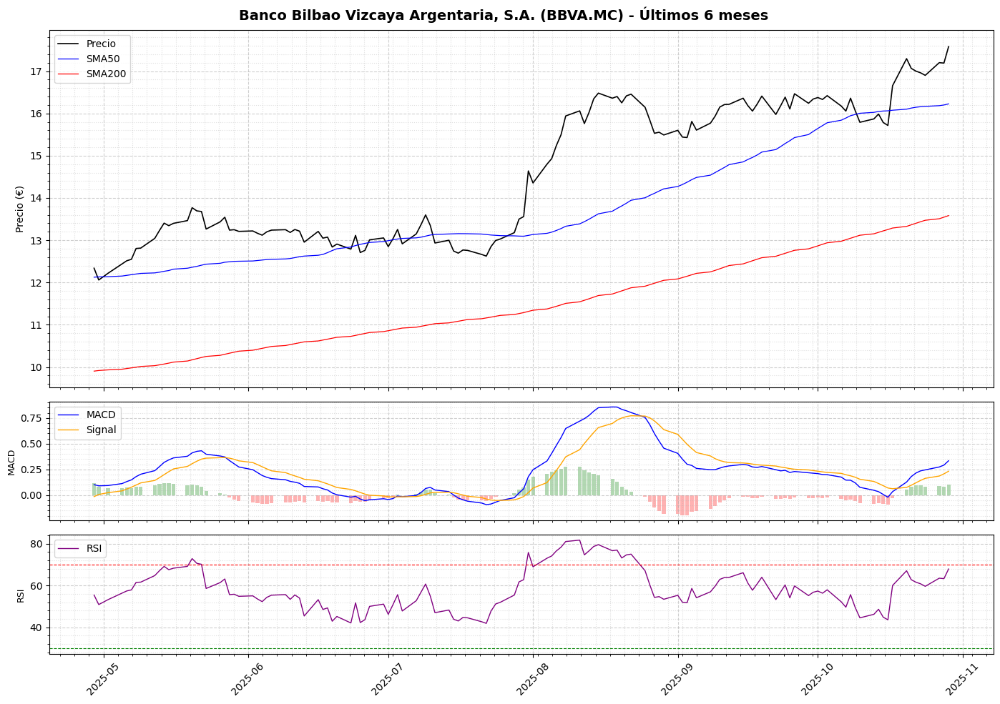


📈 Generando gráficas para último mes...


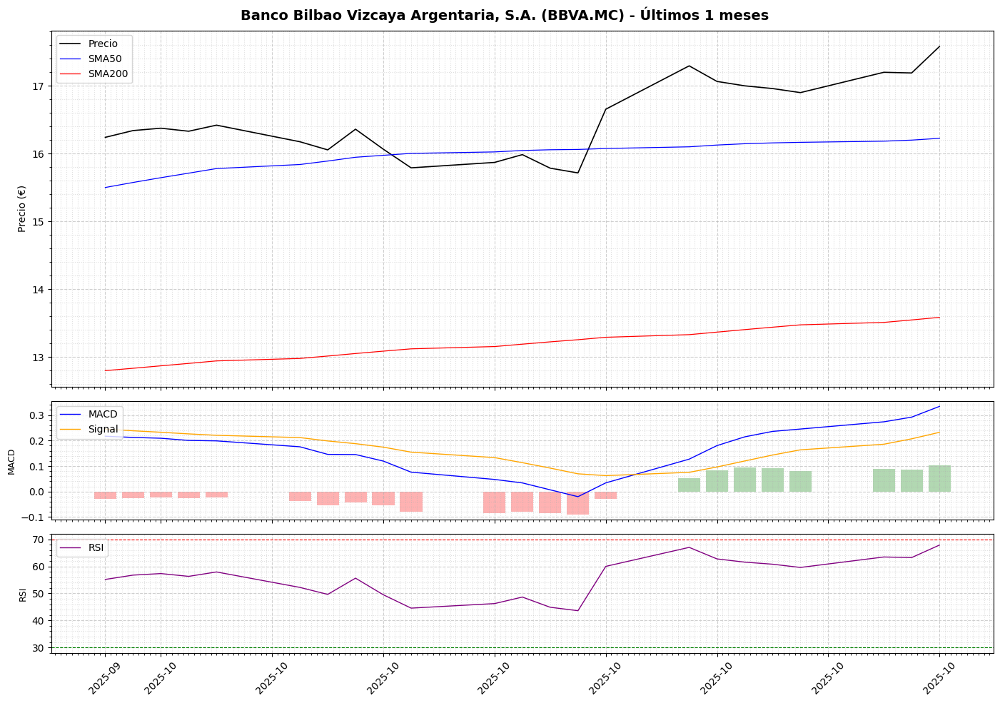

In [21]:
import yfinance as yf
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import talib as ta
import matplotlib.dates as mdates
from matplotlib.ticker import AutoMinorLocator
from datetime import datetime

# ===========================
# CONFIGURACIÓN
# ===========================
SYMBOL = "BBVA.MC"

# ===========================
# FUNCIONES
# ===========================
def get_currency(symbol):
    """Determina la divisa según el sufijo del símbolo."""
    if symbol.endswith(".MC"):
        return "€"
    else:
        return "$"

def download_data(symbol):
    """Descarga TODO el histórico disponible desde 1900."""
    print("📡 Descargando histórico completo (desde 1900)...")
    df = yf.download(symbol, start="1900-01-01", end=datetime.now().strftime("%Y-%m-%d"))
    if isinstance(df.columns, pd.MultiIndex):
        df.columns = [col[0] for col in df.columns]
    df = df[["Open", "High", "Low", "Close", "Volume"]].dropna()
    return df

def compute_indicators(df):
    df["SMA50"] = ta.SMA(df["Close"], timeperiod=50)
    df["SMA200"] = ta.SMA(df["Close"], timeperiod=200)
    df["RSI"] = ta.RSI(df["Close"], timeperiod=14)
    macd, signal, hist = ta.MACD(df["Close"], fastperiod=12, slowperiod=26, signalperiod=9)
    df["MACD"], df["MACD_signal"], df["MACD_hist"] = macd, signal, hist
    return df.dropna()

def detect_signals(df):
    df["Signal"] = np.nan
    df["Signal"] = np.where(
        (df["SMA50"] > df["SMA200"]) & (df["SMA50"].shift(1) <= df["SMA200"].shift(1)), "BUY", df["Signal"]
    )
    df["Signal"] = np.where(
        (df["SMA50"] < df["SMA200"]) & (df["SMA50"].shift(1) >= df["SMA200"].shift(1)), "SELL", df["Signal"]
    )
    buys = df[df["Signal"] == "BUY"].index
    sells = df[df["Signal"] == "SELL"].index
    return df, buys, sells

def find_crosses(df):
    golden = df[(df["SMA50"] > df["SMA200"]) & (df["SMA50"].shift(1) <= df["SMA200"].shift(1))]
    death = df[(df["SMA50"] < df["SMA200"]) & (df["SMA50"].shift(1) >= df["SMA200"].shift(1))]
    return golden, death

def plot_with_grids(df, buys, sells, months, symbol, currency, long_name):
    plt.style.use("default")
    fig, (ax1, ax2, ax3) = plt.subplots(
        3, 1, figsize=(14, 10), sharex=True, gridspec_kw={"height_ratios": [3, 1, 1]}
    )
    fig.suptitle(f"{long_name} ({symbol}) - Últimos {months} meses", fontsize=14, fontweight="bold")

    end = df.index[-1]
    start = end - pd.DateOffset(months=months)
    df_plot = df.loc[start:end]

    # === Gráfico principal (Precio) ===
    ax1.plot(df_plot.index, df_plot["Close"], color="black", label="Precio", linewidth=1.2)
    ax1.plot(df_plot.index, df_plot["SMA50"], color="blue", label="SMA50", linewidth=0.9)
    ax1.plot(df_plot.index, df_plot["SMA200"], color="red", label="SMA200", linewidth=0.9)

    for b in buys:
        if b in df_plot.index:
            ax1.scatter(b, df_plot.loc[b, "Close"], color="green", marker="^", s=80, label="Buy")
    for s in sells:
        if s in df_plot.index:
            ax1.scatter(s, df_plot.loc[s, "Close"], color="red", marker="v", s=80, label="Sell")

    ax1.set_ylabel(f"Precio ({currency})", fontsize=10)
    ax1.legend(loc="upper left")
    ax1.grid(True, which="major", linestyle="--", alpha=0.6)
    ax1.grid(True, which="minor", linestyle=":", alpha=0.4)
    ax1.xaxis.set_minor_locator(AutoMinorLocator(10))
    ax1.yaxis.set_minor_locator(AutoMinorLocator(5))

    # === MACD ===
    ax2.plot(df_plot.index, df_plot["MACD"], color="blue", label="MACD", linewidth=1)
    ax2.plot(df_plot.index, df_plot["MACD_signal"], color="orange", label="Signal", linewidth=1)
    ax2.bar(df_plot.index, df_plot["MACD_hist"], color=np.where(df_plot["MACD_hist"] >= 0, "green", "red"), alpha=0.3)
    ax2.legend(loc="upper left")
    ax2.set_ylabel("MACD", fontsize=9)
    ax2.grid(True, which="major", linestyle="--", alpha=0.6)
    ax2.grid(True, which="minor", linestyle=":", alpha=0.4)
    ax2.xaxis.set_minor_locator(AutoMinorLocator(10))
    ax2.yaxis.set_minor_locator(AutoMinorLocator(5))

    # === RSI ===
    ax3.plot(df_plot.index, df_plot["RSI"], color="purple", label="RSI", linewidth=1)
    ax3.axhline(70, color="red", linestyle="--", linewidth=0.8)
    ax3.axhline(30, color="green", linestyle="--", linewidth=0.8)
    ax3.legend(loc="upper left")
    ax3.set_ylabel("RSI", fontsize=9)
    ax3.grid(True, which="major", linestyle="--", alpha=0.6)
    ax3.grid(True, which="minor", linestyle=":", alpha=0.4)
    ax3.xaxis.set_minor_locator(AutoMinorLocator(10))
    ax3.yaxis.set_minor_locator(AutoMinorLocator(5))
    ax3.xaxis.set_major_formatter(mdates.DateFormatter("%Y-%m"))

    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

# ===========================
# MAIN
# ===========================
def main(symbol):
    print(f"✅ Descargando datos históricos para {symbol} ...")
    df = download_data(symbol)
    print(f"📊 Datos descargados: {len(df)} filas ({df.index[0].date()} → {df.index[-1].date()})")

    df = compute_indicators(df)
    print("✅ Indicadores calculados.")

    df, buys, sells = detect_signals(df)
    print(f"✅ Detección completada. Buy={len(buys)}, Sell={len(sells)}")
    if len(buys) == 0 and len(sells) == 0:
        print("⚠️ No se detectaron cruces (puede faltar histórico o SMA200 aún no estable).")

    golden, death = find_crosses(df)
    print("\n📋 Últimas filas del DataFrame:")
    print(df.tail(5)[["Close", "SMA50", "SMA200", "RSI", "MACD", "MACD_signal", "Signal"]])

    if not golden.empty:
        print("\n⭐ Últimos Golden Cross:")
        print(golden.tail(2)[["Close", "SMA50", "SMA200"]])
    if not death.empty:
        print("\n⚠️ Últimos Death Cross:")
        print(death.tail(2)[["Close", "SMA50", "SMA200"]])

    try:
        info = yf.Ticker(symbol).info
        long_name = info.get("longName", symbol)
    except Exception:
        long_name = symbol

    currency = get_currency(symbol)
    print("\n📈 Generando gráficas para últimos 6 meses...")
    plot_with_grids(df, buys, sells, 6, symbol, currency, long_name)

    print("\n📈 Generando gráficas para último mes...")
    plot_with_grids(df, buys, sells, 1, symbol, currency, long_name)

    return df, buys, sells, golden, death


# ===========================
# EJECUCIÓN
# ===========================
if __name__ == "__main__":
    print("🏁 INICIO DEL SCRIPT")
    df_result, buys, sells, golden, death = main(SYMBOL)


/tmp/ipython-input-2996070525.py:26: FutureWarning: YF.download() has changed argument auto_adjust default to True
  df = yf.download(symbol, start="1900-01-01", end=datetime.now().strftime("%Y-%m-%d"))
[*********************100%***********************]  1 of 1 completed

🏁 INICIO DEL SCRIPT
✅ Descargando datos históricos para BBVA.MC ...
📡 Descargando histórico completo (desde 1900)...
📊 Datos descargados: 6633 filas (2000-01-03 → 2025-10-29)
✅ Indicadores calculados.
✅ Detección completada. Buy=19, Sell=19

📋 Últimas filas del DataFrame:
                Close    SMA50     SMA200        RSI      MACD  MACD_signal  \
Date                                                                          
2025-10-23  16.959999  16.1581  13.438252  60.816704  0.236075     0.143319   
2025-10-24  16.900000  16.1665  13.472989  59.617431  0.245292     0.163714   
2025-10-27  17.200001  16.1833  13.508913  63.493774  0.273650     0.185701   
2025-10-28  17.190001  16.1991  13.545172  63.275734  0.291951     0.206951   
2025-10-29  17.580000  16.2257  13.583357  67.904721  0.334074     0.232375   

           Signal  
Date               
2025-10-23    nan  
2025-10-24    nan  
2025-10-27    nan  
2025-10-28    nan  
2025-10-29    nan  

⭐ Últimos Golden Cross:
        


📈 Generando gráficas para últimos 6 meses...


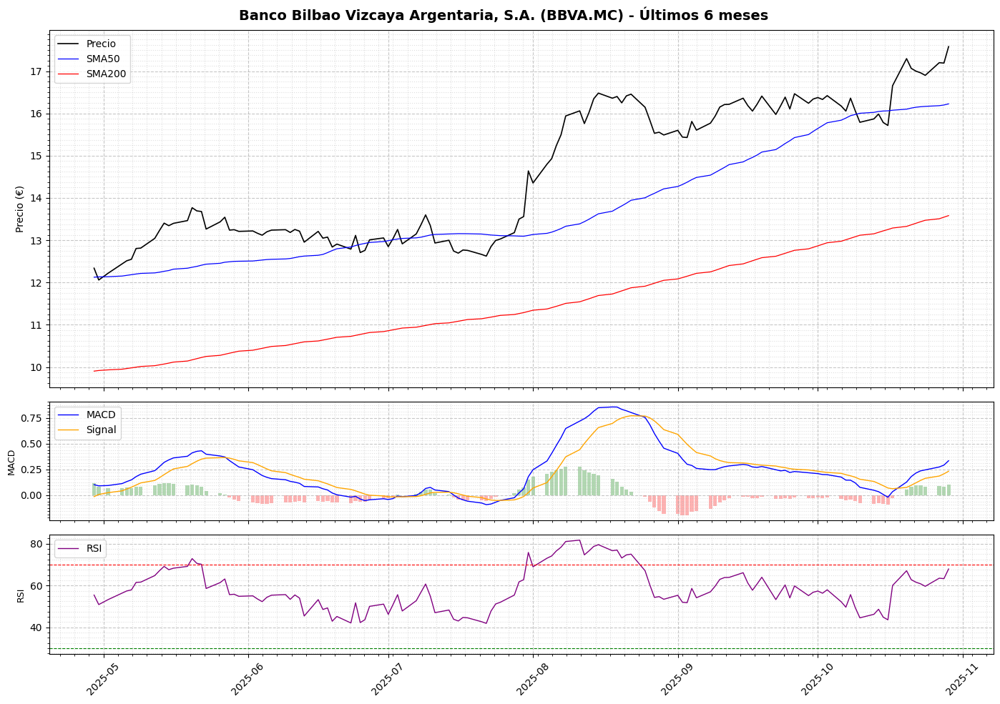


📈 Generando gráficas para último mes...


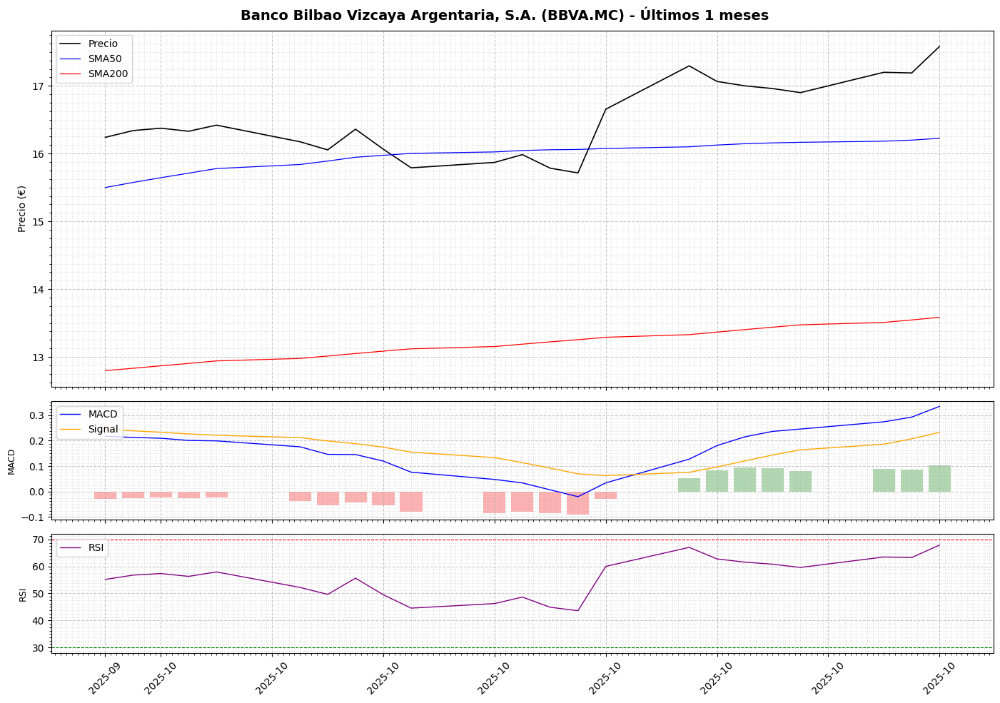

In [22]:
import yfinance as yf
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import talib as ta
import matplotlib.dates as mdates
from matplotlib.ticker import AutoMinorLocator
from datetime import datetime

# ===========================
# CONFIGURACIÓN
# ===========================
SYMBOL = "BBVA.MC"

# ===========================
# FUNCIONES
# ===========================
def get_currency(symbol):
    if symbol.endswith(".MC"):
        return "€"
    else:
        return "$"

def download_data(symbol):
    print("📡 Descargando histórico completo (desde 1900)...")
    df = yf.download(symbol, start="1900-01-01", end=datetime.now().strftime("%Y-%m-%d"))
    if isinstance(df.columns, pd.MultiIndex):
        df.columns = [col[0] for col in df.columns]
    df = df[["Open", "High", "Low", "Close", "Volume"]].dropna()
    return df

def compute_indicators(df):
    df["SMA50"] = ta.SMA(df["Close"], timeperiod=50)
    df["SMA200"] = ta.SMA(df["Close"], timeperiod=200)
    df["RSI"] = ta.RSI(df["Close"], timeperiod=14)
    macd, signal, hist = ta.MACD(df["Close"], fastperiod=12, slowperiod=26, signalperiod=9)
    df["MACD"], df["MACD_signal"], df["MACD_hist"] = macd, signal, hist
    return df.dropna()

def detect_signals(df):
    df["Signal"] = np.nan
    df["Signal"] = np.where(
        (df["SMA50"] > df["SMA200"]) & (df["SMA50"].shift(1) <= df["SMA200"].shift(1)), "BUY", df["Signal"]
    )
    df["Signal"] = np.where(
        (df["SMA50"] < df["SMA200"]) & (df["SMA50"].shift(1) >= df["SMA200"].shift(1)), "SELL", df["Signal"]
    )
    buys = df[df["Signal"] == "BUY"].index
    sells = df[df["Signal"] == "SELL"].index
    return df, buys, sells

def find_crosses(df):
    golden = df[(df["SMA50"] > df["SMA200"]) & (df["SMA50"].shift(1) <= df["SMA200"].shift(1))]
    death = df[(df["SMA50"] < df["SMA200"]) & (df["SMA50"].shift(1) >= df["SMA200"].shift(1))]
    return golden, death

def plot_with_grids(df, buys, sells, months, symbol, currency, long_name):
    plt.style.use("default")
    fig, (ax1, ax2, ax3) = plt.subplots(
        3, 1, figsize=(14, 10), sharex=True, gridspec_kw={"height_ratios": [3, 1, 1]}
    )
    fig.suptitle(f"{long_name} ({symbol}) - Últimos {months} meses", fontsize=14, fontweight="bold")

    end = df.index[-1]
    start = end - pd.DateOffset(months=months)
    df_plot = df.loc[start:end]

    # === Gráfico principal (Precio) ===
    ax1.plot(df_plot.index, df_plot["Close"], color="black", label="Precio", linewidth=1.2)
    ax1.plot(df_plot.index, df_plot["SMA50"], color="blue", label="SMA50", linewidth=0.9)
    ax1.plot(df_plot.index, df_plot["SMA200"], color="red", label="SMA200", linewidth=0.9)

    # Marcadores Buy/Sell
    for b in buys:
        if b in df_plot.index:
            ax1.scatter(b, df_plot.loc[b, "Close"], color="green", marker="^", s=80, label="Buy")
    for s in sells:
        if s in df_plot.index:
            ax1.scatter(s, df_plot.loc[s, "Close"], color="red", marker="v", s=80, label="Sell")

    ax1.set_ylabel(f"Precio ({currency})", fontsize=10)
    ax1.legend(loc="upper left")
    ax1.grid(True, which="major", linestyle="--", alpha=0.7)
    ax1.grid(True, which="minor", linestyle=":", alpha=0.4)
    ax1.xaxis.set_minor_locator(AutoMinorLocator(10))
    ax1.yaxis.set_minor_locator(AutoMinorLocator(8))

    # === MACD ===
    ax2.plot(df_plot.index, df_plot["MACD"], color="blue", label="MACD", linewidth=1)
    ax2.plot(df_plot.index, df_plot["MACD_signal"], color="orange", label="Signal", linewidth=1)
    ax2.bar(df_plot.index, df_plot["MACD_hist"], color=np.where(df_plot["MACD_hist"] >= 0, "green", "red"), alpha=0.3)
    ax2.legend(loc="upper left")
    ax2.set_ylabel("MACD", fontsize=9)
    ax2.grid(True, which="major", linestyle="--", alpha=0.7)
    ax2.grid(True, which="minor", linestyle=":", alpha=0.4)
    ax2.xaxis.set_minor_locator(AutoMinorLocator(10))
    ax2.yaxis.set_minor_locator(AutoMinorLocator(8))

    # === RSI ===
    ax3.plot(df_plot.index, df_plot["RSI"], color="purple", label="RSI", linewidth=1)
    ax3.axhline(70, color="red", linestyle="--", linewidth=0.8)
    ax3.axhline(30, color="green", linestyle="--", linewidth=0.8)
    ax3.legend(loc="upper left")
    ax3.set_ylabel("RSI", fontsize=9)
    ax3.grid(True, which="major", linestyle="--", alpha=0.7)
    ax3.grid(True, which="minor", linestyle=":", alpha=0.4)
    ax3.xaxis.set_minor_locator(AutoMinorLocator(10))
    ax3.yaxis.set_minor_locator(AutoMinorLocator(8))
    ax3.xaxis.set_major_formatter(mdates.DateFormatter("%Y-%m"))

    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

# ===========================
# MAIN
# ===========================
def main(symbol):
    print(f"✅ Descargando datos históricos para {symbol} ...")
    df = download_data(symbol)
    print(f"📊 Datos descargados: {len(df)} filas ({df.index[0].date()} → {df.index[-1].date()})")

    df = compute_indicators(df)
    print("✅ Indicadores calculados.")

    df, buys, sells = detect_signals(df)
    print(f"✅ Detección completada. Buy={len(buys)}, Sell={len(sells)}")

    golden, death = find_crosses(df)
    print("\n📋 Últimas filas del DataFrame:")
    print(df.tail(5)[["Close", "SMA50", "SMA200", "RSI", "MACD", "MACD_signal", "Signal"]])

    if not golden.empty:
        print("\n⭐ Últimos Golden Cross:")
        print(golden.tail(2)[["Close", "SMA50", "SMA200"]])
    if not death.empty:
        print("\n⚠️ Últimos Death Cross:")
        print(death.tail(2)[["Close", "SMA50", "SMA200"]])

    try:
        info = yf.Ticker(symbol).info
        long_name = info.get("longName", symbol)
    except Exception:
        long_name = symbol

    currency = get_currency(symbol)
    print("\n📈 Generando gráficas para últimos 6 meses...")
    plot_with_grids(df, buys, sells, 6, symbol, currency, long_name)

    print("\n📈 Generando gráficas para último mes...")
    plot_with_grids(df, buys, sells, 1, symbol, currency, long_name)

    return df, buys, sells, golden, death


# ===========================
# EJECUCIÓN
# ===========================
if __name__ == "__main__":
    print("🏁 INICIO DEL SCRIPT")
    df_result, buys, sells, golden, death = main(SYMBOL)


/tmp/ipython-input-1925018322.py:32: FutureWarning: YF.download() has changed argument auto_adjust default to True
  df = yf.download(symbol, start="1900-01-01", end=datetime.now().strftime("%Y-%m-%d"))
[*********************100%***********************]  1 of 1 completed

🏁 INICIO DEL SCRIPT
✅ Descargando datos históricos para BBVA.MC ...
📊 Datos descargados: 6633 filas (2000-01-03 → 2025-10-29)
✅ Indicadores calculados.


✅ Detección completada. Buy=19, Sell=19

📋 Últimas filas del DataFrame:
Price           Close       High        Low       Open    Volume Signal  \
Date                                                                      
2025-10-23  16.959999  17.174999  16.900000  17.000000   4720528    NaN   
2025-10-24  16.900000  17.100000  16.735001  17.014999   6644829    NaN   
2025-10-27  17.200001  17.235001  17.004999  17.049999   6597073    NaN   
2025-10-28  17.190001  17.215000  17.040001  17.070000   5314738    NaN   
2025-10-29  17.580000  17.584999  17.055000  17.209999  10750147    NaN   

Price         SMA50     SMA200        RSI      MACD  MACD_signal  
Date                                                              
2025-10-23  16.1581  13.438252  60.816704  0.236075     0.143319  
2025-10-24  16.1665  13.472989  59.617431  0.245292     0.163714  
2025-10-27  16.1833  13.508913  63.493774  0.273650     0.185701  
2025-10-28  16.1991  13.545172  63.275734  0.291951     0.206951  


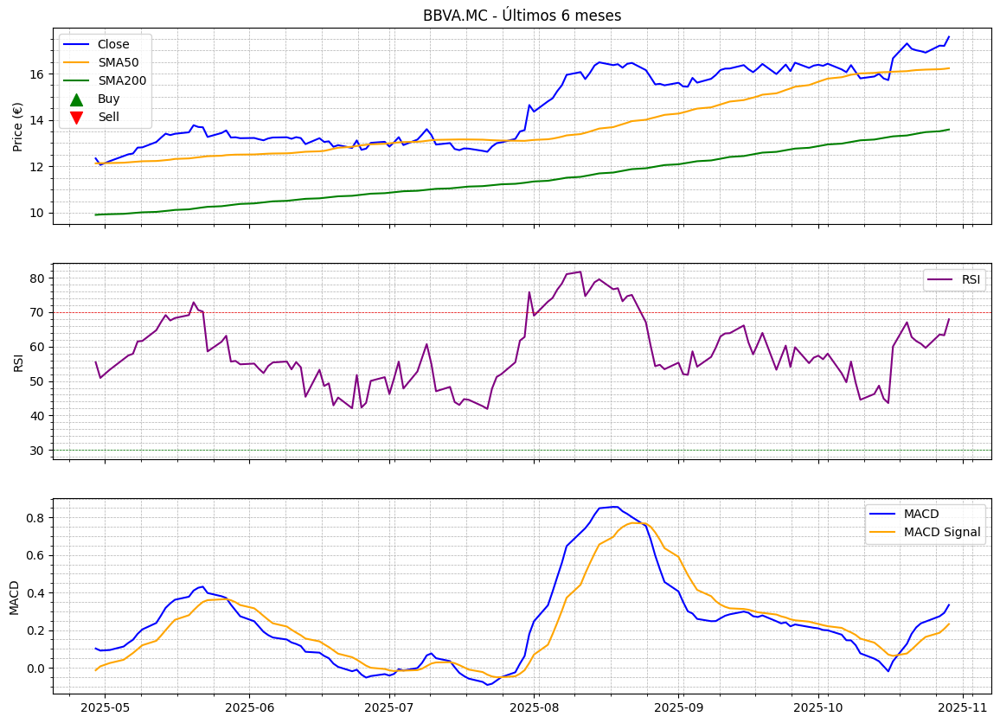

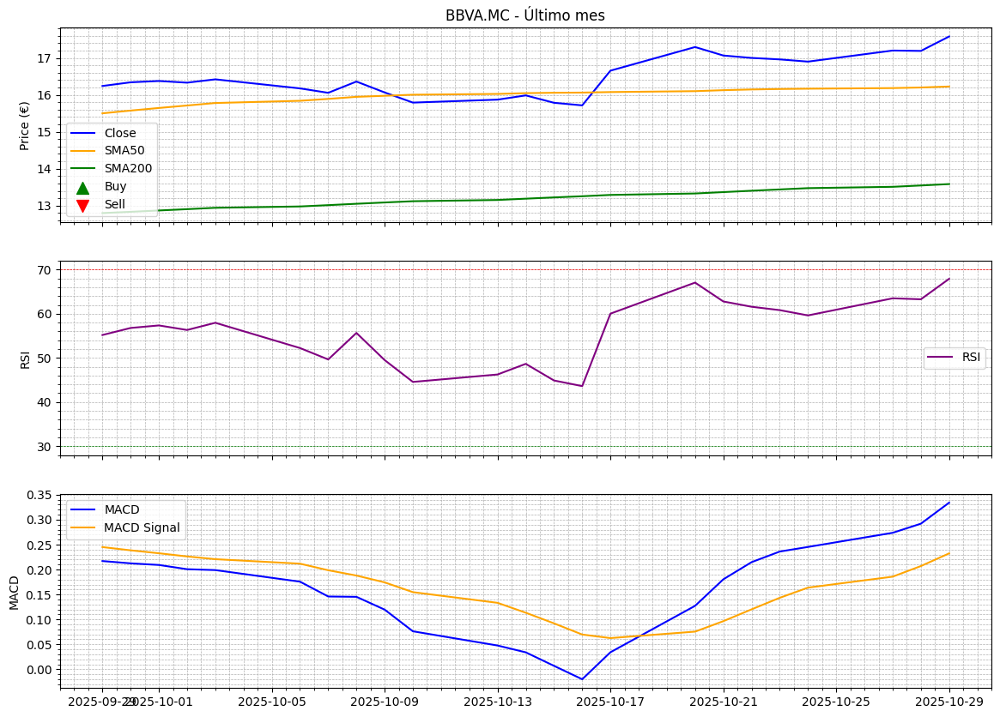

In [30]:
# ===============================
# Script definitivo con RSI/MACD y señales (sin warnings)
# ===============================

import yfinance as yf
import pandas as pd
import numpy as np
import talib as ta
import matplotlib.pyplot as plt
from datetime import datetime

# -------------------------------
# Configuración
# -------------------------------
SYMBOL = "BBVA.MC"
SMA50_PERIOD = 50
SMA200_PERIOD = 200
RSI_PERIOD = 14
MACD_FAST = 12
MACD_SLOW = 26
MACD_SIGNAL = 9

# -------------------------------
# Función principal
# -------------------------------
def main(symbol):
    print("🏁 INICIO DEL SCRIPT")

    # Descarga histórico completo desde 1900
    print(f"✅ Descargando datos históricos para {symbol} ...")
    with pd.option_context('mode.chained_assignment', None):  # Desactiva warnings temporales
        df = yf.download(symbol, start="1900-01-01", end=datetime.now().strftime("%Y-%m-%d"))

    # Limpiar MultiIndex si existe
    if isinstance(df.columns, pd.MultiIndex):
        df.columns = df.columns.get_level_values(0)

    # Inicializar columna Signal como object
    df['Signal'] = pd.Series(index=df.index, dtype='object')

    print(f"📊 Datos descargados: {len(df)} filas ({df.index[0].date()} → {df.index[-1].date()})")

    # -------------------------------
    # Indicadores
    # -------------------------------
    close = df['Close'].values.astype(float)
    df['SMA50'] = ta.SMA(close, timeperiod=SMA50_PERIOD)
    df['SMA200'] = ta.SMA(close, timeperiod=SMA200_PERIOD)
    df['RSI'] = ta.RSI(close, timeperiod=RSI_PERIOD)
    macd, macd_signal, macd_hist = ta.MACD(close, fastperiod=MACD_FAST, slowperiod=MACD_SLOW, signalperiod=MACD_SIGNAL)
    df['MACD'] = macd
    df['MACD_signal'] = macd_signal

    print("✅ Indicadores calculados.")

    # -------------------------------
    # Señales Buy/Sell
    # -------------------------------
    for i in range(1, len(df)):
        if pd.notna(df['SMA50'].iloc[i-1]) and pd.notna(df['SMA200'].iloc[i-1]):
            # Buy
            if df['SMA50'].iloc[i-1] < df['SMA200'].iloc[i-1] and df['SMA50'].iloc[i] > df['SMA200'].iloc[i]:
                df.loc[df.index[i], 'Signal'] = 'Buy'
            # Sell
            elif df['SMA50'].iloc[i-1] > df['SMA200'].iloc[i-1] and df['SMA50'].iloc[i] < df['SMA200'].iloc[i]:
                df.loc[df.index[i], 'Signal'] = 'Sell'

    buys = df[df['Signal']=='Buy']
    sells = df[df['Signal']=='Sell']

    print(f"✅ Detección completada. Buy={len(buys)}, Sell={len(sells)}")

    # -------------------------------
    # Golden/Death Cross
    # -------------------------------
    golden = df[(df['SMA50'] > df['SMA200']) & (df['SMA50'].shift(1) < df['SMA200'].shift(1))]
    death = df[(df['SMA50'] < df['SMA200']) & (df['SMA50'].shift(1) > df['SMA200'].shift(1))]

    # -------------------------------
    # Mostrar resumen
    # -------------------------------
    print("\n📋 Últimas filas del DataFrame:")
    print(df.tail())

    print("\n⭐ Últimas señales Buy:")
    print(buys.tail(2))
    print("\n⚠️ Últimas señales Sell:")
    print(sells.tail(2))

    print("\n⭐ Últimos Golden Cross:")
    print(golden.tail(2))
    print("\n⚠️ Últimos Death Cross:")
    print(death.tail(2))

    # -------------------------------
    # Gráficas
    # -------------------------------
    last_6m = df[df.index >= df.index[-1] - pd.DateOffset(months=6)]
    last_1m = df[df.index >= df.index[-1] - pd.DateOffset(months=1)]

    for data, title in [(last_6m, "Últimos 6 meses"), (last_1m, "Último mes")]:
        fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(14,10), sharex=True)

        # Precio + SMA
        ax1.plot(data.index, data['Close'], label='Close', color='blue')
        ax1.plot(data.index, data['SMA50'], label='SMA50', color='orange')
        ax1.plot(data.index, data['SMA200'], label='SMA200', color='green')
        ax1.scatter(data.index[data['Signal']=='Buy'], data['Close'][data['Signal']=='Buy'], marker='^', color='green', s=100, label='Buy')
        ax1.scatter(data.index[data['Signal']=='Sell'], data['Close'][data['Signal']=='Sell'], marker='v', color='red', s=100, label='Sell')
        ax1.set_ylabel('Price (€)')
        ax1.set_title(f"{symbol} - {title}")
        ax1.grid(True, which='both', linestyle='--', linewidth=0.5)
        ax1.minorticks_on()
        ax1.legend()

        # RSI
        ax2.plot(data.index, data['RSI'], label='RSI', color='purple')
        ax2.axhline(70, color='red', linestyle='--', linewidth=0.5)
        ax2.axhline(30, color='green', linestyle='--', linewidth=0.5)
        ax2.set_ylabel('RSI')
        ax2.grid(True, which='both', linestyle='--', linewidth=0.5)
        ax2.minorticks_on()
        ax2.legend()

        # MACD
        ax3.plot(data.index, data['MACD'], label='MACD', color='blue')
        ax3.plot(data.index, data['MACD_signal'], label='MACD Signal', color='orange')
        ax3.set_ylabel('MACD')
        ax3.grid(True, which='both', linestyle='--', linewidth=0.5)
        ax3.minorticks_on()
        ax3.legend()

        plt.show()

    return df, buys, sells, golden, death

# =======================
# EJECUCIÓN
# =======================
if __name__ == "__main__":
    df_result, buys, sells, golden, death = main(SYMBOL)


🏁 INICIO DEL ANÁLISIS
✅ Descargando datos históricos para BBVA.MC desde 1900-01-01...
📊 Datos descargados: 6633 filas (2000-01-03 → 2025-10-29)
✅ Indicadores calculados.
✅ Detección de señales completada. Buy=19, Sell=19

📋 Últimas filas del DataFrame:
Price           Close       High        Low       Open    Volume    SMA50  \
Date                                                                        
2025-10-23  16.959999  17.174999  16.900000  17.000000   4720528  16.1581   
2025-10-24  16.900000  17.100000  16.735001  17.014999   6644829  16.1665   
2025-10-27  17.200001  17.235001  17.004999  17.049999   6597073  16.1833   
2025-10-28  17.190001  17.215000  17.040001  17.070000   5314738  16.1991   
2025-10-29  17.580000  17.584999  17.055000  17.209999  10750147  16.2257   

Price          SMA200        RSI      MACD  MACD_signal Signal  
Date                                                            
2025-10-23  13.438252  60.816704  0.236075     0.143319    NaN  
2025-10-24  

/tmp/ipython-input-1379489301.py:43: FutureWarning: YF.download() has changed argument auto_adjust default to True
  df = yf.download(symbol, start=start_date, end=end_date, progress=False)
/tmp/ipython-input-1379489301.py:108: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'Buy' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  df.loc[buy_condition, 'Signal'] = 'Buy'


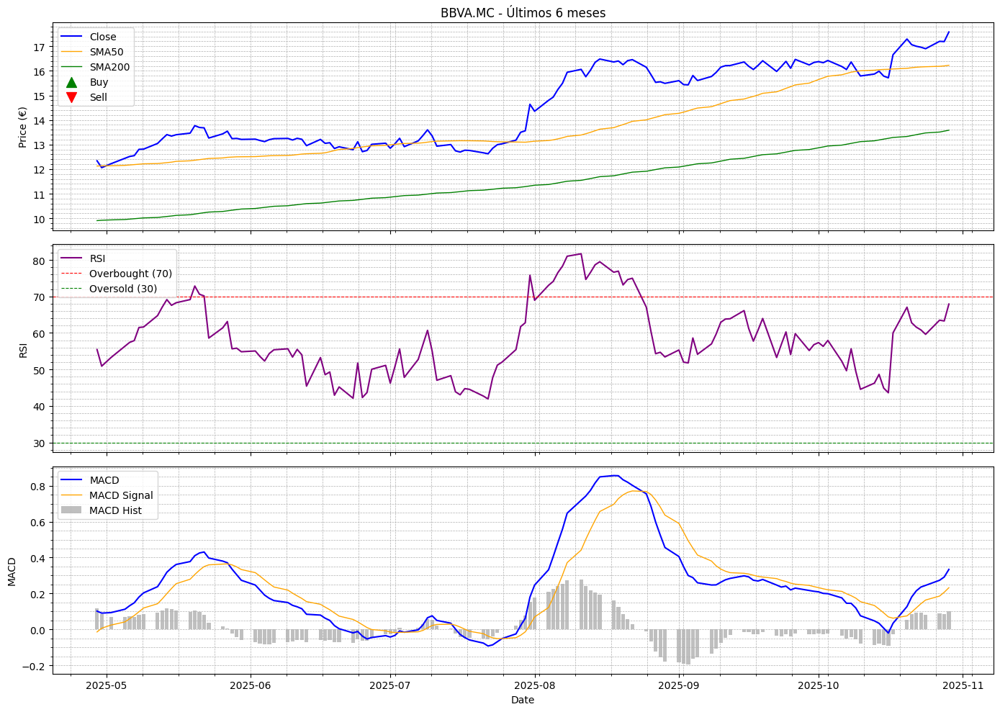

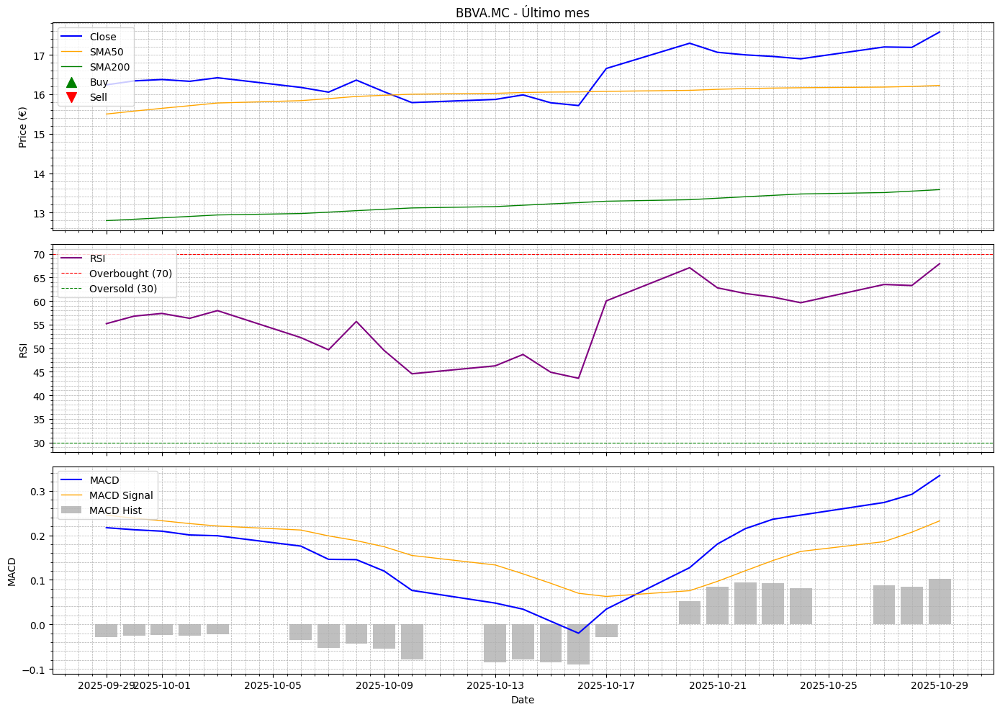

✅ ANÁLISIS COMPLETADO.


In [31]:
# ===============================
# Script optimizado con RSI/MACD y señales
# ===============================

!pip install ta-lib yfinance pandas numpy matplotlib --quiet

import yfinance as yf
import pandas as pd
import numpy as np
import talib as ta
import matplotlib.pyplot as plt
from datetime import datetime, timedelta

# -------------------------------
# Configuración
# -------------------------------
SYMBOL = "BBVA.MC"
SMA50_PERIOD = 50
SMA200_PERIOD = 200
RSI_PERIOD = 14
MACD_FAST = 12
MACD_SLOW = 26
MACD_SIGNAL = 9

# -------------------------------
# Funciones auxiliares
# -------------------------------

def download_stock_data(symbol: str, start_date: str = "1900-01-01") -> pd.DataFrame:
    """
    Descarga datos históricos de un símbolo bursátil.

    Args:
        symbol (str): Símbolo del activo (ej. "BBVA.MC").
        start_date (str): Fecha de inicio para la descarga (formato "YYYY-MM-DD").

    Returns:
        pd.DataFrame: DataFrame con los datos históricos o un DataFrame vacío si falla.
    """
    print(f"✅ Descargando datos históricos para {symbol} desde {start_date}...")
    try:
        end_date = datetime.now().strftime("%Y-%m-%d")
        df = yf.download(symbol, start=start_date, end=end_date, progress=False)

        if df.empty:
            print(f"❌ No se pudieron descargar datos para {symbol}. El DataFrame está vacío.")
            return pd.DataFrame()

        # Limpiar MultiIndex si existe (puede ocurrir con yfinance en algunos casos)
        if isinstance(df.columns, pd.MultiIndex):
            df.columns = df.columns.get_level_values(0)

        print(f"📊 Datos descargados: {len(df)} filas ({df.index[0].date()} → {df.index[-1].date()})")
        return df
    except Exception as e:
        print(f"❌ Error al descargar datos para {symbol}: {e}")
        return pd.DataFrame()

def calculate_technical_indicators(df: pd.DataFrame) -> pd.DataFrame:
    """
    Calcula los indicadores técnicos (SMA, RSI, MACD) para el DataFrame.

    Args:
        df (pd.DataFrame): DataFrame con los datos de precios.

    Returns:
        pd.DataFrame: DataFrame con los indicadores añadidos.
    """
    if df.empty:
        return df

    close = df['Close'].values.astype(float)
    df['SMA50'] = ta.SMA(close, timeperiod=SMA50_PERIOD)
    df['SMA200'] = ta.SMA(close, timeperiod=SMA200_PERIOD)
    df['RSI'] = ta.RSI(close, timeperiod=RSI_PERIOD)

    macd, macd_signal, _ = ta.MACD(close, fastperiod=MACD_FAST, slowperiod=MACD_SLOW, signalperiod=MACD_SIGNAL)
    df['MACD'] = macd
    df['MACD_signal'] = macd_signal

    print("✅ Indicadores calculados.")
    return df

def detect_trading_signals(df: pd.DataFrame) -> pd.DataFrame:
    """
    Detecta señales de compra y venta basadas en el cruce de SMAs.

    Args:
        df (pd.DataFrame): DataFrame con los datos de precios y SMAs.

    Returns:
        pd.DataFrame: DataFrame con la columna 'Signal' actualizada.
    """
    if df.empty:
        return df

    df['Signal'] = np.nan # Inicializar con NaN

    # Calcular SMAs del día anterior
    prev_sma50 = df['SMA50'].shift(1)
    prev_sma200 = df['SMA200'].shift(1)

    # Condiciones para Buy y Sell
    buy_condition = (prev_sma50 < prev_sma200) & (df['SMA50'] > df['SMA200'])
    sell_condition = (prev_sma50 > prev_sma200) & (df['SMA50'] < df['SMA200'])

    # Asignar señales de forma vectorizada
    df.loc[buy_condition, 'Signal'] = 'Buy'
    df.loc[sell_condition, 'Signal'] = 'Sell'

    buys_count = df['Signal'].value_counts().get('Buy', 0)
    sells_count = df['Signal'].value_counts().get('Sell', 0)
    print(f"✅ Detección de señales completada. Buy={buys_count}, Sell={sells_count}")
    return df

def detect_cross_events(df: pd.DataFrame) -> tuple[pd.DataFrame, pd.DataFrame]:
    """
    Detecta eventos de Golden Cross y Death Cross.

    Args:
        df (pd.DataFrame): DataFrame con los datos de precios y SMAs.

    Returns:
        tuple[pd.DataFrame, pd.DataFrame]: DataFrames con los eventos Golden Cross y Death Cross.
    """
    if df.empty:
        return pd.DataFrame(), pd.DataFrame()

    golden_cross = df[(df['SMA50'] > df['SMA200']) & (df['SMA50'].shift(1) < df['SMA200'].shift(1))].copy()
    death_cross = df[(df['SMA50'] < df['SMA200']) & (df['SMA50'].shift(1) > df['SMA200'].shift(1))].copy()

    return golden_cross, death_cross

def generate_plots(df: pd.DataFrame, symbol: str):
    """
    Genera y muestra las gráficas de precios, RSI y MACD.

    Args:
        df (pd.DataFrame): DataFrame con los datos y los indicadores.
        symbol (str): Símbolo del activo para el título de las gráficas.
    """
    if df.empty:
        print("No hay datos para graficar.")
        return

    # Asegurarse de que el índice sea de tipo datetime
    df.index = pd.to_datetime(df.index)

    # Filtrar datos para los últimos 6 meses y el último mes
    end_date = df.index[-1]
    start_6m = end_date - pd.DateOffset(months=6)
    start_1m = end_date - pd.DateOffset(months=1)

    last_6m_data = df[df.index >= start_6m].copy()
    last_1m_data = df[df.index >= start_1m].copy()

    plot_periods = [
        (last_6m_data, "Últimos 6 meses"),
        (last_1m_data, "Último mes")
    ]

    for data_subset, title_suffix in plot_periods:
        if data_subset.empty:
            print(f"No hay suficientes datos para graficar {title_suffix}.")
            continue

        fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(14, 10), sharex=True)

        # Gráfica de Precio + SMA
        ax1.plot(data_subset.index, data_subset['Close'], label='Close', color='blue', linewidth=1.5)
        ax1.plot(data_subset.index, data_subset['SMA50'], label='SMA50', color='orange', linewidth=1)
        ax1.plot(data_subset.index, data_subset['SMA200'], label='SMA200', color='green', linewidth=1)

        # Señales Buy/Sell
        buy_signals = data_subset[data_subset['Signal'] == 'Buy']
        sell_signals = data_subset[data_subset['Signal'] == 'Sell']
        ax1.scatter(buy_signals.index, buy_signals['Close'], marker='^', color='green', s=100, label='Buy', zorder=5)
        ax1.scatter(sell_signals.index, sell_signals['Close'], marker='v', color='red', s=100, label='Sell', zorder=5)

        ax1.set_ylabel('Price (€)')
        ax1.set_title(f"{symbol} - {title_suffix}")
        ax1.grid(True, which='both', linestyle='--', linewidth=0.5)
        ax1.minorticks_on()
        ax1.legend(loc='upper left')

        # Gráfica de RSI
        ax2.plot(data_subset.index, data_subset['RSI'], label='RSI', color='purple', linewidth=1.5)
        ax2.axhline(70, color='red', linestyle='--', linewidth=0.8, label='Overbought (70)')
        ax2.axhline(30, color='green', linestyle='--', linewidth=0.8, label='Oversold (30)')
        ax2.set_ylabel('RSI')
        ax2.grid(True, which='both', linestyle='--', linewidth=0.5)
        ax2.minorticks_on()
        ax2.legend(loc='upper left')

        # Gráfica de MACD
        ax3.plot(data_subset.index, data_subset['MACD'], label='MACD', color='blue', linewidth=1.5)
        ax3.plot(data_subset.index, data_subset['MACD_signal'], label='MACD Signal', color='orange', linewidth=1)
        ax3.bar(data_subset.index, data_subset['MACD'] - data_subset['MACD_signal'], label='MACD Hist', color='gray', alpha=0.5)
        ax3.set_ylabel('MACD')
        ax3.grid(True, which='both', linestyle='--', linewidth=0.5)
        ax3.minorticks_on()
        ax3.legend(loc='upper left')
        ax3.set_xlabel('Date')

        plt.tight_layout() # Ajusta automáticamente los parámetros de la subtrama para que encajen en el área de la figura.
        plt.show()
        plt.close('all') # Cierra la figura para liberar memoria

# -------------------------------
# Función principal refactorizada
# -------------------------------
def run_analysis(symbol: str):
    """
    Función principal para ejecutar el análisis técnico completo.
    """
    print("🏁 INICIO DEL ANÁLISIS")

    df = download_stock_data(symbol)
    if df.empty:
        print("Análisis terminado debido a la falta de datos.")
        return None, None, None, None, None

    df = calculate_technical_indicators(df)
    df = detect_trading_signals(df)
    golden_cross, death_cross = detect_cross_events(df)

    # -------------------------------
    # Mostrar resumen
    # -------------------------------
    print("\n📋 Últimas filas del DataFrame:")
    print(df.tail())

    buys = df[df['Signal']=='Buy']
    sells = df[df['Signal']=='Sell']

    print("\n⭐ Últimas señales Buy:")
    print(buys.tail(2))
    print("\n⚠️ Últimas señales Sell:")
    print(sells.tail(2))

    print("\n⭐ Últimos Golden Cross:")
    print(golden_cross.tail(2))
    print("\n⚠️ Últimos Death Cross:")
    print(death_cross.tail(2))

    # -------------------------------
    # Gráficas
    # -------------------------------
    generate_plots(df, symbol)

    print("✅ ANÁLISIS COMPLETADO.")
    return df, buys, sells, golden_cross, death_cross

# =======================
# EJECUCIÓN
# =======================
if __name__ == "__main__":
    df_result, buys_result, sells_result, golden_result, death_result = run_analysis(SYMBOL)

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.1/4.1 MB 52.3 MB/s eta 0:00:00
🏁 INICIO DEL ANÁLISIS
✅ Descargando datos históricos para BBVA.MC desde 1900-01-01...
📊 Datos descargados: 6633 filas (2000-01-03 → 2025-10-29)
✅ Indicadores calculados.
✅ Detección de señales completada. Buy=19, Sell=19

📋 Últimas filas del DataFrame:
Price           Close       High        Low       Open    Volume    SMA50  \
Date                                                                        
2025-10-23  16.959999  17.174999  16.900000  17.000000   4720528  16.1581   
2025-10-24  16.900000  17.100000  16.735001  17.014999   6644829  16.1665   
2025-10-27  17.200001  17.235001  17.004999  17.049999   6597073  16.1833   
2025-10-28  17.190001  17.215000  17.040001  17.070000   5314738  16.1991   
2025-10-29  17.580000  17.584999  17.055000  17.209999  10750147  16.2257   

Price          SMA200        RSI      MACD  MACD_signal Signal  
Date                                                            


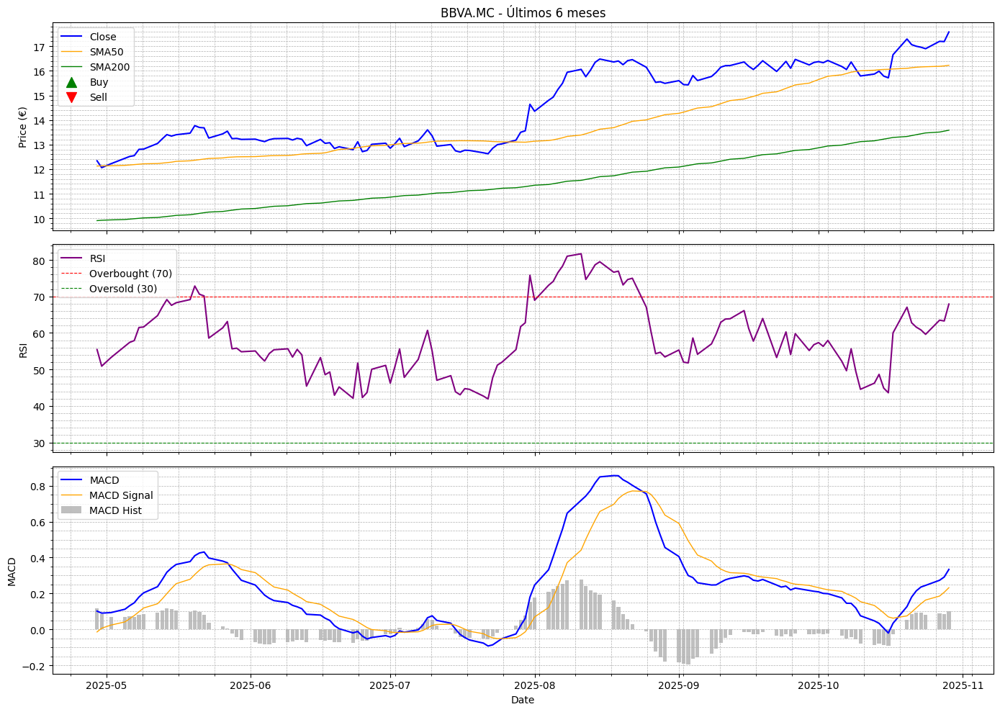

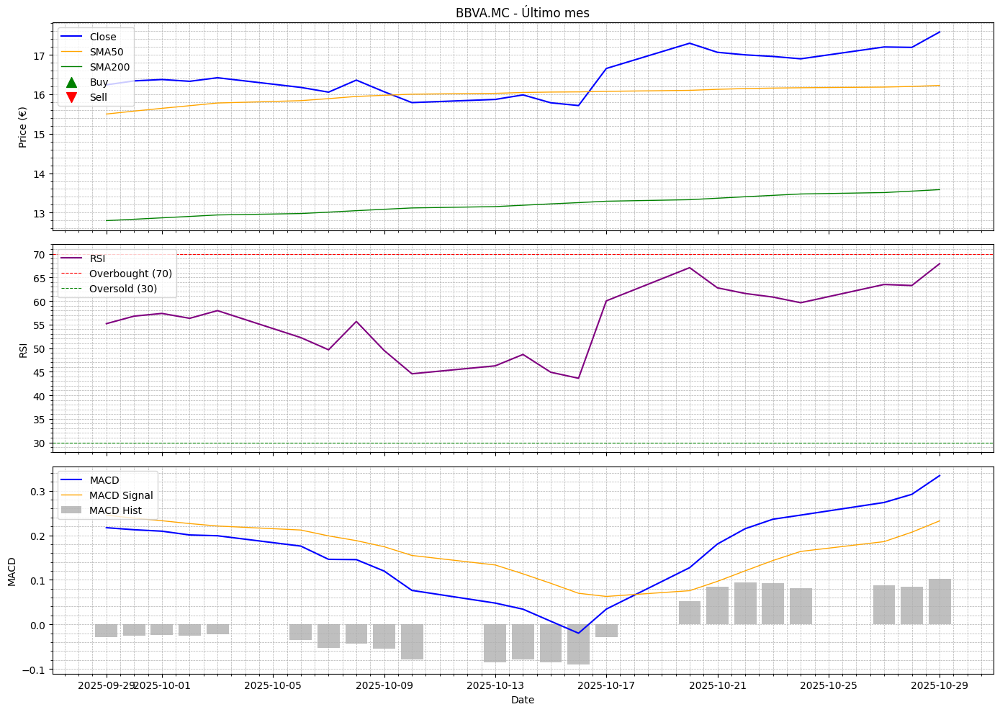

✅ ANÁLISIS COMPLETADO.


In [1]:
# ===============================
# Script optimizado con RSI/MACD y señales (warnings resueltos)
# ===============================

!pip install ta-lib yfinance pandas numpy matplotlib --quiet

import yfinance as yf
import pandas as pd
import numpy as np
import talib as ta
import matplotlib.pyplot as plt
from datetime import datetime, timedelta

# -------------------------------
# Configuración
# -------------------------------
SYMBOL = "BBVA.MC"
SMA50_PERIOD = 50
SMA200_PERIOD = 200
RSI_PERIOD = 14
MACD_FAST = 12
MACD_SLOW = 26
MACD_SIGNAL = 9

# -------------------------------
# Funciones auxiliares
# -------------------------------

def download_stock_data(symbol: str, start_date: str = "1900-01-01") -> pd.DataFrame:
    """
    Descarga datos históricos de un símbolo bursátil.

    Args:
        symbol (str): Símbolo del activo (ej. "BBVA.MC").
        start_date (str): Fecha de inicio para la descarga (formato "YYYY-MM-DD").

    Returns:
        pd.DataFrame: DataFrame con los datos históricos o un DataFrame vacío si falla.
    """
    print(f"✅ Descargando datos históricos para {symbol} desde {start_date}...")
    try:
        end_date = datetime.now().strftime("%Y-%m-%d")
        # Solución al FutureWarning de yfinance: establecer auto_adjust explícitamente
        df = yf.download(symbol, start=start_date, end=end_date, progress=False, auto_adjust=True)

        if df.empty:
            print(f"❌ No se pudieron descargar datos para {symbol}. El DataFrame está vacío.")
            return pd.DataFrame()

        # Limpiar MultiIndex si existe (puede ocurrir con yfinance en algunos casos)
        if isinstance(df.columns, pd.MultiIndex):
            df.columns = df.columns.get_level_values(0)

        print(f"📊 Datos descargados: {len(df)} filas ({df.index[0].date()} → {df.index[-1].date()})")
        return df
    except Exception as e:
        print(f"❌ Error al descargar datos para {symbol}: {e}")
        return pd.DataFrame()

def calculate_technical_indicators(df: pd.DataFrame) -> pd.DataFrame:
    """
    Calcula los indicadores técnicos (SMA, RSI, MACD) para el DataFrame.

    Args:
        df (pd.DataFrame): DataFrame con los datos de precios.

    Returns:
        pd.DataFrame: DataFrame con los indicadores añadidos.
    """
    if df.empty:
        return df

    close = df['Close'].values.astype(float)
    df['SMA50'] = ta.SMA(close, timeperiod=SMA50_PERIOD)
    df['SMA200'] = ta.SMA(close, timeperiod=SMA200_PERIOD)
    df['RSI'] = ta.RSI(close, timeperiod=RSI_PERIOD)

    macd, macd_signal, _ = ta.MACD(close, fastperiod=MACD_FAST, slowperiod=MACD_SLOW, signalperiod=MACD_SIGNAL)
    df['MACD'] = macd
    df['MACD_signal'] = macd_signal

    print("✅ Indicadores calculados.")
    return df

def detect_trading_signals(df: pd.DataFrame) -> pd.DataFrame:
    """
    Detecta señales de compra y venta basadas en el cruce de SMAs.

    Args:
        df (pd.DataFrame): DataFrame con los datos de precios y SMAs.

    Returns:
        pd.DataFrame: DataFrame con la columna 'Signal' actualizada.
    """
    if df.empty:
        return df

    # Solución al FutureWarning de pandas: inicializar la columna 'Signal' como tipo 'object'
    df['Signal'] = pd.Series(dtype='object', index=df.index)

    # Calcular SMAs del día anterior
    prev_sma50 = df['SMA50'].shift(1)
    prev_sma200 = df['SMA200'].shift(1)

    # Condiciones para Buy y Sell
    buy_condition = (prev_sma50 < prev_sma200) & (df['SMA50'] > df['SMA200'])
    sell_condition = (prev_sma50 > prev_sma200) & (df['SMA50'] < df['SMA200'])

    # Asignar señales de forma vectorizada
    df.loc[buy_condition, 'Signal'] = 'Buy'
    df.loc[sell_condition, 'Signal'] = 'Sell'

    buys_count = df['Signal'].value_counts().get('Buy', 0)
    sells_count = df['Signal'].value_counts().get('Sell', 0)
    print(f"✅ Detección de señales completada. Buy={buys_count}, Sell={sells_count}")
    return df

def detect_cross_events(df: pd.DataFrame) -> tuple[pd.DataFrame, pd.DataFrame]:
    """
    Detecta eventos de Golden Cross y Death Cross.

    Args:
        df (pd.DataFrame): DataFrame con los datos de precios y SMAs.

    Returns:
        tuple[pd.DataFrame, pd.DataFrame]: DataFrames con los eventos Golden Cross y Death Cross.
    """
    if df.empty:
        return pd.DataFrame(), pd.DataFrame()

    golden_cross = df[(df['SMA50'] > df['SMA200']) & (df['SMA50'].shift(1) < df['SMA200'].shift(1))].copy()
    death_cross = df[(df['SMA50'] < df['SMA200']) & (df['SMA50'].shift(1) > df['SMA200'].shift(1))].copy()

    return golden_cross, death_cross

def generate_plots(df: pd.DataFrame, symbol: str):
    """
    Genera y muestra las gráficas de precios, RSI y MACD.

    Args:
        df (pd.DataFrame): DataFrame con los datos y los indicadores.
        symbol (str): Símbolo del activo para el título de las gráficas.
    """
    if df.empty:
        print("No hay datos para graficar.")
        return

    # Asegurarse de que el índice sea de tipo datetime
    df.index = pd.to_datetime(df.index)

    # Filtrar datos para los últimos 6 meses y el último mes
    end_date = df.index[-1]
    start_6m = end_date - pd.DateOffset(months=6)
    start_1m = end_date - pd.DateOffset(months=1)

    last_6m_data = df[df.index >= start_6m].copy()
    last_1m_data = df[df.index >= start_1m].copy()

    plot_periods = [
        (last_6m_data, "Últimos 6 meses"),
        (last_1m_data, "Último mes")
    ]

    for data_subset, title_suffix in plot_periods:
        if data_subset.empty:
            print(f"No hay suficientes datos para graficar {title_suffix}.")
            continue

        fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(14, 10), sharex=True)

        # Gráfica de Precio + SMA
        ax1.plot(data_subset.index, data_subset['Close'], label='Close', color='blue', linewidth=1.5)
        ax1.plot(data_subset.index, data_subset['SMA50'], label='SMA50', color='orange', linewidth=1)
        ax1.plot(data_subset.index, data_subset['SMA200'], label='SMA200', color='green', linewidth=1)

        # Señales Buy/Sell
        buy_signals = data_subset[data_subset['Signal'] == 'Buy']
        sell_signals = data_subset[data_subset['Signal'] == 'Sell']
        ax1.scatter(buy_signals.index, buy_signals['Close'], marker='^', color='green', s=100, label='Buy', zorder=5)
        ax1.scatter(sell_signals.index, sell_signals['Close'], marker='v', color='red', s=100, label='Sell', zorder=5)

        ax1.set_ylabel('Price (€)')
        ax1.set_title(f"{symbol} - {title_suffix}")
        ax1.grid(True, which='both', linestyle='--', linewidth=0.5)
        ax1.minorticks_on()
        ax1.legend(loc='upper left')

        # Gráfica de RSI
        ax2.plot(data_subset.index, data_subset['RSI'], label='RSI', color='purple', linewidth=1.5)
        ax2.axhline(70, color='red', linestyle='--', linewidth=0.8, label='Overbought (70)')
        ax2.axhline(30, color='green', linestyle='--', linewidth=0.8, label='Oversold (30)')
        ax2.set_ylabel('RSI')
        ax2.grid(True, which='both', linestyle='--', linewidth=0.5)
        ax2.minorticks_on()
        ax2.legend(loc='upper left')

        # Gráfica de MACD
        ax3.plot(data_subset.index, data_subset['MACD'], label='MACD', color='blue', linewidth=1.5)
        ax3.plot(data_subset.index, data_subset['MACD_signal'], label='MACD Signal', color='orange', linewidth=1)
        ax3.bar(data_subset.index, data_subset['MACD'] - data_subset['MACD_signal'], label='MACD Hist', color='gray', alpha=0.5)
        ax3.set_ylabel('MACD')
        ax3.grid(True, which='both', linestyle='--', linewidth=0.5)
        ax3.minorticks_on()
        ax3.legend(loc='upper left')
        ax3.set_xlabel('Date')

        plt.tight_layout() # Ajusta automáticamente los parámetros de la subtrama para que encajen en el área de la figura.
        plt.show()
        plt.close('all') # Cierra la figura para liberar memoria

# -------------------------------
# Función principal refactorizada
# -------------------------------
def run_analysis(symbol: str):
    """
    Función principal para ejecutar el análisis técnico completo.
    """
    print("🏁 INICIO DEL ANÁLISIS")

    df = download_stock_data(symbol)
    if df.empty:
        print("Análisis terminado debido a la falta de datos.")
        return None, None, None, None, None

    df = calculate_technical_indicators(df)
    df = detect_trading_signals(df)
    golden_cross, death_cross = detect_cross_events(df)

    # -------------------------------
    # Mostrar resumen
    # -------------------------------
    print("\n📋 Últimas filas del DataFrame:")
    print(df.tail())

    buys = df[df['Signal']=='Buy']
    sells = df[df['Signal']=='Sell']

    print("\n⭐ Últimas señales Buy:")
    print(buys.tail(2))
    print("\n⚠️ Últimas señales Sell:")
    print(sells.tail(2))

    print("\n⭐ Últimos Golden Cross:")
    print(golden_cross.tail(2))
    print("\n⚠️ Últimos Death Cross:")
    print(death_cross.tail(2))

    # -------------------------------
    # Gráficas
    # -------------------------------
    generate_plots(df, symbol)

    print("✅ ANÁLISIS COMPLETADO.")
    return df, buys, sells, golden_cross, death_cross

# =======================
# EJECUCIÓN
# =======================
if __name__ == "__main__":
    df_result, buys_result, sells_result, golden_result, death_result = run_analysis(SYMBOL)

🏁 INICIO DEL ANÁLISIS
✅ Descargando datos históricos para BBVA.MC desde 1900-01-01...
📊 Datos descargados: 6633 filas (2000-01-03 → 2025-10-29)
✅ Indicadores calculados.
✅ Detección de señales completada. Buy=19, Sell=19

📋 Últimas filas del DataFrame:
Price           Close       High        Low       Open    Volume    SMA50  \
Date                                                                        
2025-10-23  16.959999  17.174999  16.900000  17.000000   4720528  16.1581   
2025-10-24  16.900000  17.100000  16.735001  17.014999   6644829  16.1665   
2025-10-27  17.200001  17.235001  17.004999  17.049999   6597073  16.1833   
2025-10-28  17.190001  17.215000  17.040001  17.070000   5314738  16.1991   
2025-10-29  17.580000  17.584999  17.055000  17.209999  10750147  16.2257   

Price          SMA200        RSI      MACD  MACD_signal           OBV Signal  
Date                                                                          
2025-10-23  13.438252  60.816704  0.236075     0.

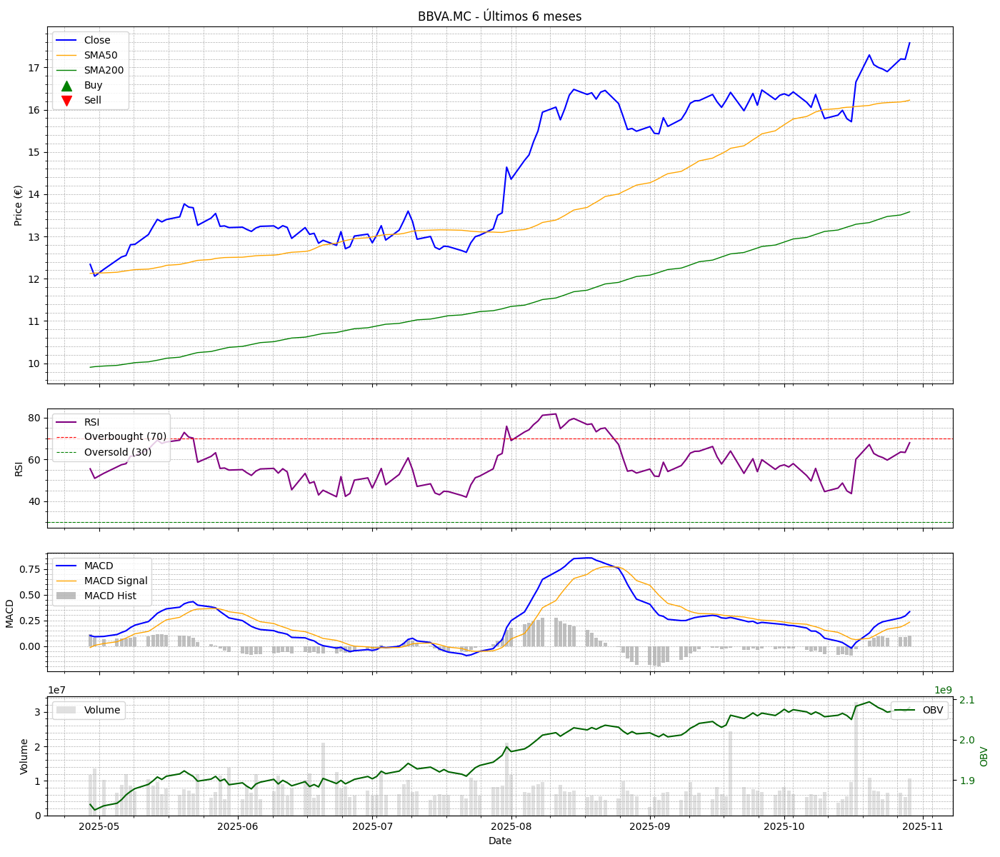

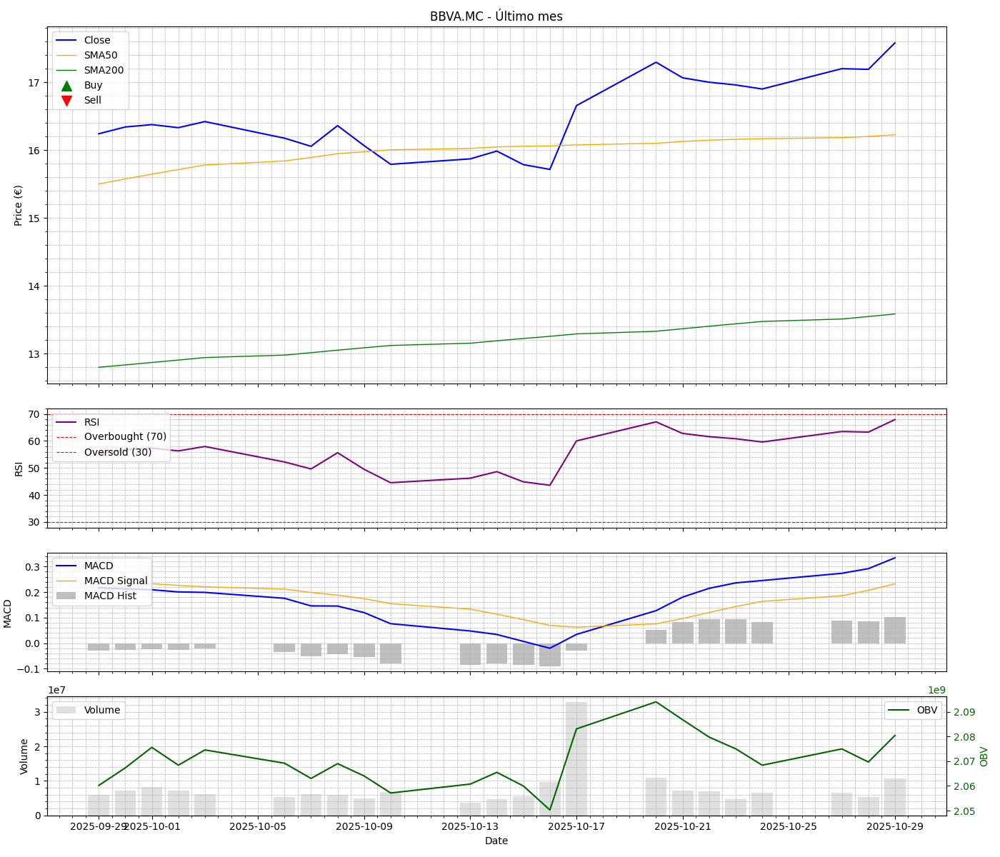

✅ ANÁLISIS COMPLETADO.


In [3]:
# ===============================
# Script optimizado con RSI/MACD, señales, Backtesting y Volumen
# ===============================

# Para habilitar la interactividad de las gráficas en Google Colab (zoom, pan, coordenadas en hover)
# Asegúrate de ejecutar esta línea en una celda separada o al inicio de tu notebook.

# 1. Instalar ipympl para la interactividad de las gráficas
!pip install ipympl --quiet

# 2. Habilitar el backend interactivo de matplotlib
# Asegúrate de ejecutar esta línea en una celda separada o al inicio de tu notebook,
# después de instalar ipympl y preferiblemente después de reiniciar el runtime.
%matplotlib widget

# 3. Instalar las demás librerías (si no están ya instaladas)
!pip install ta-lib yfinance pandas numpy matplotlib --quiet

import yfinance as yf
import pandas as pd
import numpy as np
import talib as ta
import matplotlib.pyplot as plt
from datetime import datetime, timedelta

# -------------------------------
# Configuración
# -------------------------------
SYMBOL = "BBVA.MC"
SMA50_PERIOD = 50
SMA200_PERIOD = 200
RSI_PERIOD = 14
MACD_FAST = 12
MACD_SLOW = 26
MACD_SIGNAL = 9
INITIAL_CAPITAL = 10000 # Capital inicial para el backtesting

# -------------------------------
# Funciones auxiliares
# -------------------------------

def download_stock_data(symbol: str, start_date: str = "1900-01-01") -> pd.DataFrame:
    """
    Descarga datos históricos de un símbolo bursátil.

    Args:
        symbol (str): Símbolo del activo (ej. "BBVA.MC").
        start_date (str): Fecha de inicio para la descarga (formato "YYYY-MM-DD").

    Returns:
        pd.DataFrame: DataFrame con los datos históricos o un DataFrame vacío si falla.
    """
    print(f"✅ Descargando datos históricos para {symbol} desde {start_date}...")
    try:
        end_date = datetime.now().strftime("%Y-%m-%d")
        # Solución al FutureWarning de yfinance: establecer auto_adjust explícitamente
        df = yf.download(symbol, start=start_date, end=end_date, progress=False, auto_adjust=True)

        if df.empty:
            print(f"❌ No se pudieron descargar datos para {symbol}. El DataFrame está vacío.")
            return pd.DataFrame()

        # Limpiar MultiIndex si existe (puede ocurrir con yfinance en algunos casos)
        if isinstance(df.columns, pd.MultiIndex):
            df.columns = df.columns.get_level_values(0)

        print(f"📊 Datos descargados: {len(df)} filas ({df.index[0].date()} → {df.index[-1].date()})")
        return df
    except Exception as e:
        print(f"❌ Error al descargar datos para {symbol}: {e}")
        return pd.DataFrame()

def calculate_technical_indicators(df: pd.DataFrame) -> pd.DataFrame:
    """
    Calcula los indicadores técnicos (SMA, RSI, MACD, OBV) para el DataFrame.

    Args:
        df (pd.DataFrame): DataFrame con los datos de precios.

    Returns:
        pd.DataFrame: DataFrame con los indicadores añadidos.
    """
    if df.empty:
        return df

    close = df['Close'].values.astype(float)
    volume = df['Volume'].values.astype(float) # Obtener datos de volumen

    df['SMA50'] = ta.SMA(close, timeperiod=SMA50_PERIOD)
    df['SMA200'] = ta.SMA(close, timeperiod=SMA200_PERIOD)
    df['RSI'] = ta.RSI(close, timeperiod=RSI_PERIOD)

    macd, macd_signal, _ = ta.MACD(close, fastperiod=MACD_FAST, slowperiod=MACD_SLOW, signalperiod=MACD_SIGNAL)
    df['MACD'] = macd
    df['MACD_signal'] = macd_signal

    df['OBV'] = ta.OBV(close, volume) # Calcular On-Balance Volume

    print("✅ Indicadores calculados.")
    return df

def detect_trading_signals(df: pd.DataFrame) -> pd.DataFrame:
    """
    Detecta señales de compra y venta basadas en el cruce de SMAs.

    Args:
        df (pd.DataFrame): DataFrame con los datos de precios y SMAs.

    Returns:
        pd.DataFrame: DataFrame con la columna 'Signal' actualizada.
    """
    if df.empty:
        return df

    # Solución al FutureWarning de pandas: inicializar la columna 'Signal' como tipo 'object'
    df['Signal'] = pd.Series(dtype='object', index=df.index)

    # Calcular SMAs del día anterior
    prev_sma50 = df['SMA50'].shift(1)
    prev_sma200 = df['SMA200'].shift(1)

    # Condiciones para Buy y Sell
    buy_condition = (prev_sma50 < prev_sma200) & (df['SMA50'] > df['SMA200'])
    sell_condition = (prev_sma50 > prev_sma200) & (df['SMA50'] < df['SMA200'])

    # Asignar señales de forma vectorizada
    df.loc[buy_condition, 'Signal'] = 'Buy'
    df.loc[sell_condition, 'Signal'] = 'Sell'

    buys_count = df['Signal'].value_counts().get('Buy', 0)
    sells_count = df['Signal'].value_counts().get('Sell', 0)
    print(f"✅ Detección de señales completada. Buy={buys_count}, Sell={sells_count}")
    return df

def detect_cross_events(df: pd.DataFrame) -> tuple[pd.DataFrame, pd.DataFrame]:
    """
    Detecta eventos de Golden Cross y Death Cross.

    Args:
        df (pd.DataFrame): DataFrame con los datos de precios y SMAs.

    Returns:
        tuple[pd.DataFrame, pd.DataFrame]: DataFrames con los eventos Golden Cross y Death Cross.
    """
    if df.empty:
        return pd.DataFrame(), pd.DataFrame()

    golden_cross = df[(df['SMA50'] > df['SMA200']) & (df['SMA50'].shift(1) < df['SMA200'].shift(1))].copy()
    death_cross = df[(df['SMA50'] < df['SMA200']) & (df['SMA50'].shift(1) > df['SMA200'].shift(1))].copy()

    return golden_cross, death_cross

def run_simple_backtest(df: pd.DataFrame, initial_capital: float = 10000) -> dict:
    """
    Realiza un backtesting simple de las señales de compra/venta.

    Args:
        df (pd.DataFrame): DataFrame con los datos de precios y la columna 'Signal'.
        initial_capital (float): Capital inicial para el backtesting.

    Returns:
        dict: Diccionario con los resultados del backtesting.
    """
    print(f"\n📈 Ejecutando Backtesting Simple con capital inicial: {initial_capital:.2f}€")

    capital = initial_capital
    shares = 0
    trades = []
    current_trade = None # Para almacenar los detalles de la compra actual

    for i in range(len(df)):
        current_date = df.index[i]
        close_price = df['Close'].iloc[i]
        signal = df['Signal'].iloc[i]

        # Condición de compra
        if signal == 'Buy' and shares == 0:
            if capital > close_price: # Asegurarse de tener suficiente capital para al menos 1 acción
                shares_to_buy = capital // close_price
                shares = shares_to_buy
                capital -= shares * close_price
                current_trade = {
                    'entry_date': current_date,
                    'entry_price': close_price,
                    'shares': shares
                }
                # print(f"  BUY: {shares:.0f} acciones a {close_price:.2f}€ el {current_date.date()}. Capital restante: {capital:.2f}€")

        # Condición de venta
        elif signal == 'Sell' and shares > 0:
            if current_trade: # Asegurarse de que hay una operación de compra abierta
                exit_price = close_price
                capital += shares * exit_price
                profit_loss = (exit_price - current_trade['entry_price']) * shares
                profit_loss_pct = (profit_loss / (current_trade['entry_price'] * shares)) * 100 if (current_trade['entry_price'] * shares) != 0 else 0

                trades.append({
                    'entry_date': current_trade['entry_date'],
                    'entry_price': current_trade['entry_price'],
                    'exit_date': current_date,
                    'exit_price': exit_price,
                    'shares': shares,
                    'profit_loss': profit_loss,
                    'profit_loss_pct': profit_loss_pct
                })
                # print(f"  SELL: {shares:.0f} acciones a {exit_price:.2f}€ el {current_date.date()}. P/L: {profit_loss:.2f}€ ({profit_loss_pct:.2f}%). Capital: {capital:.2f}€")
                shares = 0
                current_trade = None

    # Si hay una posición abierta al final del período, la cerramos al último precio
    if shares > 0 and current_trade:
        exit_price = df['Close'].iloc[-1]
        capital += shares * exit_price
        profit_loss = (exit_price - current_trade['entry_price']) * shares
        profit_loss_pct = (profit_loss / (current_trade['entry_price'] * shares)) * 100 if (current_trade['entry_price'] * shares) != 0 else 0
        trades.append({
            'entry_date': current_trade['entry_date'],
            'entry_price': current_trade['entry_price'],
            'exit_date': df.index[-1],
            'exit_price': exit_price,
            'shares': shares,
            'profit_loss': profit_loss,
            'profit_loss_pct': profit_loss_pct
        })
        # print(f"  FORCED SELL (end of period): {shares:.0f} acciones a {exit_price:.2f}€ el {df.index[-1].date()}. P/L: {profit_loss:.2f}€ ({profit_loss_pct:.2f}%). Capital: {capital:.2f}€")

    total_profit_loss = capital - initial_capital
    total_profit_loss_pct = (total_profit_loss / initial_capital) * 100 if initial_capital != 0 else 0

    winning_trades = [t for t in trades if t['profit_loss'] > 0]
    losing_trades = [t for t in trades if t['profit_loss'] <= 0]

    results = {
        'initial_capital': initial_capital,
        'final_capital': capital,
        'total_profit_loss': total_profit_loss,
        'total_profit_loss_pct': total_profit_loss_pct,
        'num_trades': len(trades),
        'num_winning_trades': len(winning_trades),
        'num_losing_trades': len(losing_trades),
        'win_rate_pct': (len(winning_trades) / len(trades)) * 100 if len(trades) > 0 else 0,
        'avg_profit_per_trade': np.mean([t['profit_loss'] for t in winning_trades]) if winning_trades else 0,
        'avg_loss_per_trade': np.mean([t['profit_loss'] for t in losing_trades]) if losing_trades else 0,
        'trades_details': trades
    }

    print("✅ Backtesting completado.")
    print(f"  Capital Final: {results['final_capital']:.2f}€")
    print(f"  Beneficio/Pérdida Total: {results['total_profit_loss']:.2f}€ ({results['total_profit_loss_pct']:.2f}%)")
    print(f"  Número de Operaciones: {results['num_trades']}")
    print(f"  Operaciones Ganadoras: {results['num_winning_trades']} ({results['win_rate_pct']:.2f}%)")
    if results['num_winning_trades'] > 0:
        print(f"  Beneficio Promedio por Operación Ganadora: {results['avg_profit_per_trade']:.2f}€")
    if results['num_losing_trades'] > 0:
        print(f"  Pérdida Promedio por Operación Perdedora: {results['avg_loss_per_trade']:.2f}€")

    return results


def generate_plots(df: pd.DataFrame, symbol: str):
    """
    Genera y muestra las gráficas de precios, RSI, MACD, Volumen y OBV.

    Args:
        df (pd.DataFrame): DataFrame con los datos y los indicadores.
        symbol (str): Símbolo del activo para el título de las gráficas.
    """
    if df.empty:
        print("No hay datos para graficar.")
        return

    # Asegurarse de que el índice sea de tipo datetime
    df.index = pd.to_datetime(df.index)

    # Filtrar datos para los últimos 6 meses y el último mes
    end_date = df.index[-1]
    start_6m = end_date - pd.DateOffset(months=6)
    start_1m = end_date - pd.DateOffset(months=1)

    last_6m_data = df[df.index >= start_6m].copy()
    last_1m_data = df[df.index >= start_1m].copy()

    plot_periods = [
        (last_6m_data, "Últimos 6 meses"),
        (last_1m_data, "Último mes")
    ]

    for data_subset, title_suffix in plot_periods:
        if data_subset.empty:
            print(f"No hay suficientes datos para graficar {title_suffix}.")
            continue

        # Se añaden 2 subplots más para Volumen y OBV
        fig, (ax1, ax2, ax3, ax4) = plt.subplots(4, 1, figsize=(14, 12), sharex=True, gridspec_kw={'height_ratios': [3, 1, 1, 1]})

        # Gráfica de Precio + SMA
        ax1.plot(data_subset.index, data_subset['Close'], label='Close', color='blue', linewidth=1.5)
        ax1.plot(data_subset.index, data_subset['SMA50'], label='SMA50', color='orange', linewidth=1)
        ax1.plot(data_subset.index, data_subset['SMA200'], label='SMA200', color='green', linewidth=1)

        # Señales Buy/Sell
        buy_signals = data_subset[data_subset['Signal'] == 'Buy']
        sell_signals = data_subset[data_subset['Signal'] == 'Sell']
        ax1.scatter(buy_signals.index, buy_signals['Close'], marker='^', color='green', s=100, label='Buy', zorder=5)
        ax1.scatter(sell_signals.index, sell_signals['Close'], marker='v', color='red', s=100, label='Sell', zorder=5)

        ax1.set_ylabel('Price (€)')
        ax1.set_title(f"{symbol} - {title_suffix}")
        ax1.grid(True, which='both', linestyle='--', linewidth=0.5)
        ax1.minorticks_on()
        ax1.legend(loc='upper left')

        # Gráfica de RSI
        ax2.plot(data_subset.index, data_subset['RSI'], label='RSI', color='purple', linewidth=1.5)
        ax2.axhline(70, color='red', linestyle='--', linewidth=0.8, label='Overbought (70)')
        ax2.axhline(30, color='green', linestyle='--', linewidth=0.8, label='Oversold (30)')
        ax2.set_ylabel('RSI')
        ax2.grid(True, which='both', linestyle='--', linewidth=0.5)
        ax2.minorticks_on()
        ax2.legend(loc='upper left')

        # Gráfica de MACD
        ax3.plot(data_subset.index, data_subset['MACD'], label='MACD', color='blue', linewidth=1.5)
        ax3.plot(data_subset.index, data_subset['MACD_signal'], label='MACD Signal', color='orange', linewidth=1)
        ax3.bar(data_subset.index, data_subset['MACD'] - data_subset['MACD_signal'], label='MACD Hist', color='gray', alpha=0.5)
        ax3.set_ylabel('MACD')
        ax3.grid(True, which='both', linestyle='--', linewidth=0.5)
        ax3.minorticks_on()
        ax3.legend(loc='upper left')

        # Gráfica de Volumen y OBV (Nuevo)
        ax4.bar(data_subset.index, data_subset['Volume'], label='Volume', color='lightgray', alpha=0.7)
        ax4_obv = ax4.twinx() # Eje y secundario para OBV
        ax4_obv.plot(data_subset.index, data_subset['OBV'], label='OBV', color='darkgreen', linewidth=1.5)
        ax4.set_ylabel('Volume')
        ax4_obv.set_ylabel('OBV', color='darkgreen')
        ax4_obv.tick_params(axis='y', labelcolor='darkgreen')
        ax4.grid(True, which='both', linestyle='--', linewidth=0.5)
        ax4.minorticks_on()
        ax4.legend(loc='upper left')
        ax4_obv.legend(loc='upper right')
        ax4.set_xlabel('Date')

        plt.tight_layout() # Ajusta automáticamente los parámetros de la subtrama para que encajen en el área de la figura.
        plt.show()
        plt.close('all') # Cierra la figura para liberar memoria

# -------------------------------
# Función principal refactorizada
# -------------------------------
def run_analysis(symbol: str, initial_capital: float = 10000):
    """
    Función principal para ejecutar el análisis técnico completo, backtesting y graficación.
    """
    print("🏁 INICIO DEL ANÁLISIS")

    df = download_stock_data(symbol)
    if df.empty:
        print("Análisis terminado debido a la falta de datos.")
        return None, None, None, None, None, None

    df = calculate_technical_indicators(df)
    df = detect_trading_signals(df)
    golden_cross, death_cross = detect_cross_events(df)

    # -------------------------------
    # Mostrar resumen
    # -------------------------------
    print("\n📋 Últimas filas del DataFrame:")
    print(df.tail())

    buys = df[df['Signal']=='Buy']
    sells = df[df['Signal']=='Sell']

    print("\n⭐ Últimas señales Buy:")
    print(buys.tail(2))
    print("\n⚠️ Últimas señales Sell:")
    print(sells.tail(2))

    print("\n⭐ Últimos Golden Cross:")
    print(golden_cross.tail(2))
    print("\n⚠️ Últimos Death Cross:")
    print(death_cross.tail(2))

    # -------------------------------
    # Ejecutar Backtesting
    # -------------------------------
    backtest_results = run_simple_backtest(df, initial_capital)

    # -------------------------------
    # Gráficas
    # -------------------------------
    generate_plots(df, symbol)

    print("✅ ANÁLISIS COMPLETADO.")
    return df, buys, sells, golden_cross, death_cross, backtest_results

# =======================
# EJECUCIÓN
# =======================
if __name__ == "__main__":
    df_result, buys_result, sells_result, golden_result, death_result, backtest_results = run_analysis(SYMBOL, INITIAL_CAPITAL)

In [1]:
!pip install ipympl --quiet
%matplotlib widget

In [2]:
from google.colab import output
output.enable_custom_widget_manager()

Support for third party widgets will remain active for the duration of the session. To disable support:

In [ ]:
from google.colab import output
output.disable_custom_widget_manager()

🏁 INICIO DEL ANÁLISIS
✅ Descargando datos históricos para BBVA.MC desde 1900-01-01...
📊 Datos descargados: 6633 filas (2000-01-03 → 2025-10-29)
✅ Indicadores calculados.
✅ Detección de señales completada. Buy=19, Sell=19

📋 Últimas filas del DataFrame:
Price           Close       High        Low       Open    Volume    SMA50  \
Date                                                                        
2025-10-23  16.959999  17.174999  16.900000  17.000000   4720528  16.1581   
2025-10-24  16.900000  17.100000  16.735001  17.014999   6644829  16.1665   
2025-10-27  17.200001  17.235001  17.004999  17.049999   6597073  16.1833   
2025-10-28  17.190001  17.215000  17.040001  17.070000   5314738  16.1991   
2025-10-29  17.580000  17.584999  17.055000  17.209999  10750147  16.2257   

Price          SMA200        RSI      MACD  MACD_signal           OBV Signal  
Date                                                                          
2025-10-23  13.438252  60.816704  0.236075     0.

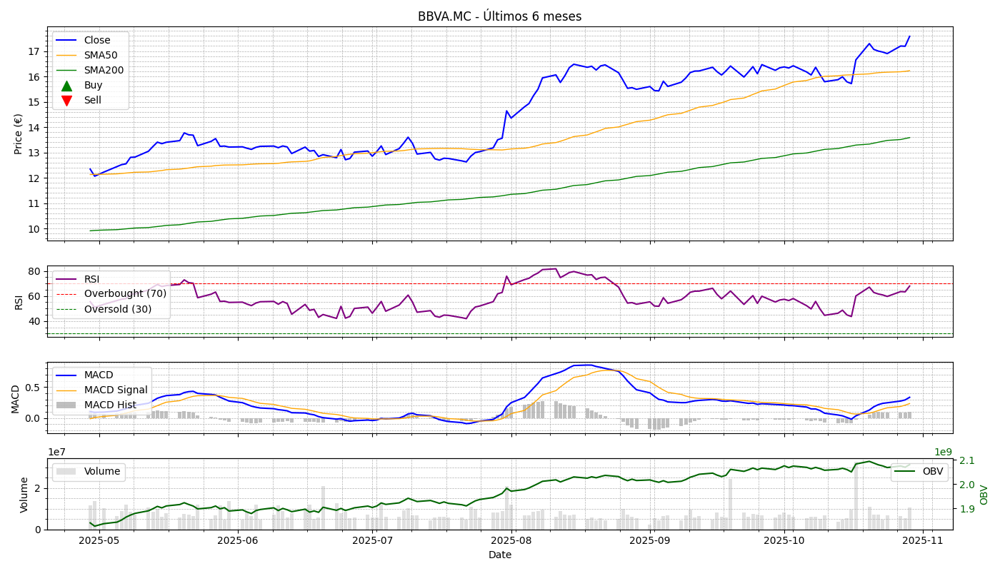

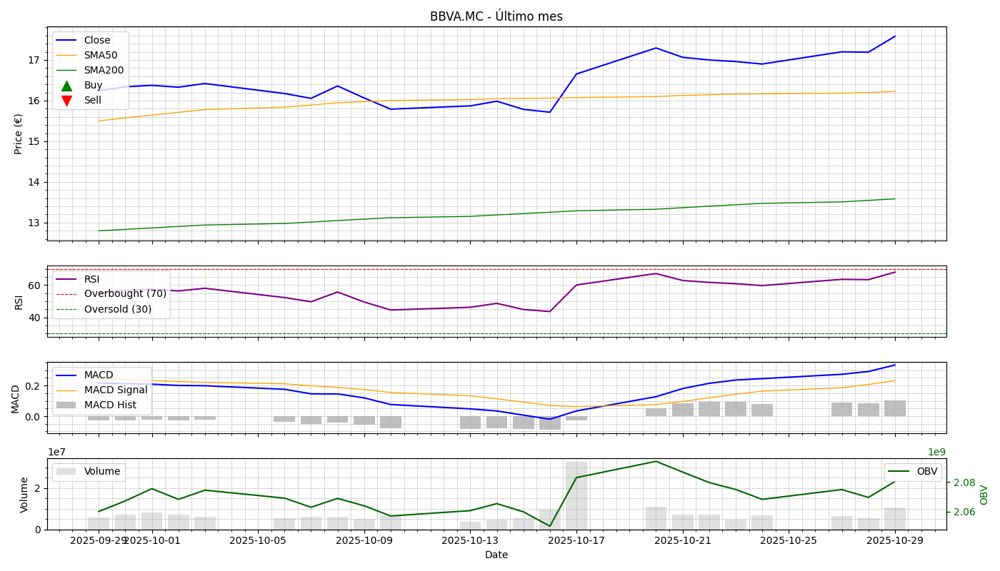

✅ ANÁLISIS COMPLETADO.


In [9]:
# Segunda celda (o siguientes)
!pip install ta-lib yfinance pandas numpy matplotlib --quiet

import yfinance as yf
import pandas as pd
import numpy as np
import talib as ta
import matplotlib.pyplot as plt
from datetime import datetime, timedelta

# -------------------------------
# Configuración
# -------------------------------
SYMBOL = "BBVA.MC"
SMA50_PERIOD = 50
SMA200_PERIOD = 200
RSI_PERIOD = 14
MACD_FAST = 12
MACD_SLOW = 26
MACD_SIGNAL = 9
INITIAL_CAPITAL = 10000 # Capital inicial para el backtesting

# -------------------------------
# Funciones auxiliares (mantener las mismas que te di en la respuesta anterior)
# -------------------------------

def download_stock_data(symbol: str, start_date: str = "1900-01-01") -> pd.DataFrame:
    """
    Descarga datos históricos de un símbolo bursátil.
    """
    print(f"✅ Descargando datos históricos para {symbol} desde {start_date}...")
    try:
        end_date = datetime.now().strftime("%Y-%m-%d")
        df = yf.download(symbol, start=start_date, end=end_date, progress=False, auto_adjust=True)

        if df.empty:
            print(f"❌ No se pudieron descargar datos para {symbol}. El DataFrame está vacío.")
            return pd.DataFrame()

        if isinstance(df.columns, pd.MultiIndex):
            df.columns = df.columns.get_level_values(0)

        print(f"📊 Datos descargados: {len(df)} filas ({df.index[0].date()} → {df.index[-1].date()})")
        return df
    except Exception as e:
        print(f"❌ Error al descargar datos para {symbol}: {e}")
        return pd.DataFrame()

def calculate_technical_indicators(df: pd.DataFrame) -> pd.DataFrame:
    """
    Calcula los indicadores técnicos (SMA, RSI, MACD, OBV) para el DataFrame.
    """
    if df.empty:
        return df

    close = df['Close'].values.astype(float)
    volume = df['Volume'].values.astype(float)

    df['SMA50'] = ta.SMA(close, timeperiod=SMA50_PERIOD)
    df['SMA200'] = ta.SMA(close, timeperiod=SMA200_PERIOD)
    df['RSI'] = ta.RSI(close, timeperiod=RSI_PERIOD)

    macd, macd_signal, _ = ta.MACD(close, fastperiod=MACD_FAST, slowperiod=MACD_SLOW, signalperiod=MACD_SIGNAL)
    df['MACD'] = macd
    df['MACD_signal'] = macd_signal

    df['OBV'] = ta.OBV(close, volume)

    print("✅ Indicadores calculados.")
    return df

def detect_trading_signals(df: pd.DataFrame) -> pd.DataFrame:
    """
    Detecta señales de compra y venta basadas en el cruce de SMAs.
    """
    if df.empty:
        return df

    df['Signal'] = pd.Series(dtype='object', index=df.index)

    prev_sma50 = df['SMA50'].shift(1)
    prev_sma200 = df['SMA200'].shift(1)

    buy_condition = (prev_sma50 < prev_sma200) & (df['SMA50'] > df['SMA200'])
    sell_condition = (prev_sma50 > prev_sma200) & (df['SMA50'] < df['SMA200'])

    df.loc[buy_condition, 'Signal'] = 'Buy'
    df.loc[sell_condition, 'Signal'] = 'Sell'

    buys_count = df['Signal'].value_counts().get('Buy', 0)
    sells_count = df['Signal'].value_counts().get('Sell', 0)
    print(f"✅ Detección de señales completada. Buy={buys_count}, Sell={sells_count}")
    return df

def detect_cross_events(df: pd.DataFrame) -> tuple[pd.DataFrame, pd.DataFrame]:
    """
    Detecta eventos de Golden Cross y Death Cross.
    """
    if df.empty:
        return pd.DataFrame(), pd.DataFrame()

    golden_cross = df[(df['SMA50'] > df['SMA200']) & (df['SMA50'].shift(1) < df['SMA200'].shift(1))].copy()
    death_cross = df[(df['SMA50'] < df['SMA200']) & (df['SMA50'].shift(1) > df['SMA200'].shift(1))].copy()

    return golden_cross, death_cross

def run_simple_backtest(df: pd.DataFrame, initial_capital: float = 10000) -> dict:
    """
    Realiza un backtesting simple de las señales de compra/venta.
    """
    print(f"\n📈 Ejecutando Backtesting Simple con capital inicial: {initial_capital:.2f}€")

    capital = initial_capital
    shares = 0
    trades = []
    current_trade = None

    for i in range(len(df)):
        current_date = df.index[i]
        close_price = df['Close'].iloc[i]
        signal = df['Signal'].iloc[i]

        if signal == 'Buy' and shares == 0:
            if capital > close_price:
                shares_to_buy = capital // close_price
                shares = shares_to_buy
                capital -= shares * close_price
                current_trade = {
                    'entry_date': current_date,
                    'entry_price': close_price,
                    'shares': shares
                }

        elif signal == 'Sell' and shares > 0:
            if current_trade:
                exit_price = close_price
                capital += shares * exit_price
                profit_loss = (exit_price - current_trade['entry_price']) * shares
                profit_loss_pct = (profit_loss / (current_trade['entry_price'] * shares)) * 100 if (current_trade['entry_price'] * shares) != 0 else 0

                trades.append({
                    'entry_date': current_trade['entry_date'],
                    'entry_price': current_trade['entry_price'],
                    'exit_date': current_date,
                    'exit_price': exit_price,
                    'shares': shares,
                    'profit_loss': profit_loss,
                    'profit_loss_pct': profit_loss_pct
                })
                shares = 0
                current_trade = None

    if shares > 0 and current_trade:
        exit_price = df['Close'].iloc[-1]
        capital += shares * exit_price
        profit_loss = (exit_price - current_trade['entry_price']) * shares
        profit_loss_pct = (profit_loss / (current_trade['entry_price'] * shares)) * 100 if (current_trade['entry_price'] * shares) != 0 else 0
        trades.append({
            'entry_date': current_trade['entry_date'],
            'entry_price': current_trade['entry_price'],
            'exit_date': df.index[-1],
            'exit_price': exit_price,
            'shares': shares,
            'profit_loss': profit_loss,
            'profit_loss_pct': profit_loss_pct
        })

    total_profit_loss = capital - initial_capital
    total_profit_loss_pct = (total_profit_loss / initial_capital) * 100 if initial_capital != 0 else 0

    winning_trades = [t for t in trades if t['profit_loss'] > 0]
    losing_trades = [t for t in trades if t['profit_loss'] <= 0]

    results = {
        'initial_capital': initial_capital,
        'final_capital': capital,
        'total_profit_loss': total_profit_loss,
        'total_profit_loss_pct': total_profit_loss_pct,
        'num_trades': len(trades),
        'num_winning_trades': len(winning_trades),
        'num_losing_trades': len(losing_trades),
        'win_rate_pct': (len(winning_trades) / len(trades)) * 100 if len(trades) > 0 else 0,
        'avg_profit_per_trade': np.mean([t['profit_loss'] for t in winning_trades]) if winning_trades else 0,
        'avg_loss_per_trade': np.mean([t['profit_loss'] for t in losing_trades]) if losing_trades else 0,
        'trades_details': trades
    }

    print("✅ Backtesting completado.")
    print(f"  Capital Final: {results['final_capital']:.2f}€")
    print(f"  Beneficio/Pérdida Total: {results['total_profit_loss']:.2f}€ ({results['total_profit_loss_pct']:.2f}%)")
    print(f"  Número de Operaciones: {results['num_trades']}")
    print(f"  Operaciones Ganadoras: {results['num_winning_trades']} ({results['win_rate_pct']:.2f}%)")
    if results['num_winning_trades'] > 0:
        print(f"  Beneficio Promedio por Operación Ganadora: {results['avg_profit_per_trade']:.2f}€")
    if results['num_losing_trades'] > 0:
        print(f"  Pérdida Promedio por Operación Perdedora: {results['avg_loss_per_trade']:.2f}€")

    return results


def generate_plots(df: pd.DataFrame, symbol: str):
    """
    Genera y muestra las gráficas de precios, RSI, MACD, Volumen y OBV.
    """
    if df.empty:
        print("No hay datos para graficar.")
        return

    df.index = pd.to_datetime(df.index)

    end_date = df.index[-1]
    start_6m = end_date - pd.DateOffset(months=6)
    start_1m = end_date - pd.DateOffset(months=1)

    last_6m_data = df[df.index >= start_6m].copy()
    last_1m_data = df[df.index >= start_1m].copy()

    plot_periods = [
        (last_6m_data, "Últimos 6 meses"),
        (last_1m_data, "Último mes")
    ]

    for data_subset, title_suffix in plot_periods:
        if data_subset.empty:
            print(f"No hay suficientes datos para graficar {title_suffix}.")
            continue

        fig, (ax1, ax2, ax3, ax4) = plt.subplots(4, 1, figsize=(14, 8), sharex=True, gridspec_kw={'height_ratios': [3, 1, 1, 1]})

        ax1.plot(data_subset.index, data_subset['Close'], label='Close', color='blue', linewidth=1.5)
        ax1.plot(data_subset.index, data_subset['SMA50'], label='SMA50', color='orange', linewidth=1)
        ax1.plot(data_subset.index, data_subset['SMA200'], label='SMA200', color='green', linewidth=1)

        buy_signals = data_subset[data_subset['Signal'] == 'Buy']
        sell_signals = data_subset[data_subset['Signal'] == 'Sell']
        ax1.scatter(buy_signals.index, buy_signals['Close'], marker='^', color='green', s=100, label='Buy', zorder=5)
        ax1.scatter(sell_signals.index, sell_signals['Close'], marker='v', color='red', s=100, label='Sell', zorder=5)

        ax1.set_ylabel('Price (€)')
        ax1.set_title(f"{symbol} - {title_suffix}")
        ax1.grid(True, which='both', linestyle='--', linewidth=0.5)
        ax1.minorticks_on()
        ax1.legend(loc='upper left')

        ax2.plot(data_subset.index, data_subset['RSI'], label='RSI', color='purple', linewidth=1.5)
        ax2.axhline(70, color='red', linestyle='--', linewidth=0.8, label='Overbought (70)')
        ax2.axhline(30, color='green', linestyle='--', linewidth=0.8, label='Oversold (30)')
        ax2.set_ylabel('RSI')
        ax2.grid(True, which='both', linestyle='--', linewidth=0.5)
        ax2.minorticks_on()
        ax2.legend(loc='upper left')

        ax3.plot(data_subset.index, data_subset['MACD'], label='MACD', color='blue', linewidth=1.5)
        ax3.plot(data_subset.index, data_subset['MACD_signal'], label='MACD Signal', color='orange', linewidth=1)
        ax3.bar(data_subset.index, data_subset['MACD'] - data_subset['MACD_signal'], label='MACD Hist', color='gray', alpha=0.5)
        ax3.set_ylabel('MACD')
        ax3.grid(True, which='both', linestyle='--', linewidth=0.5)
        ax3.minorticks_on()
        ax3.legend(loc='upper left')

        ax4.bar(data_subset.index, data_subset['Volume'], label='Volume', color='lightgray', alpha=0.7)
        ax4_obv = ax4.twinx()
        ax4_obv.plot(data_subset.index, data_subset['OBV'], label='OBV', color='darkgreen', linewidth=1.5)
        ax4.set_ylabel('Volume')
        ax4_obv.set_ylabel('OBV', color='darkgreen')
        ax4_obv.tick_params(axis='y', labelcolor='darkgreen')
        ax4.grid(True, which='both', linestyle='--', linewidth=0.5)
        ax4.minorticks_on()
        ax4.legend(loc='upper left')
        ax4_obv.legend(loc='upper right')
        ax4.set_xlabel('Date')

        plt.tight_layout()
        plt.show()
        # plt.close('all')

# -------------------------------
# Función principal refactorizada
# -------------------------------
def run_analysis(symbol: str, initial_capital: float = 10000):
    """
    Función principal para ejecutar el análisis técnico completo, backtesting y graficación.
    """
    print("🏁 INICIO DEL ANÁLISIS")

    df = download_stock_data(symbol)
    if df.empty:
        print("Análisis terminado debido a la falta de datos.")
        return None, None, None, None, None, None

    df = calculate_technical_indicators(df)
    df = detect_trading_signals(df)
    golden_cross, death_cross = detect_cross_events(df)

    print("\n📋 Últimas filas del DataFrame:")
    print(df.tail())

    buys = df[df['Signal']=='Buy']
    sells = df[df['Signal']=='Sell']

    print("\n⭐ Últimas señales Buy:")
    print(buys.tail(2))
    print("\n⚠️ Últimas señales Sell:")
    print(sells.tail(2))

    print("\n⭐ Últimos Golden Cross:")
    print(golden_cross.tail(2))
    print("\n⚠️ Últimos Death Cross:")
    print(death_cross.tail(2))

    backtest_results = run_simple_backtest(df, initial_capital)

    generate_plots(df, symbol)

    print("✅ ANÁLISIS COMPLETADO.")
    return df, buys, sells, golden_cross, death_cross, backtest_results

# =======================
# EJECUCIÓN
# =======================
if __name__ == "__main__":
    df_result, buys_result, sells_result, golden_result, death_result, backtest_results = run_analysis(SYMBOL, INITIAL_CAPITAL)

In [4]:
!pip show ipympl

Name: ipympl
Version: 0.9.8
Summary: Matplotlib Jupyter Extension
Home-page: http://matplotlib.org/ipympl
Author: 
Author-email: Matplotlib Development Team <matplotlib-users@python.org>
License: Copyright (c) 2016, Matplotlib Contributors
All rights reserved.

Redistribution and use in source and binary forms, with or without
modification, are permitted provided that the following conditions are met:

1. Redistributions of source code must retain the above copyright notice, this
   list of conditions and the following disclaimer.

2. Redistributions in binary form must reproduce the above copyright notice,
   this list of conditions and the following disclaimer in the documentation
   and/or other materials provided with the distribution.

3. Neither the name of the copyright holder nor the names of its
   contributors may be used to endorse or promote products derived from
   this software without specific prior written permission.

THIS SOFTWARE IS PROVIDED BY THE COPYRIGHT HOLDERS 

In [5]:
import matplotlib; print(matplotlib.get_backend())

module://ipympl.backend_nbagg


In [11]:
# ===============================
# Script optimizado con RSI/MACD, señales, Backtesting y Volumen
# ===============================

# 1. Instalar las librerías (si no están ya instaladas)
# Plotly ya suele estar preinstalado en Google Colab, pero lo incluimos por si acaso.
!pip install yfinance pandas numpy ta-lib plotly --quiet

import yfinance as yf
import pandas as pd
import numpy as np
import talib as ta
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from datetime import datetime, timedelta

# -------------------------------
# Configuración
# -------------------------------
SYMBOL = "QUIK"  # "BBVA.MC"
SMA50_PERIOD = 50
SMA200_PERIOD = 200
RSI_PERIOD = 14
MACD_FAST = 12
MACD_SLOW = 26
MACD_SIGNAL = 9
INITIAL_CAPITAL = 10000 # Capital inicial para el backtesting

# -------------------------------
# Funciones auxiliares (sin cambios, ya que no dependen de la librería de graficación)
# -------------------------------

def download_stock_data(symbol: str, start_date: str = "1900-01-01") -> pd.DataFrame:
    """
    Descarga datos históricos de un símbolo bursátil.

    Args:
        symbol (str): Símbolo del activo (ej. "BBVA.MC").
        start_date (str): Fecha de inicio para la descarga (formato "YYYY-MM-DD").

    Returns:
        pd.DataFrame: DataFrame con los datos históricos o un DataFrame vacío si falla.
    """
    print(f"✅ Descargando datos históricos para {symbol} desde {start_date}...")
    try:
        end_date = datetime.now().strftime("%Y-%m-%d")
        df = yf.download(symbol, start=start_date, end=end_date, progress=False, auto_adjust=True)

        if df.empty:
            print(f"❌ No se pudieron descargar datos para {symbol}. El DataFrame está vacío.")
            return pd.DataFrame()

        if isinstance(df.columns, pd.MultiIndex):
            df.columns = df.columns.get_level_values(0)

        print(f"📊 Datos descargados: {len(df)} filas ({df.index[0].date()} → {df.index[-1].date()})")
        return df
    except Exception as e:
        print(f"❌ Error al descargar datos para {symbol}: {e}")
        return pd.DataFrame()

def calculate_technical_indicators(df: pd.DataFrame) -> pd.DataFrame:
    """
    Calcula los indicadores técnicos (SMA, RSI, MACD, OBV) para el DataFrame.

    Args:
        df (pd.DataFrame): DataFrame con los datos de precios.

    Returns:
        pd.DataFrame: DataFrame con los indicadores añadidos.
    """
    if df.empty:
        return df

    close = df['Close'].values.astype(float)
    volume = df['Volume'].values.astype(float)

    df['SMA50'] = ta.SMA(close, timeperiod=SMA50_PERIOD)
    df['SMA200'] = ta.SMA(close, timeperiod=SMA200_PERIOD)
    df['RSI'] = ta.RSI(close, timeperiod=RSI_PERIOD)

    macd, macd_signal, macd_hist = ta.MACD(close, fastperiod=MACD_FAST, slowperiod=MACD_SLOW, signalperiod=MACD_SIGNAL)
    df['MACD'] = macd
    df['MACD_signal'] = macd_signal
    df['MACD_hist'] = macd_hist # Añadimos el histograma directamente

    df['OBV'] = ta.OBV(close, volume)

    print("✅ Indicadores calculados.")
    return df

def detect_trading_signals(df: pd.DataFrame) -> pd.DataFrame:
    """
    Detecta señales de compra y venta basadas en el cruce de SMAs.

    Args:
        df (pd.DataFrame): DataFrame con los datos de precios y SMAs.

    Returns:
        pd.DataFrame: DataFrame con la columna 'Signal' actualizada.
    """
    if df.empty:
        return df

    df['Signal'] = pd.Series(dtype='object', index=df.index)

    prev_sma50 = df['SMA50'].shift(1)
    prev_sma200 = df['SMA200'].shift(1)

    buy_condition = (prev_sma50 < prev_sma200) & (df['SMA50'] > df['SMA200'])
    sell_condition = (prev_sma50 > prev_sma200) & (df['SMA50'] < df['SMA200'])

    df.loc[buy_condition, 'Signal'] = 'Buy'
    df.loc[sell_condition, 'Signal'] = 'Sell'

    buys_count = df['Signal'].value_counts().get('Buy', 0)
    sells_count = df['Signal'].value_counts().get('Sell', 0)
    print(f"✅ Detección de señales completada. Buy={buys_count}, Sell={sells_count}")
    return df

def detect_cross_events(df: pd.DataFrame) -> tuple[pd.DataFrame, pd.DataFrame]:
    """
    Detecta eventos de Golden Cross y Death Cross.

    Args:
        df (pd.DataFrame): DataFrame con los datos de precios y SMAs.

    Returns:
        tuple[pd.DataFrame, pd.DataFrame]: DataFrames con los eventos Golden Cross y Death Cross.
    """
    if df.empty:
        return pd.DataFrame(), pd.DataFrame()

    golden_cross = df[(df['SMA50'] > df['SMA200']) & (df['SMA50'].shift(1) < df['SMA200'].shift(1))].copy()
    death_cross = df[(df['SMA50'] < df['SMA200']) & (df['SMA50'].shift(1) > df['SMA200'].shift(1))].copy()

    return golden_cross, death_cross

def run_simple_backtest(df: pd.DataFrame, initial_capital: float = 10000) -> dict:
    """
    Realiza un backtesting simple de las señales de compra/venta.

    Args:
        df (pd.DataFrame): DataFrame con los datos de precios y la columna 'Signal'.
        initial_capital (float): Capital inicial para el backtesting.

    Returns:
        dict: Diccionario con los resultados del backtesting.
    """
    print(f"\n📈 Ejecutando Backtesting Simple con capital inicial: {initial_capital:.2f}€")

    capital = initial_capital
    shares = 0
    trades = []
    current_trade = None

    for i in range(len(df)):
        current_date = df.index[i]
        close_price = df['Close'].iloc[i]
        signal = df['Signal'].iloc[i]

        if signal == 'Buy' and shares == 0:
            if capital > close_price:
                shares_to_buy = capital // close_price
                shares = shares_to_buy
                capital -= shares * close_price
                current_trade = {
                    'entry_date': current_date,
                    'entry_price': close_price,
                    'shares': shares
                }

        elif signal == 'Sell' and shares > 0:
            if current_trade:
                exit_price = close_price
                capital += shares * exit_price
                profit_loss = (exit_price - current_trade['entry_price']) * shares
                profit_loss_pct = (profit_loss / (current_trade['entry_price'] * shares)) * 100 if (current_trade['entry_price'] * shares) != 0 else 0

                trades.append({
                    'entry_date': current_trade['entry_date'],
                    'entry_price': current_trade['entry_price'],
                    'exit_date': current_date,
                    'exit_price': exit_price,
                    'shares': shares,
                    'profit_loss': profit_loss,
                    'profit_loss_pct': profit_loss_pct
                })
                shares = 0
                current_trade = None

    if shares > 0 and current_trade:
        exit_price = df['Close'].iloc[-1]
        capital += shares * exit_price
        profit_loss = (exit_price - current_trade['entry_price']) * shares
        profit_loss_pct = (profit_loss / (current_trade['entry_price'] * shares)) * 100 if (current_trade['entry_price'] * shares) != 0 else 0
        trades.append({
            'entry_date': current_trade['entry_date'],
            'entry_price': current_trade['entry_price'],
            'exit_date': df.index[-1],
            'exit_price': exit_price,
            'shares': shares,
            'profit_loss': profit_loss,
            'profit_loss_pct': profit_loss_pct
        })

    total_profit_loss = capital - initial_capital
    total_profit_loss_pct = (total_profit_loss / initial_capital) * 100 if initial_capital != 0 else 0

    winning_trades = [t for t in trades if t['profit_loss'] > 0]
    losing_trades = [t for t in trades if t['profit_loss'] <= 0]

    results = {
        'initial_capital': initial_capital,
        'final_capital': capital,
        'total_profit_loss': total_profit_loss,
        'total_profit_loss_pct': total_profit_loss_pct,
        'num_trades': len(trades),
        'num_winning_trades': len(winning_trades),
        'num_losing_trades': len(losing_trades),
        'win_rate_pct': (len(winning_trades) / len(trades)) * 100 if len(trades) > 0 else 0,
        'avg_profit_per_trade': np.mean([t['profit_loss'] for t in winning_trades]) if winning_trades else 0,
        'avg_loss_per_trade': np.mean([t['profit_loss'] for t in losing_trades]) if losing_trades else 0,
        'trades_details': trades
    }

    print("✅ Backtesting completado.")
    print(f"  Capital Final: {results['final_capital']:.2f}€")
    print(f"  Beneficio/Pérdida Total: {results['total_profit_loss']:.2f}€ ({results['total_profit_loss_pct']:.2f}%)")
    print(f"  Número de Operaciones: {results['num_trades']}")
    print(f"  Operaciones Ganadoras: {results['num_winning_trades']} ({results['win_rate_pct']:.2f}%)")
    if results['num_winning_trades'] > 0:
        print(f"  Beneficio Promedio por Operación Ganadora: {results['avg_profit_per_trade']:.2f}€")
    if results['num_losing_trades'] > 0:
        print(f"  Pérdida Promedio por Operación Perdedora: {results['avg_loss_per_trade']:.2f}€")

    return results


def generate_plots_plotly(df: pd.DataFrame, symbol: str):
    """
    Genera y muestra las gráficas de precios, RSI, MACD, Volumen y OBV usando Plotly.

    Args:
        df (pd.DataFrame): DataFrame con los datos y los indicadores.
        symbol (str): Símbolo del activo para el título de las gráficas.
    """
    if df.empty:
        print("No hay datos para graficar.")
        return

    df.index = pd.to_datetime(df.index)

    end_date = df.index[-1]
    start_6m = end_date - pd.DateOffset(months=6)
    start_1m = end_date - pd.DateOffset(months=1)

    last_6m_data = df[df.index >= start_6m]
    last_1m_data = df[df.index >= start_1m]

    plot_periods = [
        (last_6m_data, "Últimos 6 meses"),
        (last_1m_data, "Último mes")
    ]

    for data_subset, title_suffix in plot_periods:
        if data_subset.empty:
            print(f"No hay suficientes datos para graficar {title_suffix}.")
            continue

        # Crear subplots con 4 filas y 1 columna
        # La última fila tendrá un eje Y secundario para OBV
        fig = make_subplots(
            rows=4, cols=1,
            shared_xaxes=True,
            vertical_spacing=0.02,
            row_titles=['Precio y SMAs', 'RSI', 'MACD', 'Volumen y OBV'],
            row_heights=[0.5, 0.15, 0.15, 0.2],
            specs=[[{}], [{}], [{}], [{"secondary_y": True}]] # El último subplot tiene un eje Y secundario
        )

        # --- Gráfica de Precio + SMA (Fila 1) ---
        # Cierre
        fig.add_trace(
            go.Scatter(
                x=data_subset.index,
                y=data_subset['Close'],
                mode='lines',
                name='Cierre',
                line=dict(color='blue', width=1.5),
                hovertemplate='<b>Fecha:</b> %{x|%Y-%m-%d}<br><b>Cierre:</b> %{y:.2f}€<extra></extra>'
            ),
            row=1, col=1
        )
        # SMA50
        if 'SMA50' in data_subset.columns and not data_subset['SMA50'].isnull().all():
            fig.add_trace(
                go.Scatter(
                    x=data_subset.index,
                    y=data_subset['SMA50'],
                    mode='lines',
                    name='SMA50',
                    line=dict(color='orange', width=1),
                    hovertemplate='<b>Fecha:</b> %{x|%Y-%m-%d}<br><b>SMA50:</b> %{y:.2f}€<extra></extra>'
                ),
                row=1, col=1
            )
        # SMA200
        if 'SMA200' in data_subset.columns and not data_subset['SMA200'].isnull().all():
            fig.add_trace(
                go.Scatter(
                    x=data_subset.index,
                    y=data_subset['SMA200'],
                    mode='lines',
                    name='SMA200',
                    line=dict(color='green', width=1),
                    hovertemplate='<b>Fecha:</b> %{x|%Y-%m-%d}<br><b>SMA200:</b> %{y:.2f}€<extra></extra>'
                ),
                row=1, col=1
            )

        # Señales Buy
        buy_signals = data_subset[data_subset['Signal'] == 'Buy']
        if not buy_signals.empty:
            fig.add_trace(
                go.Scatter(
                    x=buy_signals.index,
                    y=buy_signals['Close'],
                    mode='markers',
                    marker=dict(symbol='triangle-up', size=10, color='green'),
                    name='Buy Signal',
                    hovertemplate='<b>Fecha:</b> %{x|%Y-%m-%d}<br><b>Señal:</b> Buy<br><b>Precio:</b> %{y:.2f}€<extra></extra>'
                ),
                row=1, col=1
            )
        # Señales Sell
        sell_signals = data_subset[data_subset['Signal'] == 'Sell']
        if not sell_signals.empty:
            fig.add_trace(
                go.Scatter(
                    x=sell_signals.index,
                    y=sell_signals['Close'],
                    mode='markers',
                    marker=dict(symbol='triangle-down', size=10, color='red'),
                    name='Sell Signal',
                    hovertemplate='<b>Fecha:</b> %{x|%Y-%m-%d}<br><b>Señal:</b> Sell<br><b>Precio:</b> %{y:.2f}€<extra></extra>'
                ),
                row=1, col=1
            )

        # --- Gráfica de RSI (Fila 2) ---
        if 'RSI' in data_subset.columns and not data_subset['RSI'].isnull().all():
            fig.add_trace(
                go.Scatter(
                    x=data_subset.index,
                    y=data_subset['RSI'],
                    mode='lines',
                    name='RSI',
                    line=dict(color='purple', width=1.5),
                    hovertemplate='<b>Fecha:</b> %{x|%Y-%m-%d}<br><b>RSI:</b> %{y:.2f}<extra></extra>'
                ),
                row=2, col=1
            )
            fig.add_hline(y=70, line_dash="dash", line_color="red", annotation_text="Overbought (70)", annotation_position="top left", row=2, col=1)
            fig.add_hline(y=30, line_dash="dash", line_color="green", annotation_text="Oversold (30)", annotation_position="bottom left", row=2, col=1)

        # --- Gráfica de MACD (Fila 3) ---
        if 'MACD' in data_subset.columns and 'MACD_signal' in data_subset.columns and 'MACD_hist' in data_subset.columns:
            fig.add_trace(
                go.Scatter(
                    x=data_subset.index,
                    y=data_subset['MACD'],
                    mode='lines',
                    name='MACD',
                    line=dict(color='blue', width=1.5),
                    hovertemplate='<b>Fecha:</b> %{x|%Y-%m-%d}<br><b>MACD:</b> %{y:.2f}<extra></extra>'
                ),
                row=3, col=1
            )
            fig.add_trace(
                go.Scatter(
                    x=data_subset.index,
                    y=data_subset['MACD_signal'],
                    mode='lines',
                    name='MACD Signal',
                    line=dict(color='orange', width=1),
                    hovertemplate='<b>Fecha:</b> %{x|%Y-%m-%d}<br><b>MACD Signal:</b> %{y:.2f}<extra></extra>'
                ),
                row=3, col=1
            )
            # MACD Histogram: colorear barras positivas/negativas
            fig.add_trace(
                go.Bar(
                    x=data_subset.index,
                    y=data_subset['MACD_hist'],
                    name='MACD Hist',
                    marker_color=['green' if val >= 0 else 'red' for val in data_subset['MACD_hist']],
                    hovertemplate='<b>Fecha:</b> %{x|%Y-%m-%d}<br><b>MACD Hist:</b> %{y:.2f}<extra></extra>'
                ),
                row=3, col=1
            )

        # --- Gráfica de Volumen y OBV (Fila 4) ---
        if 'Volume' in data_subset.columns and not data_subset['Volume'].isnull().all():
            fig.add_trace(
                go.Bar(
                    x=data_subset.index,
                    y=data_subset['Volume'],
                    name='Volumen',
                    marker_color='lightgray',
                    hovertemplate='<b>Fecha:</b> %{x|%Y-%m-%d}<br><b>Volumen:</b> %{y:,}<extra></extra>'
                ),
                row=4, col=1, secondary_y=False # Volumen en el eje Y principal de la fila 4
            )
        if 'OBV' in data_subset.columns and not data_subset['OBV'].isnull().all():
            fig.add_trace(
                go.Scatter(
                    x=data_subset.index,
                    y=data_subset['OBV'],
                    mode='lines',
                    name='OBV',
                    line=dict(color='darkgreen', width=1.5),
                    hovertemplate='<b>Fecha:</b> %{x|%Y-%m-%d}<br><b>OBV:</b> %{y:,}<extra></extra>'
                ),
                row=4, col=1, secondary_y=True # OBV en el eje Y secundario de la fila 4
            )

        # --- Configuración general del layout y ejes ---
        fig.update_layout(
            title_text=f'Análisis Técnico para {symbol} - {title_suffix}',
            height=800, # Altura total de la figura
            xaxis_rangeslider_visible=False, # Oculta el rangeslider por defecto
            hovermode='x unified', # ¡Esto es clave para el tooltip flotante unificado!
            legend=dict(orientation="h", yanchor="bottom", y=1.02, xanchor="right", x=1) # Leyenda en la parte superior
        )

        # Ocultar el rangeslider en todos los ejes X y configurar títulos de eje
        for i in range(1, 5): # Para las 4 filas
            fig.update_xaxes(rangeslider_visible=False, row=i, col=1)
            fig.update_yaxes(title_text='Precio (€)', row=1, col=1)
            fig.update_yaxes(title_text='RSI', row=2, col=1)
            fig.update_yaxes(title_text='MACD', row=3, col=1)
            fig.update_yaxes(title_text='Volumen', row=4, col=1, secondary_y=False)
            fig.update_yaxes(title_text='OBV', row=4, col=1, secondary_y=True)

        fig.show()

# -------------------------------
# Función principal refactorizada
# -------------------------------
def run_analysis(symbol: str, initial_capital: float = 10000):
    """
    Función principal para ejecutar el análisis técnico completo, backtesting y graficación.
    """
    print("🏁 INICIO DEL ANÁLISIS")

    df = download_stock_data(symbol)
    if df.empty:
        print("Análisis terminado debido a la falta de datos.")
        return None, None, None, None, None, None

    df = calculate_technical_indicators(df)
    df = detect_trading_signals(df)
    golden_cross, death_cross = detect_cross_events(df)

    # -------------------------------
    # Mostrar resumen
    # -------------------------------
    print("\n📋 Últimas filas del DataFrame:")
    print(df.tail())

    buys = df[df['Signal']=='Buy']
    sells = df[df['Signal']=='Sell']

    print("\n⭐ Últimas señales Buy:")
    print(buys.tail(2))
    print("\n⚠️ Últimas señales Sell:")
    print(sells.tail(2))

    print("\n⭐ Últimos Golden Cross:")
    print(golden_cross.tail(2))
    print("\n⚠️ Últimos Death Cross:")
    print(death_cross.tail(2))

    # -------------------------------
    # Ejecutar Backtesting
    # -------------------------------
    backtest_results = run_simple_backtest(df, initial_capital)

    # -------------------------------
    # Gráficas (¡Ahora con Plotly!)
    # -------------------------------
    generate_plots_plotly(df, symbol) # Llamamos a la nueva función de Plotly

    print("✅ ANÁLISIS COMPLETADO.")
    return df, buys, sells, golden_cross, death_cross, backtest_results

# =======================
# EJECUCIÓN
# =======================
if __name__ == "__main__":
    df_result, buys_result, sells_result, golden_result, death_result, backtest_results = run_analysis(SYMBOL, INITIAL_CAPITAL)

🏁 INICIO DEL ANÁLISIS
✅ Descargando datos históricos para QUIK desde 1900-01-01...
📊 Datos descargados: 6550 filas (1999-10-18 → 2025-10-30)
✅ Indicadores calculados.
✅ Detección de señales completada. Buy=17, Sell=18

📋 Últimas filas del DataFrame:
Price       Close  High   Low  Open  Volume   SMA50   SMA200        RSI  \
Date                                                                      
2025-10-24   7.02  7.27  6.57  6.63  261800  5.9396  6.20535  57.275915   
2025-10-27   6.72  7.15  6.70  7.03  178200  5.9616  6.19275  53.405659   
2025-10-28   6.80  6.92  6.61  6.62   97800  5.9842  6.18250  54.292629   
2025-10-29   7.40  7.62  6.84  6.85  317900  6.0198  6.17710  60.383700   
2025-10-30   7.10  7.39  7.05  7.20  122846  6.0508  6.17005  56.340866   

Price           MACD  MACD_signal  MACD_hist         OBV Signal  
Date                                                             
2025-10-24  0.229503     0.245641  -0.016138  18293423.0    NaN  
2025-10-27  0.217220     0

✅ ANÁLISIS COMPLETADO.
